# Observations

This code was developed locally on my personal computer. You might need to change some imports like the `pytorch_lightning` import depending on your environment. On Google Colab it's possible the import will have a different name.

The code was implemented using pytorch lightining and using an RTX 3080 ti GPU with 12 GB of VRAM. If the available GPU you're using has less VRAM, it's likely that you'll need to reduce the number of workers and the batch size.

This notebook contains images of some plots of the training sessions that might not render properly in Google Colab, as they're links to images in the Github repository.

# Summary

This notebook contains the training of a fully supervised model, the finetuning training of the SWaV Resnet 50 model and the training of a supervised model using the SWaV Resnet 50 as the backbone. It aims to simulate an environment where only few labeled samples are available, so the dataset was divided such that most of the samples are used for the finetuning and only few remain for the supervised training (divided into a train, test and validation set). It also aims to demonstrate the advantages of using Self Supervised Representation Learning (SSRL) in such conditions.

We ran the experiment 2 times, on the first time we had a few thousand samples for the supervised training which proved to be sufficient data for a supervised method to solve the problem completely. We then ran the experiment a second time, this time making the supervised training set have only 50 samples, 25 of each label. This time we also spent more time trying to fine tune the SWaV model, although we couldn't get to a performance improvement with the finetuning. Finally, at the end of second run of the experiment, the model using SWaV reached significantly better performance than the fully supervised model, achieving our objective.


This notebook is basically divided into the 2 runs of the experiment and each run follows this structure in the notebook:

- Load the dataset
- Fully Supervised Training
  - Model code definition
  - Model Training
  - Model loading from checkpoint
- Finetuning the SWaV model
  - Model code definition
  - Training (finetuning)
  - Display of representations before and after fine tune
- Supervised model using SWaV (in SSRL terms, the downstream task model)
  - Model code definition
  - Model Training
  - Model loading from checkpoint
- Conclusion


On the second experiment we spent many tries varying the hyperparameters and the training setup slightly, trying to achieve a better result. That's why there are many similar, almost copied, code cells in that section.


# Running the experiment for the first time

## Load the dataset

Let's seed everything and then load the dataset.

The code below assumes that dataset will be available on a local folder of the computer, pointed at by the `dataset_folder`. You can do it two ways:


If you're running the code locally

- Download the dataset from Kaggle: https://www.kaggle.com/datasets/airbusgeo/airbus-wind-turbines-patches/data

- Extract the data into a local folder and set `dataset_folder` to the absolute path to that folder.

Or, if you're in colab

- Download the dataset from Kaggle: https://www.kaggle.com/datasets/airbusgeo/airbus-wind-turbines-patches/data

- Upload it to the archives of the current session

- Set `dataset_folder` to the relative path of the uploaded folder.

Or, another way, which will be slower

- Download the dataset from Kaggle: https://www.kaggle.com/datasets/airbusgeo/airbus-wind-turbines-patches/data

- Upload it to Google Drive

- Uncomment the cell that mounts Google Drive in colab

- Set `dataset_folder` to the path inside the mounted Google Drive to the dataset folder.


In [ ]:
import random
import numpy as np
import torch
import pytorch_lightning as pl

SEED = 172

# Set seed for Python's random module
random.seed(SEED)

# Set seed for NumPy
np.random.seed(SEED)

# Set seed for PyTorch
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)  # if you are using multi-GPU.

# Set seed for PyTorch Lightning
pl.seed_everything(SEED)

Seed set to 172


172

In [ ]:
# Code to mount google drive in Google Colab.

# from google.colab import drive
# import pandas as pd
# import os
# drive.mount('/content/gdrive', force_remount=True)


# You theoretically can access the dataset through the network stored in Google Drive, like so:
# dataset_folder = "/content/gdrive/MyDrive/MC959 - Datasets/Airbus Wind Turbines Patches"

# However, using this approach would probably be slow. Use the approach in the cell below instead.

In [ ]:
# If on Google Colab, use the following code to unzip the dataset

# Upload the kaggle dataset archive to 'kaggle-dataset-archive.zip'
# in the Files panel

# The unzip process takes around 4 minutes
# !apt-get install unzip
# !unzip '/content/gdrive/MyDrive/MC959 - Datasets/Airbus Wind Turbines Patches/kaggle-dataset-archive.zip' -d './Airbus Wind Turbines Patches/'
# # !unzip kaggle-dataset-archive.zip -d './Airbus Wind Turbines Patches/'
# dataset_folder = './Airbus Wind Turbines Patches/'

In [2]:
# When in local development, just download and extract the dataset into a folder
# and set the dataset_folder variable to the path of that folder
dataset_folder = 'C:\\Users\\diego\\Documents\\TEMP_MC959\\Airbus Wind Turbines Patches'

In [3]:
import os

base_train_background_filenames = [os.path.join(dataset_folder, 'train', 'background', file) for file in os.listdir(f'{dataset_folder}/train/background')]
base_train_target_filenames = [os.path.join(dataset_folder, 'train', 'target', file) for file in os.listdir(f'{dataset_folder}/train/target')]
base_val_background_filenames = [os.path.join(dataset_folder, 'val', 'background', file) for file in os.listdir(f'{dataset_folder}/val/background')]
base_val_target_filenames = [os.path.join(dataset_folder, 'val', 'target', file) for file in os.listdir(f'{dataset_folder}/val/target')]

In [4]:
all_background_filenames = base_train_background_filenames + base_val_background_filenames
all_target_filenames = base_train_target_filenames + base_val_target_filenames

from sklearn.model_selection import train_test_split

# Split the entire dataset into a dataset used for fine-tuning and the rest (used for later stages)
fine_tuning_background_filenames, rest_background_filenames = train_test_split(all_background_filenames, test_size=0.25, random_state=SEED)
fine_tuning_target_filenames, rest_target_filenames = train_test_split(all_target_filenames, test_size=0.25, random_state=SEED)

# Split the rest dataset into 70% train, 15% test, 15% validation
train_background_filenames, rest_background_filenames = train_test_split(rest_background_filenames, test_size=0.3, random_state=SEED)
valid_background_filenames, test_background_filenames = train_test_split(rest_background_filenames, test_size=0.5, random_state=SEED)

train_target_filenames, rest_target_filenames = train_test_split(rest_target_filenames, test_size=0.3, random_state=SEED)
valid_target_filenames, test_target_filenames = train_test_split(rest_target_filenames, test_size=0.5, random_state=SEED)

In [10]:
len(all_background_filenames), len(all_target_filenames), len(all_background_filenames) + len(all_target_filenames)

(243078, 180179, 423257)

In [5]:
import numpy as np
from PIL import Image
from torch.utils.data import Dataset
import torchvision.transforms.v2 as transforms

# Reads the image from the filesystem when needed, to avoid overflowing RAM
class AirbusDataset(Dataset):
  def __init__(self, background_filenames, target_filenames, transform=None, target_transform=None):
    all_filenames_with_label = [(f,0) for f in background_filenames] + \
                               [(f,1) for f in target_filenames]
    self.filenames = [file_name_label[0] for file_name_label in all_filenames_with_label]
    self.labels = [file_name_label[1] for file_name_label in all_filenames_with_label]

    self.images = self.filenames
    # self.images = [Image.open(filename) for filename in filenames]
    # self.images = [np.asarray(pil_image) for pil_image in self.images]

    self.transform = transform
    self.target_transform = target_transform

    #   self.images = [transform(image) for image in self.images]

  def __len__(self):
    return len(self.filenames)

  def __getitem__(self, idx):
    '''
    Return a tuple with the image and the respective target at position idx.
    '''
    image = Image.open(self.images[idx])
    label = self.labels[idx]

    if self.transform != None:
      image = self.transform(image)
      
    if self.target_transform != None:
      label = self.target_transform(label)

    return image, label

preprocess_transform = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

train_dataset = AirbusDataset(
    train_background_filenames,
    train_target_filenames,
    transform=preprocess_transform
  )

valid_dataset = AirbusDataset(
    valid_background_filenames,
    valid_target_filenames,
    transform=preprocess_transform
  )

test_dataset = AirbusDataset(
    test_background_filenames,
    test_target_filenames,
    transform=preprocess_transform
  )

fine_tuning_dataset = AirbusDataset(
    fine_tuning_background_filenames,
    fine_tuning_target_filenames,
    transform=preprocess_transform
  )

d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\transforms\v2\_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


In [6]:
print(f'Train dataset size: {len(train_dataset)}')
print(f'Validation dataset size: {len(valid_dataset)}')
print(f'Test dataset size: {len(test_dataset)}')
print(f'Fine-tuning dataset size: {len(fine_tuning_dataset)}')

Train dataset size: 74070
Validation dataset size: 15872
Test dataset size: 15873
Fine-tuning dataset size: 317442


Number of images: 74070
Images are 224x224x3
Class of the image:  0


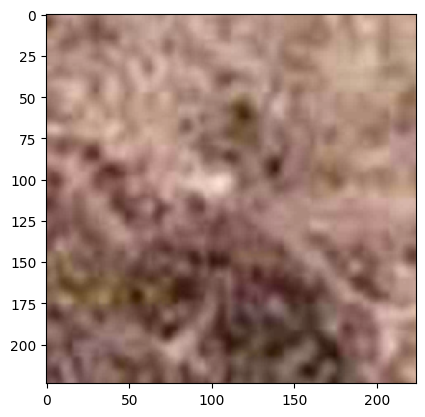

Class of the image:  0


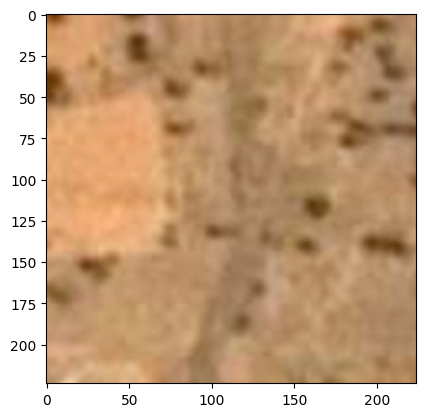

Class of the image:  0


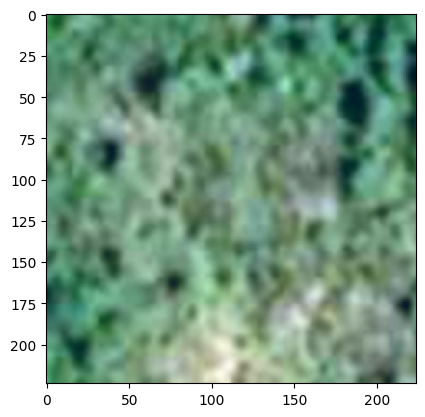

In [8]:
import matplotlib.pyplot as plt
# Visualize images from the training set

def show_image(idx):
  image, target = train_dataset[idx] # This will execute the '__getitem__' method
  nchannels = image.shape[0]
  height    = image.shape[1]
  width     = image.shape[2]
  image     = image.permute(1,2,0).numpy() # Converts the Tensor back to image shape
  image     = 255*(image - np.min(image))/(np.max(image)-np.min(image))
  image     = image.astype('uint8')
  plt.imshow(image)
  print("Class of the image: ", target)
  plt.show()

print("Number of images:", len(train_dataset))
sample_image, target = train_dataset[100] # This will execute the '__getitem__' method
nchannels = sample_image.shape[0]
height    = sample_image.shape[1]
width     = sample_image.shape[2]
print("Images are {}x{}x{}".format(width,height,nchannels))

show_image(10)
show_image(50)
show_image(100)

## Dependencies

In [24]:
!pip install tensorboard seaborn matplotlib lightly scikit-learn torchmetrics


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


## Fully Supervised Training

### Using GPU

In [11]:
import torch
import torchvision
from torch import nn
import pytorch_lightning as pl

In [12]:
if not torch.cuda.is_available():
  print("GPU not available!")

accelerator = "gpu" if torch.cuda.is_available() else "cpu"

In [13]:
!pip install seaborn


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


### Model (Generic CNN with Fully Connected Layers)

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

class SupervisedCNN(pl.LightningModule):
    def __init__(self):
        super().__init__()
        # Instantiate the ResNet backbone
        # resnet = torchvision.models.resnet18(pretrained=True)
        self.network = nn.Sequential(
            nn.Conv2d(3, 6, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4)),
            nn.ReLU(),
            nn.BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
            nn.Conv2d(6, 18, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2)),
            nn.ReLU(),
            nn.BatchNorm2d(18, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
            nn.Conv2d(18, 54, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
            nn.ReLU(),
            nn.BatchNorm2d(54, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
            nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
            nn.Flatten(start_dim=1, end_dim=-1),
            nn.Linear(in_features=42336, out_features=864, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=864, out_features=120, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=120, out_features=60, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=60, out_features=10, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=10, out_features=2, bias=True),
        )

        self._initialize_weights()

        # Initialize losses and accuracies list for tracking loss over epochs
        self.train_losses = []
        self.train_accuracies = []
        self.val_losses = []
        self.val_accuracies = []
        self.test_losses = []
        self.test_accuracies = []
        
        # Store predictions and labels for confusion matrix
        self.val_preds = []
        self.val_labels = []
        self.test_preds = []
        self.test_labels = []

    def _initialize_weights(self):
      '''
      Initialize the network weights using the Xavier initialization.
      '''
      for x in self.modules():
        if isinstance(x, nn.Linear):
          torch.nn.init.xavier_uniform_(x.weight.data)
          if (x.bias is not None):
            x.bias.data.zero_()

    def forward(self, x):
        logits = self.network(x).flatten(start_dim=1)
        return logits

    def criterion(self, preds, targets): # , device):
      '''
      Function that calculates the loss and accuracy of a batch predicted by the model.
      '''
      ce            = nn.CrossEntropyLoss() # .to(device) # You don't need to change the loss function (but you can if it makes sense on your analysis)
      loss          = ce(preds, targets.long())
      pred_labels   = torch.max(preds.data, 1)[1] # same as argmax
      acc           = torch.sum(pred_labels == targets.data)
      n             = pred_labels.size(0)
      acc           = acc/n

      return loss, acc

    def training_step(self, batch, batch_idx):
        ims, targets = batch
        self.forward(ims)
        preds = self.network(ims)
        loss, acc = self.criterion(preds, targets) #, accelerator)

        # Store the loss value for plotting later
        self.train_losses.append(loss)
        self.train_accuracies.append(acc)
        self.log("train_loss", loss, prog_bar=True)
        self.log("train_accuracy", acc, prog_bar=True)

        return loss

    def validation_step(self, batch, batch_idx):
        ims, targets = batch
        self.forward(ims)
        preds = self.network(ims)
        loss, acc = self.criterion(preds, targets) #, accelerator)

        self.val_preds.append(preds.argmax(dim=1))
        self.val_labels.append(targets)
        
        self.val_losses.append(loss)
        self.val_accuracies.append(acc)
        self.log("val_loss", loss, prog_bar=True)
        self.log("val_accuracy", acc, prog_bar=True)
        
    def test_step(self, batch, batch_idx):
        ims, targets = batch
        self.forward(ims)
        preds = self.network(ims)
        loss, acc = self.criterion(preds, targets) #, accelerator)

        self.test_preds.append(preds.argmax(dim=1))
        self.test_labels.append(targets)
        
        self.test_losses.append(loss)
        self.test_accuracies.append(acc)
        self.log("test_loss", loss, prog_bar=True)
        self.log("test_accuracy", acc, prog_bar=True)

    def on_epoch_end(self):
        # Calculate and print average loss at the end of each epoch
        avg_loss = sum(self.losses) / len(self.losses) if self.losses else 0.0
        avg_accuracy = sum(self.accuracies) / len(self.accuracies) if self.accuracies else 0.0
        print(f"Epoch {self.current_epoch + 1}, Average Loss: {avg_loss:.4f}, Average Accuracy: {avg_accuracy:.4f}")

        # Clear losses, acuracies for the next epoch
        self.losses.clear()
        self.accuracies.clear()
        
    def on_validation_epoch_end(self):
        val_preds = torch.cat(self.val_preds)
        val_labels = torch.cat(self.val_labels)

        # Compute confusion matrix
        cm = confusion_matrix(val_labels.cpu().numpy(), val_preds.cpu().numpy())
        
        # Plot confusion matrix
        self.plot_confusion_matrix(cm)

        # Clear stored predictions and labels for the next epoch
        self.val_preds.clear()
        self.val_labels.clear()
    
    def on_test_epoch_end(self):
        test_preds = torch.cat(self.test_preds)
        test_labels = torch.cat(self.test_labels)

        # Compute confusion matrix
        cm = confusion_matrix(test_labels.cpu().numpy(), test_preds.cpu().numpy())
        
        # Plot confusion matrix
        self.plot_confusion_matrix(cm)

        # Clear stored predictions and labels for the next epoch
        self.test_preds.clear()
        self.test_labels.clear()

    def plot_confusion_matrix(self, cm, test=False):
        fig, ax = plt.subplots(figsize=(5, 4))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=ax)
        ax.set_xlabel("Predicted labels")
        ax.set_ylabel("True labels")
        ax.set_title("Confusion Matrix")

        # Log confusion matrix to TensorBoard
        self.logger.experiment.add_figure(f"{"Test" if test else "Validation"} Confusion Matrix", fig, self.current_epoch)
        plt.close(fig)

    def configure_optimizers(self):
        optim = torch.optim.Adam(self.parameters(), lr=0.001)
        return optim

supervised_model = SupervisedCNN()

# Test
supervised_model.eval()
supervised_model.forward(train_dataset[0][0].unsqueeze(0))

tensor([[0.0590, 0.0436]], grad_fn=<AddmmBackward0>)

#### Model Training

In [15]:
torch.set_float32_matmul_precision('medium')

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks.early_stopping import EarlyStopping

checkpoints_folder = './supervised_checkpoints'
checkpoint_path = os.path.join(checkpoints_folder, 'tensorboard_logs/fully_supervised/version_0/checkpoints/epoch=7-step=1160.ckpt')
tensorboard_logs = checkpoints_folder + '/tensorboard_logs'

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0

if os.path.exists(checkpoint_path):
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger(tensorboard_logs, name="fully_supervised")

  os.makedirs(checkpoints_folder, exist_ok=True)
  trainer = pl.Trainer(
      logger=logger,
      max_epochs=100,
      devices=1,
      accelerator=accelerator,
      default_root_dir=checkpoints_folder,
      callbacks=[EarlyStopping(monitor="val_loss", mode="min")]
    )


  train_dataloader = torch.utils.data.DataLoader(
      train_dataset,
      batch_size=512,
      shuffle=True,
      # drop_last=True,
      num_workers=NUM_WORKERS,
  )

  valid_dataloader = torch.utils.data.DataLoader(
      valid_dataset,
      batch_size=256,
      shuffle=False,
      num_workers=NUM_WORKERS,
  )

  trainer.fit(
      model=supervised_model,
      train_dataloaders=train_dataloader,
      val_dataloaders=valid_dataloader,
      # ckpt_path="/content/gdrive/MyDrive/MC959 - Projeto/supervised_checkpoints/lightning_logs/version_2/checkpoints/epoch=3-step=1206.ckpt"
    )

Skipping training, loading model from checkpoint


#### Model Training Charts

![fully_supervised_train_accuracy.png](./notebook_images/fully_supervised_train_accuracy.png)
![fully_supervised_train_loss.png](./notebook_images/fully_supervised_train_loss.png)
![fully_supervised_val_accuracy.png](./notebook_images/fully_supervised_val_accuracy.png)
![fully_supervised_val_loss.png](./notebook_images/fully_supervised_val_loss.png)

Final validation confusion matrix

![fully_supervised_val_confusion_matrix_at_end.png](./notebook_images/fully_supervised_val_confusion_matrix_at_end.png)

#### Model loading from checkpoint (and code to compute test accuracy)

In [16]:
# Define the path to the checkpoint file
checkpoint_path = os.path.join(checkpoints_folder, 'tensorboard_logs/fully_supervised/version_0/checkpoints/epoch=7-step=1160.ckpt')

# Load the model from the checkpoint
loaded_model = SupervisedCNN.load_from_checkpoint(checkpoint_path)
logger = TensorBoardLogger(tensorboard_logs, name="fully_supervised_loaded")

loaded_model_trainer = pl.Trainer(
    logger=logger,
    max_epochs=100,
    devices=1,
    accelerator=accelerator,
    default_root_dir=checkpoints_folder,
    callbacks=[EarlyStopping(monitor="val_loss", mode="min")]
  )

# Move the model to the appropriate device
loaded_model.to(device='cuda')

# Set the model to evaluation mode
loaded_model.eval()

# Test the loaded model with a sample image
loaded_model.forward(train_dataset[0][0].unsqueeze(0).to(device='cuda'))

SHOULD_TEST = False

if SHOULD_TEST:
  # Create a DataLoader for the test dataset
  test_dataloader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=256,
    shuffle=False,
    num_workers=NUM_WORKERS,
  )

  trainer = pl.Trainer(
      logger=logger,
      max_epochs=100,
      devices=1,
      accelerator=accelerator,
      default_root_dir=checkpoints_folder,
      callbacks=[EarlyStopping(monitor="val_loss", mode="min")]
    )

  trainer.test(loaded_model, dataloaders=test_dataloader)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


### Model with Resnet 18 + Fully connected layers

In [20]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

class SupervisedResNetCNN(pl.LightningModule):
    def __init__(self):
        super().__init__()
        
        # Instantiate the ResNet backbone
        resnet = torchvision.models.resnet18(pretrained=False)
        self.network = nn.Sequential(
            nn.Sequential(*list(resnet.children())[:-1]),
            nn.Flatten(start_dim=1, end_dim=-1),
            # nn.Linear(in_features=1000, out_features=864, bias=True),
            # nn.ReLU(),
            nn.Linear(in_features=512, out_features=120, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=120, out_features=60, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=60, out_features=10, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=10, out_features=2, bias=True),
        )

        self._initialize_weights()

        # Initialize losses and accuracies list for tracking loss over epochs
        self.train_losses = []
        self.train_accuracies = []
        self.val_losses = []
        self.val_accuracies = []
        self.test_losses = []
        self.test_accuracies = []
        
        # Store predictions and labels for confusion matrix
        self.val_preds = []
        self.val_labels = []
        self.test_preds = []
        self.test_labels = []

    def _initialize_weights(self):
      '''
      Initialize the network weights using the Xavier initialization.
      '''
      for x in self.modules():
        if isinstance(x, nn.Linear):
          torch.nn.init.xavier_uniform_(x.weight.data)
          if (x.bias is not None):
            x.bias.data.zero_()

    def forward(self, x):
        logits = self.network(x).flatten(start_dim=1)
        return logits

    def criterion(self, preds, targets): # , device):
      '''
      Function that calculates the loss and accuracy of a batch predicted by the model.
      '''
      ce            = nn.CrossEntropyLoss() # .to(device) # You don't need to change the loss function (but you can if it makes sense on your analysis)
      loss          = ce(preds, targets.long())
      pred_labels   = torch.max(preds.data, 1)[1] # same as argmax
      acc           = torch.sum(pred_labels == targets.data)
      n             = pred_labels.size(0)
      acc           = acc/n

      return loss, acc

    def training_step(self, batch, batch_idx):
        ims, targets = batch
        self.forward(ims)
        preds = self.network(ims)
        loss, acc = self.criterion(preds, targets) #, accelerator)

        # Store the loss value for plotting later
        self.train_losses.append(loss)
        self.train_accuracies.append(acc)
        self.log("train_loss", loss, prog_bar=True)
        self.log("train_accuracy", acc, prog_bar=True)

        return loss

    def validation_step(self, batch, batch_idx):
        ims, targets = batch
        self.forward(ims)
        preds = self.network(ims)
        loss, acc = self.criterion(preds, targets) #, accelerator)

        self.val_preds.append(preds.argmax(dim=1))
        self.val_labels.append(targets)
        
        self.val_losses.append(loss)
        self.val_accuracies.append(acc)
        self.log("val_loss", loss, prog_bar=True)
        self.log("val_accuracy", acc, prog_bar=True)
        
    def test_step(self, batch, batch_idx):
        ims, targets = batch
        self.forward(ims)
        preds = self.network(ims)
        loss, acc = self.criterion(preds, targets) #, accelerator)

        self.test_preds.append(preds.argmax(dim=1))
        self.test_labels.append(targets)
        
        self.test_losses.append(loss)
        self.test_accuracies.append(acc)
        self.log("test_loss", loss, prog_bar=True)
        self.log("test_accuracy", acc, prog_bar=True)

    def on_epoch_end(self):
        # Calculate and print average loss at the end of each epoch
        avg_loss = sum(self.losses) / len(self.losses) if self.losses else 0.0
        avg_accuracy = sum(self.accuracies) / len(self.accuracies) if self.accuracies else 0.0
        print(f"Epoch {self.current_epoch + 1}, Average Loss: {avg_loss:.4f}, Average Accuracy: {avg_accuracy:.4f}")

        # Clear losses, acuracies for the next epoch
        self.losses.clear()
        self.accuracies.clear()
        
    def on_validation_epoch_end(self):
        val_preds = torch.cat(self.val_preds)
        val_labels = torch.cat(self.val_labels)

        # Compute confusion matrix
        cm = confusion_matrix(val_labels.cpu().numpy(), val_preds.cpu().numpy())
        
        # Plot confusion matrix
        self.plot_confusion_matrix(cm)

        # Clear stored predictions and labels for the next epoch
        self.val_preds.clear()
        self.val_labels.clear()
    
    def on_test_epoch_end(self):
        test_preds = torch.cat(self.test_preds)
        test_labels = torch.cat(self.test_labels)

        # Compute confusion matrix
        cm = confusion_matrix(test_labels.cpu().numpy(), test_preds.cpu().numpy())
        
        # Plot confusion matrix
        self.plot_confusion_matrix(cm)

        # Clear stored predictions and labels for the next epoch
        self.test_preds.clear()
        self.test_labels.clear()

    def plot_confusion_matrix(self, cm, test=False):
        fig, ax = plt.subplots(figsize=(5, 4))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=ax)
        ax.set_xlabel("Predicted labels")
        ax.set_ylabel("True labels")
        ax.set_title("Confusion Matrix")

        # Log confusion matrix to TensorBoard
        self.logger.experiment.add_figure(f"{"Test" if test else "Validation"} Confusion Matrix", fig, self.current_epoch)
        plt.close(fig)

    def configure_optimizers(self):
        optim = torch.optim.Adam(self.parameters(), lr=0.001)
        return optim

supervised_resnet_model = SupervisedResNetCNN()

# Test
supervised_resnet_model.eval()
supervised_resnet_model.forward(train_dataset[0][0].unsqueeze(0))

d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


tensor([[1.0536, 0.1283]], grad_fn=<AddmmBackward0>)

#### Model Training

Note: The actual training was done on the `fully_supervised_with_resnet_train.py` script, since on Windows it's not possible to use multiple workers on dataloaders when running in the Jupyter notebook environment.

In [18]:
torch.set_float32_matmul_precision('medium')

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks.early_stopping import EarlyStopping


# checkpoints_folder = '/content/gdrive/MyDrive/MC959 - Projeto/supervised_checkpoints'
checkpoints_folder = './supervised_checkpoints'
tensorboard_logs = checkpoints_folder + '/tensorboard_logs'

MODEL_NAME = "fully_supervised_with_resnet"
checkpoint_path = os.path.join(checkpoints_folder, f'tensorboard_logs/{MODEL_NAME}_on_script/version_13/checkpoints/epoch=12-step=7527.ckpt')

# Skip training if the checkpoint file already exists
if os.path.exists(checkpoint_path):
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")
  logger = TensorBoardLogger(tensorboard_logs, name=MODEL_NAME)

  os.makedirs(checkpoints_folder, exist_ok=True)
  trainer = pl.Trainer(
      logger=logger,
      max_epochs=100,
      devices=1,
      accelerator=accelerator,
      default_root_dir=checkpoints_folder,
      callbacks=[EarlyStopping(monitor="val_loss", mode="min")]
    )

  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  train_dataloader = torch.utils.data.DataLoader(
      train_dataset,
      batch_size=128,
      shuffle=True,
      num_workers=NUM_WORKERS,
  )

  valid_dataloader = torch.utils.data.DataLoader(
      valid_dataset,
      batch_size=128,
      shuffle=False,
      num_workers=NUM_WORKERS,
  )

  trainer.fit(
      model=supervised_resnet_model,
      train_dataloaders=train_dataloader,
      val_dataloaders=valid_dataloader,
    )

Skipping training, loading model from checkpoint


Training output
```

  | Name    | Type       | Params | Mode
-----------------------------------------------
0 | network | Sequential | 11.2 M | train
-----------------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.984    Total estimated model params size (MB)
76        Modules in train mode
0         Modules in eval mode
```

#### Model Training Charts

![fully_supervised_with_resnet_train_accuracy.png](./notebook_images/fully_supervised_with_resnet_train_accuracy.png)

![fully_supervised_with_resnet_train_loss.png](./notebook_images/fully_supervised_with_resnet_train_loss.png)

![fully_supervised_with_resnet_val_accuracy.png](./notebook_images/fully_supervised_with_resnet_val_accuracy.png)

![fully_supervised_with_resnet_val_loss.png](./notebook_images/fully_supervised_with_resnet_val_loss.png)

Final validation confusion matrix

![fully_supervised_with_resnet_val_confusion_matrix_at_end.png](./notebook_images/fully_supervised_with_resnet_val_confusion_matrix_at_end.png)

#### Model loading from checkpoint

In [22]:
from pytorch_lightning.loggers import TensorBoardLogger

MODEL_NAME = "fully_supervised_with_resnet"
checkpoint_path = f'supervised_checkpoints/tensorboard_logs/{MODEL_NAME}_on_script/version_13/checkpoints/epoch=12-step=7527.ckpt'

# Load the model from the checkpoint
loaded_model = SupervisedResNetCNN.load_from_checkpoint(checkpoint_path)
logger = TensorBoardLogger('supervised_checkpoints/tensorboard_logs', name=f"{MODEL_NAME}_loaded")

loaded_model_trainer = pl.Trainer(
    logger=logger,
    max_epochs=100,
    devices=1,
    accelerator=accelerator,
    default_root_dir='./supervised_checkpoints/',
    callbacks=[EarlyStopping(monitor="val_loss", mode="min")]
  )

# Set the model to evaluation mode
loaded_model.eval()

# Test the loaded model with a sample image
loaded_model.forward(train_dataset[0][0].unsqueeze(0).to(device='cuda'))

d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


tensor([[12.0237, -2.4788]], device='cuda:0', grad_fn=<AddmmBackward0>)

In [23]:
# Code to test the model with the test dataset

SHOULD_TEST = True
if SHOULD_TEST:
  # Create a DataLoader for the test dataset
  test_dataloader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=512,
    shuffle=False,
    num_workers=NUM_WORKERS,
  )

  loaded_model_trainer.test(loaded_model, dataloaders=test_dataloader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 32/32 [00:16<00:00,  1.95it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.9942039847373962
        test_loss           0.02017599530518055
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


### Summary

We trained 2 models with fully supervised data.

The first model is a generic CNN, with 36.7 M parameters and 146 MB in size. This model achieved 98.9% accuracy on the validation set.

The second model uses the ResNet architecture (not pre-trained) with some fully connected layers added. It has 11.2 M parameters and 45 MB in size. This model achieved 99.5% accuracy on the validation set.

Since our the CNN with Resnet achieved a better result, we will use it to compare with the model using SWaV.
This model achieved 99.4% accuracy on the test set.

## Fine tuning

In [ ]:
!pip install lightly

In [7]:
from lightly.loss import SwaVLoss
from lightly.models.modules import SwaVProjectionHead, SwaVPrototypes
from lightly.transforms.swav_transform import SwaVTransform
import pytorch_lightning as pl

### Obtaining pre trained SWaV model

In [11]:
import torch
swav_resnet = torch.hub.load('facebookresearch/swav:main', 'resnet50')

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [13]:
list(swav_resnet.children())

[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False),
 BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 ReLU(inplace=True),
 MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False),
 Sequential(
   (0): Bottleneck(
     (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
     (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (downsample): Sequential(
       (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
       (1): BatchNorm2d(256, eps=1e-05, momentum

We can see that the last layer of the model is a linear layer that maps the representation into a lower dimensional space. Will remove it when finetuning the model.

### Dataset without targets (labels ignored in finetuning)

In [15]:
# Define the transformation using SwaVTransform

import torchvision.transforms as transforms
from lightly.transforms.swav_transform import SwaVTransform

transform = SwaVTransform()

dataset = AirbusDataset(
  fine_tuning_background_filenames,
  fine_tuning_target_filenames,
  transform=transform,
  target_transform=lambda t: 0,
)

### Multi view crop test

Small test to see the multi view crop transformation working with a few images.

In [16]:
# Create a DataLoader for the dataset
dataloader = torch.utils.data.DataLoader(
    dataset,
    batch_size=128,
    shuffle=True,
    drop_last=True,
    num_workers=0,
)

In [17]:
import torch
from torchvision import datasets

# Example usage: Iterate through the DataLoader
batch_count = 0  # Initialize a counter for batches

for batch in dataloader:
    images = batch[0]  # Extract images from the batch

    # Check if images are in a list (multi-crop)
    if isinstance(images, list):
        # Print shapes for debugging
        print("Shapes of individual crops before concatenation:")
        for img in images:
            print(img.shape)


    print(f"Batch {batch_count + 1} ")  # Check the shape of the images tensor

    batch_count += 1  # Increment the batch counter

    # Stop after printing the first four batches
    if batch_count >= 3:
        break
    


Shapes of individual crops before concatenation:
torch.Size([128, 3, 224, 224])
torch.Size([128, 3, 224, 224])
torch.Size([128, 3, 96, 96])
torch.Size([128, 3, 96, 96])
torch.Size([128, 3, 96, 96])
torch.Size([128, 3, 96, 96])
torch.Size([128, 3, 96, 96])
torch.Size([128, 3, 96, 96])
Batch 1 
Shapes of individual crops before concatenation:
torch.Size([128, 3, 224, 224])
torch.Size([128, 3, 224, 224])
torch.Size([128, 3, 96, 96])
torch.Size([128, 3, 96, 96])
torch.Size([128, 3, 96, 96])
torch.Size([128, 3, 96, 96])
torch.Size([128, 3, 96, 96])
torch.Size([128, 3, 96, 96])
Batch 2 
Shapes of individual crops before concatenation:
torch.Size([128, 3, 224, 224])
torch.Size([128, 3, 224, 224])
torch.Size([128, 3, 96, 96])
torch.Size([128, 3, 96, 96])
torch.Size([128, 3, 96, 96])
torch.Size([128, 3, 96, 96])
torch.Size([128, 3, 96, 96])
torch.Size([128, 3, 96, 96])
Batch 3 


### SWaV model definition



In [ ]:
import pytorch_lightning as pl
import torch
import torchvision
from torch import nn

from lightly.loss import SwaVLoss
from lightly.models.modules import SwaVProjectionHead, SwaVPrototypes
from lightly.models.modules.memory_bank import MemoryBankModule

# From: https://docs.lightly.ai/self-supervised-learning/examples/swav.html
# We're using the SwAV implementation with Queue since we needed to train with a small batch size.
class SwaVQueue(pl.LightningModule):
    def __init__(self):
        super().__init__()
        # Use the pretrained SwAV ResNet model as the backbone
        resnet = torch.hub.load('facebookresearch/swav:main', 'resnet50')
        
        
        self.backbone = nn.Sequential(*list(resnet.children())[:-1])  # Remove last layer
        
        # Freeze the backbone, except the last layers, up to (including) the last convolutional layer
        ################################################################################################
        self.backbone.eval()
        
        
        backbone_layers = list(self.backbone.children())
        
        backbone_layers_to_train = [backbone_layers[-1]]

        last_layer_of_sequential = list(backbone_layers[-2].children())[-1]
        backbone_layers_to_train += [last_layer_of_sequential.relu, last_layer_of_sequential.bn3, last_layer_of_sequential.conv3]
        
        for layer in backbone_layers_to_train:
            layer.train()
        ################################################################################################
        self.projection_head = SwaVProjectionHead(2048, 512, 128)
        self.prototypes = SwaVPrototypes(128, 512, 1)
        self.start_queue_at_epoch = 2
        self.queues = nn.ModuleList(
            [MemoryBankModule(size=(3840, 128)) for _ in range(2)]
        )
        self.criterion = SwaVLoss()
        
        # Initialize losses list for tracking loss over epochs
        self.losses = []

    def training_step(self, batch, batch_idx):
        views = batch[0]
        high_resolution, low_resolution = views[:2], views[2:]
        self.prototypes.normalize()

        high_resolution_features = [self._subforward(x) for x in high_resolution]
        low_resolution_features = [self._subforward(x) for x in low_resolution]

        high_resolution_prototypes = [
            self.prototypes(x, self.current_epoch) for x in high_resolution_features
        ]
        low_resolution_prototypes = [
            self.prototypes(x, self.current_epoch) for x in low_resolution_features
        ]
        queue_prototypes = self._get_queue_prototypes(high_resolution_features)
        loss = self.criterion(
            high_resolution_prototypes, low_resolution_prototypes, queue_prototypes
        )
        
        # Store the loss value for plotting later
        self.log("train_loss", loss, prog_bar=True)
        self.losses.append(loss)

        return loss
    
    def on_epoch_end(self):
        # Calculate and print average loss at the end of each epoch
        avg_loss = sum(self.losses) / len(self.losses) if self.losses else 0.0
        print(f"Epoch {self.current_epoch + 1}, Average Loss: {avg_loss:.4f}")

        # Clear losses for the next epoch
        self.losses.clear()
        self.log("avg_loss", avg_loss, prog_bar=True)

    def configure_optimizers(self):
        optim = torch.optim.Adam(self.parameters(), lr=0.0005)
        return optim

    def _subforward(self, input):
        features = self.backbone(input).flatten(start_dim=1)
        features = self.projection_head(features)
        features = nn.functional.normalize(features, dim=1, p=2)
        return features
    
    def forward(self, input):
        return self.prototypes(self._subforward(input), 0)
    
    @torch.no_grad()
    def get_representation(self, input):
        return self.backbone(input)

    @torch.no_grad()
    def _get_queue_prototypes(self, high_resolution_features):
        if len(high_resolution_features) != len(self.queues):
            raise ValueError(
                f"The number of queues ({len(self.queues)}) should be equal to the number of high "
                f"resolution inputs ({len(high_resolution_features)}). Set `n_queues` accordingly."
            )

        # Get the queue features
        queue_features = []
        for i in range(len(self.queues)):
            _, features = self.queues[i](high_resolution_features[i], update=True)
            # Queue features are in (num_ftrs X queue_length) shape, while the high res
            # features are in (batch_size X num_ftrs). Swap the axes for interoperability.
            features = torch.permute(features, (1, 0))
            queue_features.append(features)

        # If loss calculation with queue prototypes starts at a later epoch,
        # just queue the features and return None instead of queue prototypes.
        if (
            self.start_queue_at_epoch > 0
            and self.current_epoch < self.start_queue_at_epoch
        ):
            return None

        # Assign prototypes
        queue_prototypes = [
            self.prototypes(x, self.current_epoch) for x in queue_features
        ]
        return queue_prototypes

# Step 4: Train the Model
SwaVmodel = SwaVQueue()


Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


### Training (fine tuning of SWaV with our dataset)

Note: The actual finetuning training was done on the `swav_finetuning_training.py` script, since on Windows it's not possible to use multiple workers on dataloaders when running in the Jupyter notebook environment.

In [ ]:

accelerator = "gpu" if torch.cuda.is_available() else "cpu"

torch.set_float32_matmul_precision('medium')

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.callbacks import ModelCheckpoint

checkpoint_path = 'finetuning/tensorboard_logs/swav_finetuning/version_30/checkpoints/epoch=01-step=15428-train_loss=5.300834655761719.ckpt'

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0

if os.path.exists(checkpoint_path):
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_finetuning")

  trainer = pl.Trainer(
      logger=logger,
      max_epochs=20,
      devices=1,
      accelerator=accelerator,
      default_root_dir='./finetuning',
      callbacks=[
          ModelCheckpoint(
              # Save all checkpoints
              save_top_k=99999,
              save_last=True,
              monitor="train_loss",
              mode="min",
              # Save checkpoints every quarter epoch
              every_n_train_steps=(len(dataset) // 36) // 8,
              filename="{epoch:02d}-{step:02d}-{train_loss}",
          ),
          EarlyStopping(monitor="train_loss", mode="min", patience=7),
      ]
  )

  dataloader = torch.utils.data.DataLoader(
      dataset,
      batch_size=32,
      shuffle=True,
      drop_last=True,
      persistent_workers=True,
      num_workers=3,
  )

  trainer.fit(
      model=SwaVmodel,
      train_dataloaders=dataloader,
      ckpt_path="finetuning/tensorboard_logs/swav_finetuning/version_30/checkpoints/last.ckpt"
  )

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Training the model...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type               | Params | Mode 
---------------------------------------------------------------
0 | backbone        | Sequential         | 23.5 M | eval 
1 | projection_head | SwaVProjectionHead | 1.1 M  | train
2 | prototypes      | SwaVPrototypes     | 66.0 K | train
3 | queues          | ModuleList         | 0      | train
4 | criterion       | SwaVLoss           | 0      | train
---------------------------------------------------------------
24.7 M    Trainable params
0         Non-trainable params
24.7 M    Total params
98.757    Total estimated model params size (MB)
17        Modules in train mode
146       Modules in eval mode
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `

Epoch 0:   0%|          | 6/4960 [06:08<84:34:31,  0.02it/s, v_num=3, train_loss=6.290] 

We had some technical difficulties to train this model. Due to memory constraints, we had to reduce the batch size to 32, otherwise the RAM and GPU RAM would ran out and training wouldn't even begin.

However, the SWaV method works better with large batch sizes, and in [the reference page](https://docs.lightly.ai/self-supervised-learning/examples/swav.html) for implementing the model, the normal implementation is recommended for a batch size larger than 256. We used the implementation with a queue, recommended for lower batch sizes, but definitely not the ideal.

Even with this lower batch size, we noticed that the computer would became unstable and the training would get interrupted at seemingly random intervals. Using checkpoints we were able to circumvent this issue, but that's why we trained only for 3 epochs.

During training process we noticed that after a point, the training loss started to increase, converging to the value 6.23 after the step 26448. So, we choose the checkpoint with the lowest training loss as the best version of our model, the checkpoint at epoch 1 step 15428. So we can safelly say that more training wouldn't improve our fine tuned model performance.

### Training Charts

![swav_finetuning_epoch.png](./notebook_images/swav_finetuning_epoch.png)

![swav_finetuning_train_loss.png](./notebook_images/swav_finetuning_train_loss.png)

It's possible to see on the chart that the checkpoint we choose roughly matches the train loss minimum in the graph.

### Fine tuned model loaded from checkpoint

In [7]:
from pytorch_lightning.loggers import TensorBoardLogger

# Define the path to the checkpoint file
checkpoint_path = 'finetuning/tensorboard_logs/swav_finetuning/version_30/checkpoints/epoch=01-step=15428-train_loss=5.300834655761719.ckpt'

# Load the model from the checkpoint
loaded_swav_model = SwaVQueue.load_from_checkpoint(checkpoint_path)
logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_finetuning_loaded")

# Set the model to evaluation mode
loaded_swav_model.eval()

# Test the loaded model with a sample image
display(loaded_swav_model.forward(train_dataset[0][0].unsqueeze(0).to(device='cuda')).shape)

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main


torch.Size([1, 512])

### Comparison of representations before and after fine tune

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Unique Labels: [0 1]


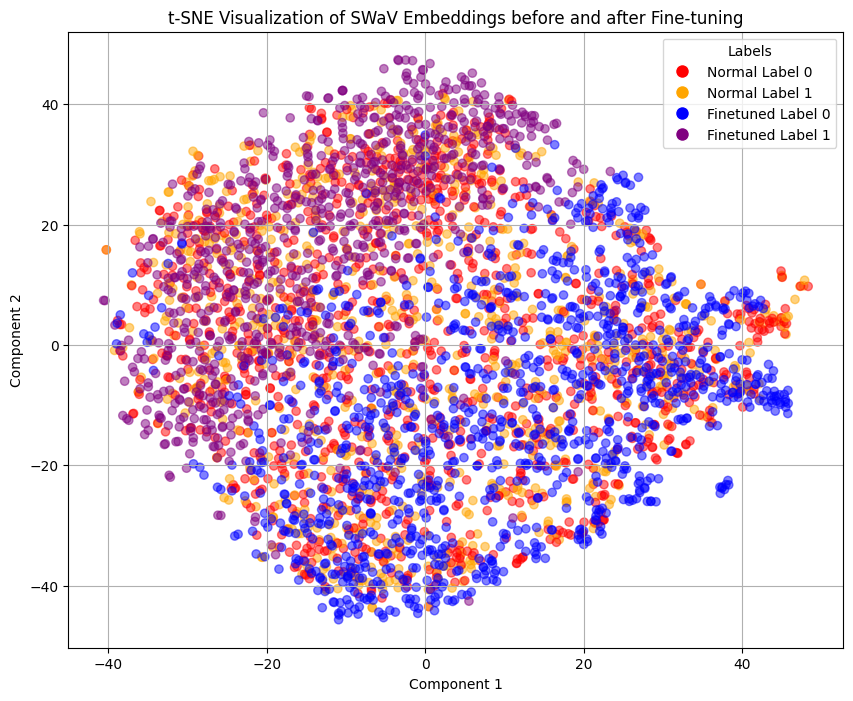

In [ ]:
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt

temp_dataloader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=200,
    shuffle=True,
    drop_last=False,
    num_workers=0,
)

def extract_features(model, dataloader):
    model.eval()
    features_list = []
    labels_list = []
    total = 0
    limit = 2000

    with torch.no_grad():
        for batch in dataloader:
            print(f"Total {total}/{limit}")  # Check the shape of the images tensor
            images = batch[0]  # Extract images from the batch
            
            if total >= limit:
                break

            total += len(images)
            
            # Check if images are in a list (multi-crop)
            if isinstance(images, list):
                # Concatenate along batch dimension after ensuring each image has correct dimensions
                images = torch.cat([img.unsqueeze(0) for img in images], dim=0)  # This assumes each img is already (C,H,W)

            # # Move images to device
            # images = images.to(device)

            labels = batch[1].numpy()  # Get labels (for plotting)

            features = model(images)  # Get embeddings from the model

            features_list.append(features.cpu().numpy())
            labels_list.append(labels)

    return np.concatenate(features_list), np.concatenate(labels_list)


finetuned_swav_resnet = loaded_swav_model.backbone

# Use the pretrained SwAV ResNet model as the backbone
swav_resnet = torch.hub.load('facebookresearch/swav:main', 'resnet50')
swav_resnet = nn.Sequential(*list(swav_resnet.children())[:-1])  # Remove last layer like in model

print(f"Extracting features from normal pretrained model")
normal_features, labels = extract_features(swav_resnet, temp_dataloader)
print(f"Extracting features from finetuned pretrained model")
finetuned_features, labels = extract_features(swav_resnet, temp_dataloader)

normal_features = np.squeeze(normal_features, axis=(2, 3))
finetuned_features = np.squeeze(finetuned_features, axis=(2, 3))

# Check if labels are extracted correctly
print("Unique Labels:", np.unique(labels))  # Should show unique class labels


# Step 7: Apply t-SNE for Dimensionality Reduction to 2D
tsne = TSNE(n_components=2)
normal_features_tsne = tsne.fit_transform(normal_features)

tsne = TSNE(n_components=2)
finetuned_features_tsne = tsne.fit_transform(finetuned_features)

# Step 9: Plotting function for t-SNE results
def plot_embeddings(normal_embeddings, finetuned_embeddings, title):
    
    plt.figure(figsize=(10, 8))
    colors = {0: 'red', 1: 'orange'}
    color_list = [colors[label] for label in labels]
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=f'Normal Label {label}')
            for label, color in colors.items()]
    scatter = plt.scatter(normal_embeddings[:, 0], normal_embeddings[:, 1], c=color_list, alpha=0.5)
    
    colors = {0: 'blue', 1: 'purple'}
    color_list = [colors[label] for label in labels]
    handles += [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=f'Finetuned Label {label}')
            for label, color in colors.items()]
    scatter = plt.scatter(finetuned_embeddings[:, 0], finetuned_embeddings[:, 1], c=color_list, alpha=0.5)
    
    # Create a legend
    plt.legend(handles=handles, title='Labels')
    
    plt.title(title)
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.grid(True)
    plt.show()

# Plot t-SNE results
plot_embeddings(normal_features_tsne, finetuned_features_tsne, 't-SNE Visualization of SWaV Embeddings before and after Fine-tuning')

We can see that the fine tuning indeed changed the representations generated by the SWaV model, but the changes are nothing drastic (after all it's a fine tuning).

But this confirms that the fine tuning was done.

## Classification downstream task with fine tuned SWaV model

### Model definition

In [12]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

class ClassificatorWithSwaV(pl.LightningModule):
    def __init__(self, swav_model):
        super().__init__()
        
        swav_model.eval()
        self.network = nn.Sequential(
            swav_model,
            nn.Flatten(start_dim=1, end_dim=-1),
            nn.Linear(in_features=512, out_features=120, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=120, out_features=60, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=60, out_features=10, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=10, out_features=2, bias=True),
        )

        self._initialize_weights()

        # Initialize losses and accuracies list for tracking loss over epochs
        self.train_losses = []
        self.train_accuracies = []
        self.val_losses = []
        self.val_accuracies = []
        self.test_losses = []
        self.test_accuracies = []
        
        # Store predictions and labels for confusion matrix
        self.val_preds = []
        self.val_labels = []
        self.test_preds = []
        self.test_labels = []

    def _initialize_weights(self):
      '''
      Initialize the network weights using the Xavier initialization.
      '''
      for x in self.modules():
        if isinstance(x, nn.Linear):
          torch.nn.init.xavier_uniform_(x.weight.data)
          if (x.bias is not None):
            x.bias.data.zero_()

    def forward(self, x):
        logits = self.network(x).flatten(start_dim=1)
        return logits

    def criterion(self, preds, targets): # , device):
      '''
      Function that calculates the loss and accuracy of a batch predicted by the model.
      '''
      ce            = nn.CrossEntropyLoss() # .to(device) # You don't need to change the loss function (but you can if it makes sense on your analysis)
      loss          = ce(preds, targets.long())
      pred_labels   = torch.max(preds.data, 1)[1] # same as argmax
      acc           = torch.sum(pred_labels == targets.data)
      n             = pred_labels.size(0)
      acc           = acc/n

      return loss, acc

    def training_step(self, batch, batch_idx):
        ims, targets = batch
        self.forward(ims)
        preds = self.network(ims)
        loss, acc = self.criterion(preds, targets) #, accelerator)

        # Store the loss value for plotting later
        self.train_losses.append(loss)
        self.train_accuracies.append(acc)
        self.log("train_loss", loss, prog_bar=True)
        self.log("train_accuracy", acc, prog_bar=True)

        return loss

    def validation_step(self, batch, batch_idx):
        ims, targets = batch
        self.forward(ims)
        preds = self.network(ims)
        loss, acc = self.criterion(preds, targets) #, accelerator)

        self.val_preds.append(preds.argmax(dim=1))
        self.val_labels.append(targets)
        
        self.val_losses.append(loss)
        self.val_accuracies.append(acc)
        self.log("val_loss", loss, prog_bar=True)
        self.log("val_accuracy", acc, prog_bar=True)
        
    def test_step(self, batch, batch_idx):
        ims, targets = batch
        self.forward(ims)
        preds = self.network(ims)
        loss, acc = self.criterion(preds, targets) #, accelerator)

        self.test_preds.append(preds.argmax(dim=1))
        self.test_labels.append(targets)
        
        self.test_losses.append(loss)
        self.test_accuracies.append(acc)
        self.log("test_loss", loss, prog_bar=True)
        self.log("test_accuracy", acc, prog_bar=True)

    def on_epoch_end(self):
        # Calculate and print average loss at the end of each epoch
        avg_loss = sum(self.losses) / len(self.losses) if self.losses else 0.0
        avg_accuracy = sum(self.accuracies) / len(self.accuracies) if self.accuracies else 0.0
        print(f"Epoch {self.current_epoch + 1}, Average Loss: {avg_loss:.4f}, Average Accuracy: {avg_accuracy:.4f}")

        # Clear losses, acuracies for the next epoch
        self.losses.clear()
        self.accuracies.clear()
        
    def on_validation_epoch_end(self):
        val_preds = torch.cat(self.val_preds)
        val_labels = torch.cat(self.val_labels)

        # Compute confusion matrix
        cm = confusion_matrix(val_labels.cpu().numpy(), val_preds.cpu().numpy())
        
        # Plot confusion matrix
        self.plot_confusion_matrix(cm)

        # Clear stored predictions and labels for the next epoch
        self.val_preds.clear()
        self.val_labels.clear()
    
    def on_test_epoch_end(self):
        test_preds = torch.cat(self.test_preds)
        test_labels = torch.cat(self.test_labels)

        # Compute confusion matrix
        cm = confusion_matrix(test_labels.cpu().numpy(), test_preds.cpu().numpy())
        
        # Plot confusion matrix
        self.plot_confusion_matrix(cm)

        # Clear stored predictions and labels for the next epoch
        self.test_preds.clear()
        self.test_labels.clear()

    def plot_confusion_matrix(self, cm, test=False):
        fig, ax = plt.subplots(figsize=(5, 4))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=ax)
        ax.set_xlabel("Predicted labels")
        ax.set_ylabel("True labels")
        ax.set_title("Confusion Matrix")

        # Log confusion matrix to TensorBoard
        self.logger.experiment.add_figure(f"{"Test" if test else "Validation"} Confusion Matrix", fig, self.current_epoch)
        plt.close(fig)

    def configure_optimizers(self):
        optim = torch.optim.Adam(self.parameters(), lr=0.0001)
        return optim
    
classificator_with_swav_model = ClassificatorWithSwaV(loaded_swav_model)

### Training

In [13]:
if not torch.cuda.is_available():
  print("GPU not available!")

accelerator = "gpu" if torch.cuda.is_available() else "cpu"

torch.set_float32_matmul_precision('medium')

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.callbacks import ModelCheckpoint


checkpoint_path = 'classificator_with_swav/tensorboard_logs/classificator_with_swav/version_13/checkpoints/last.ckptd'

# Skip training if the checkpoint file already exists
if os.path.exists(checkpoint_path):
  print("Skipping training, loading model from checkpoint")
else:
    print("Training the model...")
    logger = TensorBoardLogger('classificator_with_swav/tensorboard_logs', name='classificator_with_swav')

    # On my local env, when num_workers > 0 the execution hangs
    NUM_WORKERS = 0

    trainer = pl.Trainer(
        logger=logger,
        max_epochs=20,
        devices=1,
        accelerator=accelerator,
        default_root_dir='./classificator_with_swav',
        callbacks=[
            ModelCheckpoint(
                # Save all checkpoints
                save_top_k=99999,
                save_last=True,
                monitor="train_loss",
                mode="min",
                # Save checkpoints every half epoch
                every_n_train_steps=(len(train_dataset) // 36) // 2,
                filename="{epoch:02d}-{step:02d}-{train_loss}",
            ),
            EarlyStopping(monitor="val_loss", mode="min", patience=10),
        ]
    )

    train_dataloader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=100,
        shuffle=True,
        num_workers=NUM_WORKERS,
    )

    valid_dataloader = torch.utils.data.DataLoader(
        valid_dataset,
        batch_size=100,
        shuffle=False,
        num_workers=NUM_WORKERS,
    )

    trainer.fit(
        model=classificator_with_swav_model,
        train_dataloaders=train_dataloader,
        val_dataloaders=valid_dataloader,
        # ckpt_path="finetuning/tensorboard_logs/swav_finetuning/version_30/checkpoints/last.ckpt"
    )
    
    # See the training results with `tensorboard --logdir=./classificator_with_swav/tensorboard_logs/`

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training the model...



  | Name    | Type       | Params | Mode 
-----------------------------------------------
0 | network | Sequential | 24.8 M | train
-----------------------------------------------
24.7 M    Trainable params
66.0 K    Non-trainable params
24.8 M    Total params
99.035    Total estimated model params size (MB)
9         Modules in train mode
164       Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Epoch 8:   6%|▌         | 44/741 [00:16<04:28,  2.60it/s, v_num=5, train_loss=0.000103, train_accuracy=1.000, val_loss=0.0124, val_accuracy=0.996] 


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

### Training charts

![classificator_with_swav_train_loss.png](./notebook_images/classificator_with_swav_train_loss.png)

![classificator_with_swav_train_accuracy.png](./notebook_images/classificator_with_swav_train_accuracy.png)

![classificator_with_swav_val_loss.png](./notebook_images/classificator_with_swav_val_loss.png)

![classificator_with_swav_val_accuracy.png](./notebook_images/classificator_with_swav_val_accuracy.png)

![classificator_with_swav_val_confusion_matrix_at_end.png](./notebook_images/classificator_with_swav_val_confusion_matrix_at_end.png)

In [14]:
trainer.validate(classificator_with_swav_model, valid_dataloader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Validation DataLoader 0: 100%|██████████| 159/159 [00:23<00:00,  6.84it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric           DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      val_accuracy          0.9964717626571655
        val_loss           0.012096096761524677
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'val_loss': 0.012096096761524677, 'val_accuracy': 0.9964717626571655}]

In [16]:
# Define the path to the checkpoint file
checkpoint_path = 'classificator_with_swav/tensorboard_logs/classificator_with_swav/version_5/checkpoints/last.ckpt'

# Load the model from the checkpoint
loaded_classificator_with_swav_model = ClassificatorWithSwaV.load_from_checkpoint(checkpoint_path, swav_model=loaded_swav_model)

# Set the model to evaluation mode
loaded_classificator_with_swav_model.eval()

# Test the loaded model with a sample image
trainer.validate(loaded_classificator_with_swav_model, valid_dataloader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Validation DataLoader 0: 100%|██████████| 159/159 [00:22<00:00,  6.93it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric           DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      val_accuracy          0.9964717626571655
        val_loss           0.012446743436157703
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'val_loss': 0.012446743436157703, 'val_accuracy': 0.9964717626571655}]

### Test accuracy

In [18]:
test_dataloader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=100,
    shuffle=False,
    num_workers=NUM_WORKERS,
  )

trainer.test(loaded_classificator_with_swav_model, test_dataloader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 159/159 [00:50<00:00,  3.13it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.9975429773330688
        test_loss          0.008743575774133205
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.008743575774133205, 'test_accuracy': 0.9975429773330688}]

### Summary

Our classificator using the fine tuned SWaV model managed to get 99.6% accuracy on the validation set and 99.7% accuracy on the test set. While it is slighly better than the 99.5% validation accuracy of the supervised model using a Resnet 18, both classifiers effectivelly have the same performance.

## Conclusion

Both models - the fully supervised model and the model using the finetuned SWaV backbone - achieved great performance on the test set (>99%) and have, effectively, the same performance.

While the expected result would be for the model using SSRL to perform better, we believe this result can be explained by the fact that even after the 75%/17.5%/3.75%/3.75% split of our dataset between finetuning, training, validation and test dataset, respectively, our training dataset still had an amount of data large enough for the fully supervised method to perform well.

The following table displays the split and dataset sizes:


|        | finetuning | train | valid | test  |
| ------ | ---------- | ----- | ----- | ----- |
| split  | 75%        | 17.5% | 3.75% | 3.75% |
| amount | 317442     | 74070 | 15872 | 15873 |


74000 instances are still enough data to solve this problem with a fully supervised method.

We expect the model with SSRL would outperform the fully supervised model if the labeled data for the supervised training was around 3000 instances.

# Running the experiment again with fewer samples for the supervised learning

## Load the dataset

In [1]:
import random
import numpy as np
import torch
import pytorch_lightning as pl

SEED = 172

# Set seed for Python's random module
random.seed(SEED)

# Set seed for NumPy
np.random.seed(SEED)

# Set seed for PyTorch
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)  # if you are using multi-GPU.

# Set seed for PyTorch Lightning
pl.seed_everything(SEED)

Seed set to 172


172

In [ ]:
# Code to mount google drive in Google Colab.

# from google.colab import drive
# import pandas as pd
# import os
# drive.mount('/content/gdrive', force_remount=True)


# You theoretically can access the dataset through the network stored in Google Drive, like so:
# dataset_folder = "/content/gdrive/MyDrive/MC959 - Datasets/Airbus Wind Turbines Patches"

# However, using this approach would probably be slow. Use the approach in the cell below instead.

In [ ]:
# If on Google Colab, use the following code to unzip the dataset

# Upload the kaggle dataset archive to 'kaggle-dataset-archive.zip'
# in the Files panel

# The unzip process takes around 4 minutes
# !apt-get install unzip
# !unzip '/content/gdrive/MyDrive/MC959 - Datasets/Airbus Wind Turbines Patches/kaggle-dataset-archive.zip' -d './Airbus Wind Turbines Patches/'
# # !unzip kaggle-dataset-archive.zip -d './Airbus Wind Turbines Patches/'
# dataset_folder = './Airbus Wind Turbines Patches/'

In [2]:
# When in local development, just download and extract the dataset into a folder
# and set the dataset_folder variable to the path of that folder
dataset_folder = 'C:\\Users\\diego\\Documents\\TEMP_MC959\\Airbus Wind Turbines Patches'

In [3]:
import os

base_train_background_filenames = [os.path.join(dataset_folder, 'train', 'background', file) for file in os.listdir(f'{dataset_folder}/train/background')]
base_train_target_filenames = [os.path.join(dataset_folder, 'train', 'target', file) for file in os.listdir(f'{dataset_folder}/train/target')]
base_val_background_filenames = [os.path.join(dataset_folder, 'val', 'background', file) for file in os.listdir(f'{dataset_folder}/val/background')]
base_val_target_filenames = [os.path.join(dataset_folder, 'val', 'target', file) for file in os.listdir(f'{dataset_folder}/val/target')]

In [4]:
all_background_filenames = base_train_background_filenames + base_val_background_filenames
all_target_filenames = base_train_target_filenames + base_val_target_filenames

from sklearn.model_selection import train_test_split

# Split the entire dataset into a dataset used for fine-tuning and the rest (used for later stages)

# For supervised learning
# Train set will only have 50 samples (25 of each label)
# Validation and test set will be 3.75% of the dataset each (7.5% total)

# For finetuning the dataset will have ~92.5% of the dataset
# Train set will have 80% of this data, while validation set wil have 20%
rest_background_filenames, val_test_background_filenames = \
  train_test_split(all_background_filenames, test_size=0.075, random_state=SEED)
rest_target_filenames, val_test_target_filenames = \
  train_test_split(all_target_filenames, test_size=0.075, random_state=SEED)
  
valid_background_filenames, test_background_filenames = \
  train_test_split(val_test_background_filenames, test_size=0.5, random_state=SEED)
valid_target_filenames, test_target_filenames = \
  train_test_split(val_test_target_filenames, test_size=0.5, random_state=SEED)


finetuning_background_filenames, train_background_filenames = \
  train_test_split(rest_background_filenames, test_size=25, random_state=SEED)
finetuning_target_filenames, train_target_filenames = \
  train_test_split(rest_target_filenames, test_size=25, random_state=SEED)
  
finetuning_train_background_filenames, finetuning_valid_background_filenames = \
  train_test_split(finetuning_background_filenames, test_size=0.2, random_state=SEED)
finetuning_train_target_filenames, finetuning_valid_target_filenames = \
  train_test_split(finetuning_target_filenames, test_size=0.2, random_state=SEED)

In [5]:
import numpy as np
from PIL import Image
from torch.utils.data import Dataset
import torchvision.transforms.v2 as transforms

# Reads the image from the filesystem when needed, to avoid overflowing RAM
class AirbusDataset(Dataset):
  def __init__(self, background_filenames, target_filenames, transform=None, target_transform=None):
    all_filenames_with_label = [(f,0) for f in background_filenames] + \
                               [(f,1) for f in target_filenames]
    self.filenames = [file_name_label[0] for file_name_label in all_filenames_with_label]
    self.labels = [file_name_label[1] for file_name_label in all_filenames_with_label]

    self.images = self.filenames
    # self.images = [Image.open(filename) for filename in filenames]
    # self.images = [np.asarray(pil_image) for pil_image in self.images]

    self.transform = transform
    self.target_transform = target_transform

    #   self.images = [transform(image) for image in self.images]

  def __len__(self):
    return len(self.filenames)

  def __getitem__(self, idx):
    '''
    Return a tuple with the image and the respective target at position idx.
    '''
    image = Image.open(self.images[idx])
    label = self.labels[idx]

    if self.transform != None:
      image = self.transform(image)
      
    if self.target_transform != None:
      label = self.target_transform(label)

    return image, label

preprocess_transform = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

train_dataset = AirbusDataset(
    train_background_filenames,
    train_target_filenames,
    transform=preprocess_transform
  )

valid_dataset = AirbusDataset(
    valid_background_filenames,
    valid_target_filenames,
    transform=preprocess_transform
  )

test_dataset = AirbusDataset(
    test_background_filenames,
    test_target_filenames,
    transform=preprocess_transform
  )

fine_tuning_train_dataset = AirbusDataset(
    finetuning_train_background_filenames,
    finetuning_train_target_filenames,
    transform=preprocess_transform
  )

fine_tuning_valid_dataset = AirbusDataset(
    finetuning_valid_background_filenames,
    finetuning_valid_target_filenames,
    transform=preprocess_transform
  )

print(f'Train dataset size: {len(train_dataset)}')
print(f'Validation dataset size: {len(valid_dataset)}')
print(f'Test dataset size: {len(test_dataset)}')
print(f'Fine-tuning train dataset size: {len(fine_tuning_train_dataset)}')
print(f'Fine-tuning valid dataset size: {len(fine_tuning_valid_dataset)}')

Train dataset size: 50
Validation dataset size: 15872
Test dataset size: 15873
Fine-tuning train dataset size: 313169
Fine-tuning valid dataset size: 78293


d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\transforms\v2\_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


Number of images: 50
Images are 224x224x3
Class of the image:  0


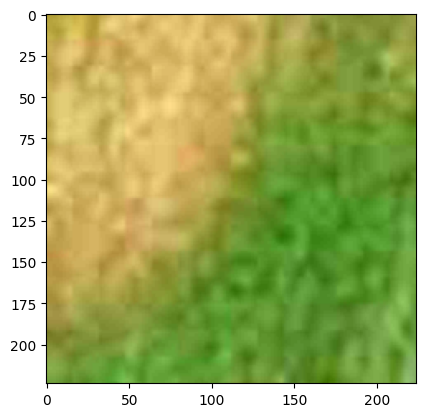

Class of the image:  0


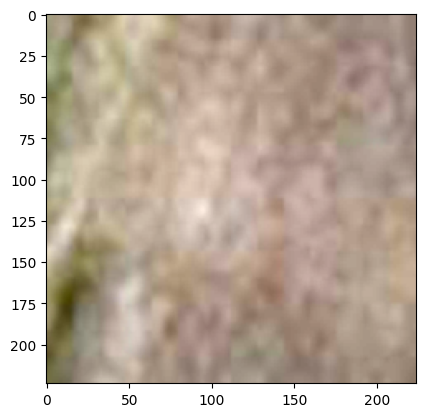

Class of the image:  1


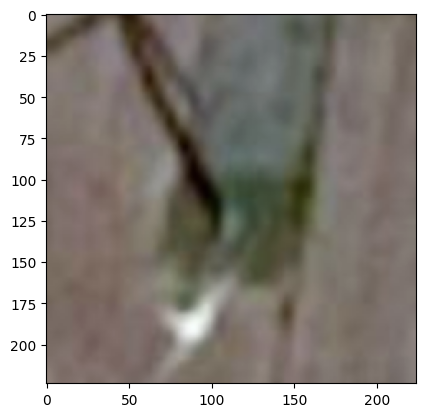

Class of the image:  1


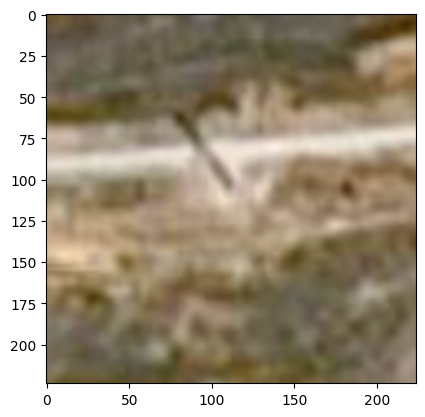

In [10]:
import matplotlib.pyplot as plt
# Visualize images from the training set

def show_image(idx):
  image, target = train_dataset[idx] # This will execute the '__getitem__' method
  nchannels = image.shape[0]
  height    = image.shape[1]
  width     = image.shape[2]
  image     = image.permute(1,2,0).numpy() # Converts the Tensor back to image shape
  image     = 255*(image - np.min(image))/(np.max(image)-np.min(image))
  image     = image.astype('uint8')
  plt.imshow(image)
  print("Class of the image: ", target)
  plt.show()

print("Number of images:", len(train_dataset))
sample_image, target = train_dataset[0] # This will execute the '__getitem__' method
nchannels = sample_image.shape[0]
height    = sample_image.shape[1]
width     = sample_image.shape[2]
print("Images are {}x{}x{}".format(width,height,nchannels))

show_image(0)
show_image(24)
show_image(25)
show_image(49)

## Fully Supervised Training

### Using GPU

In [6]:
import torch
import torchvision
from torch import nn
import pytorch_lightning as pl

In [7]:
if not torch.cuda.is_available():
  print("GPU not available!")

accelerator = "gpu" if torch.cuda.is_available() else "cpu"
device = "cuda" if torch.cuda.is_available() else "cpu"

### Model with Resnet 18 + Fully connected layers

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
from torchmetrics.classification import F1Score

class SupervisedResNetCNN(pl.LightningModule):
    def __init__(self):
        super().__init__()
        
        # Instantiate the ResNet backbone
        resnet = torchvision.models.resnet18(pretrained=False)
        self.network = nn.Sequential(
            nn.Sequential(*list(resnet.children())[:-1]),
            nn.Flatten(start_dim=1, end_dim=-1),
            # nn.Linear(in_features=1000, out_features=864, bias=True),
            # nn.ReLU(),
            nn.Linear(in_features=512, out_features=120, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=120, out_features=60, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=60, out_features=10, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=10, out_features=2, bias=True),
        )

        self._initialize_weights()

        # Initialize losses and accuracies list for tracking loss over epochs
        self.train_losses = []
        self.train_accuracies = []
        self.val_losses = []
        self.val_accuracies = []
        self.test_losses = []
        self.test_accuracies = []
        
        # Store predictions and labels for confusion matrix
        self.register_buffer('val_preds', torch.empty(0, device=device))
        self.register_buffer('val_labels', torch.empty(0, device=device))
        self.register_buffer('test_preds', torch.empty(0, device=device))
        self.register_buffer('test_labels', torch.empty(0, device=device))
        
        self.f1 = F1Score('binary').to(device)
        

    def _initialize_weights(self):
      '''
      Initialize the network weights using the Xavier initialization.
      '''
      for x in self.modules():
        if isinstance(x, nn.Linear):
          torch.nn.init.xavier_uniform_(x.weight.data)
          if (x.bias is not None):
            x.bias.data.zero_()

    def forward(self, x):
        logits = self.network(x).flatten(start_dim=1)
        return logits

    def criterion(self, preds, targets): # , device):
      '''
      Function that calculates the loss and accuracy of a batch predicted by the model.
      '''
      ce            = nn.CrossEntropyLoss() # .to(device) # You don't need to change the loss function (but you can if it makes sense on your analysis)
      loss          = ce(preds, targets.long())
      pred_labels   = torch.max(preds.data, 1)[1] # same as argmax
      acc           = torch.sum(pred_labels == targets.data)
      n             = pred_labels.size(0)
      acc           = acc/n

      return loss, acc

    def training_step(self, batch, batch_idx):
        ims, targets = batch
        self.forward(ims)
        preds = self.network(ims)
        loss, acc = self.criterion(preds, targets) #, accelerator)

        # Store the loss value for plotting later
        self.train_losses.append(loss)
        self.train_accuracies.append(acc)
        self.log("train_loss", loss, prog_bar=True)
        self.log("train_accuracy", acc, prog_bar=True)

        return loss

    def validation_step(self, batch, batch_idx):
        ims, targets = batch
        self.forward(ims)
        preds = self.network(ims)
        pred_labels = preds.argmax(dim=1)
        loss, acc = self.criterion(preds, targets) #, accelerator)

        self.val_preds = torch.cat([self.val_preds, pred_labels], dim=0)
        self.val_labels = torch.cat([self.val_labels, targets], dim=0)
        
        self.val_losses.append(loss)
        self.val_accuracies.append(acc)
        self.log("val_loss", loss, prog_bar=True)
        self.log("val_accuracy", acc, prog_bar=True)
        
    def test_step(self, batch, batch_idx):
        ims, targets = batch
        self.forward(ims)
        preds = self.network(ims)
        pred_labels = preds.argmax(dim=1)
        loss, acc = self.criterion(preds, targets) #, accelerator)

        self.test_preds = torch.cat([self.test_preds, pred_labels], dim=0)
        self.test_labels = torch.cat([self.test_labels, targets], dim=0)
        
        self.test_losses.append(loss)
        self.test_accuracies.append(acc)
        self.log("test_loss", loss, prog_bar=True)
        self.log("test_accuracy", acc, prog_bar=True)

    def on_epoch_end(self):
        # Calculate and print average loss at the end of each epoch
        avg_loss = sum(self.losses) / len(self.losses) if self.losses else 0.0
        avg_accuracy = sum(self.accuracies) / len(self.accuracies) if self.accuracies else 0.0
        print(f"Epoch {self.current_epoch + 1}, Average Loss: {avg_loss:.4f}, Average Accuracy: {avg_accuracy:.4f}")

        # Clear losses, acuracies for the next epoch
        self.losses.clear()
        self.accuracies.clear()
        
    def on_validation_epoch_end(self):
        val_preds = self.val_preds
        val_labels = self.val_labels

        # Compute confusion matrix
        cm = confusion_matrix(val_labels.cpu().numpy(), val_preds.cpu().numpy())
        
        # Plot confusion matrix
        self.plot_confusion_matrix(cm)

        # Log the final F1 score for the epoch
        self.log('val_f1_epoch', self.f1(self.val_preds, self.val_labels), prog_bar=True)
        
        # Clear stored predictions and labels for the next epoch
        self.val_preds = torch.empty(0, device=device)
        self.val_labels = torch.empty(0, device=device)
    
    def on_test_epoch_end(self):
        test_preds = self.test_preds
        test_labels = self.test_labels

        # Compute confusion matrix
        cm = confusion_matrix(test_labels.cpu().numpy(), test_preds.cpu().numpy())
        
        # Plot confusion matrix
        self.plot_confusion_matrix(cm)
        
        # Log the final F1 score for the epoch
        self.log('test_f1_epoch', self.f1(self.test_preds, self.test_labels), prog_bar=True)

        # Clear stored predictions and labels for the next epoch
        self.test_preds = torch.empty(0, device=device)
        self.test_labels = torch.empty(0, device=device)

    def plot_confusion_matrix(self, cm, test=False):
        fig, ax = plt.subplots(figsize=(5, 4))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=ax)
        ax.set_xlabel("Predicted labels")
        ax.set_ylabel("True labels")
        ax.set_title("Confusion Matrix")

        # Log confusion matrix to TensorBoard
        self.logger.experiment.add_figure(f"{"Test" if test else "Validation"} Confusion Matrix", fig, self.current_epoch)
        plt.close(fig)

    def configure_optimizers(self):
        optim = torch.optim.Adam(self.parameters(), lr=0.0001)
        return optim

supervised_resnet_model = SupervisedResNetCNN()

# Test
supervised_resnet_model.eval()
supervised_resnet_model.forward(train_dataset[0][0].unsqueeze(0))

tensor([[-0.0511, -0.2823]], grad_fn=<AddmmBackward0>)

#### Model Training

In [ ]:
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping


supervised_resnet_model = SupervisedResNetCNN()
supervised_resnet_model.train()

SHOULD_TRAIN = True

# Skip training if the checkpoint file already exists
if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")
  logger = TensorBoardLogger('supervised_checkpoints/tensorboard_logs', name='supervised_resnet_50_samples')

  trainer = pl.Trainer(
      logger=logger,
      max_epochs=100,
      devices=1,
      accelerator=accelerator,
      callbacks=[
        ModelCheckpoint(
            # Save all checkpoints
            save_top_k=99999,
            save_last=True,
            monitor="val_f1_epoch",
            mode="min",
            # Save checkpoints every epoch
            every_n_epochs=1,
            filename="{epoch:02d}-{step:02d}-{val_f1_epoch}",
        ),
        # EarlyStopping(monitor="val_loss", mode="min", patience=10)
      ],
      # TODO: Test training with full half precision
      # precision="bf16-true"
      # Enable mixed precision to speed up training
      precision="bf16-mixed"
    )

  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  train_dataloader = torch.utils.data.DataLoader(
      train_dataset,
      batch_size=50,
      shuffle=True,
      drop_last=True,
      num_workers=NUM_WORKERS,
  )

  valid_dataloader = torch.utils.data.DataLoader(
      valid_dataset,
      batch_size=512,
      shuffle=False,
      drop_last=True,
      num_workers=NUM_WORKERS,
  )

  trainer.fit(
      model=supervised_resnet_model,
      train_dataloaders=train_dataloader,
      val_dataloaders=valid_dataloader,
      # ckpt_path="supervised_checkpoints/tensorboard_logs/supervised_resnet_50_samples/version_2/checkpoints/last.ckpt"
    )
  
  # Check the training results with `tensorboard --logdir=./supervised_checkpoints/tensorboard_logs/`

Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type          | Params | Mode 
--------------------------------------------------
0 | network | Sequential    | 11.2 M | train
1 | f1      | BinaryF1Score | 0      | train
--------------------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.984    Total estimated model params size (MB)
77        Modules in train mode
0         Modules in eval mode


Training the model...
Sanity Checking: |          | 0/? [00:00<?, ?it/s]

d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\loops\fit_loop.py:298: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 79: 100%|██████████| 1/1 [00:00<00:00, 10.88it/s, v_num=9, train_loss=0.000398, train_accuracy=1.000, val_loss=1.390, val_accuracy=0.747, val_f1_epoch=0.728]


Detected KeyboardInterrupt, attempting graceful shutdown ...


Epoch 0: 100%|██████████| 1/1 [31:14<00:00,  0.00it/s, v_num=8, train_loss=0.904, train_accuracy=0.500]


NameError: name 'exit' is not defined

Training output
```
  | Name    | Type          | Params | Mode 
--------------------------------------------------
0 | network | Sequential    | 11.2 M | train
1 | f1      | BinaryF1Score | 0      | train
--------------------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.984    Total estimated model params size (MB)
77        Modules in train mode
0         Modules in eval mode
```

#### Model Training Charts



#### Model loading from checkpoint and test F1 score

In [45]:
# Define the path to the checkpoint file
checkpoint_path = 'supervised_checkpoints/tensorboard_logs/supervised_resnet_50_samples/version_9/checkpoints/epoch=36-step=37-train_loss=0.0014544677687808871.ckpt'

# Load the model from the checkpoint
supervised_resnet_model = SupervisedResNetCNN.load_from_checkpoint(checkpoint_path)

# Set the model to evaluation mode
supervised_resnet_model.eval()

valid_dataloader = torch.utils.data.DataLoader(
    valid_dataset,
    batch_size=512,
    shuffle=False,
    drop_last=True,
    num_workers=NUM_WORKERS,
)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=512,
    shuffle=False,
    drop_last=True,
    num_workers=NUM_WORKERS,
)

trainer.validate(supervised_resnet_model, valid_dataloader)
trainer.test(supervised_resnet_model, test_dataloader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Validation DataLoader 0: 100%|██████████| 31/31 [00:17<00:00,  1.80it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.



────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric           DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      val_accuracy          0.7466607689857483
      val_f1_epoch          0.7266299724578857
        val_loss            1.2592332363128662
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Testing DataLoader 0: 100%|██████████| 31/31 [00:17<00:00,  1.81it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.7440776228904724
      test_f1_epoch          0.724722146987915
 

[{'test_loss': 1.2316007614135742,
  'test_accuracy': 0.7440776228904724,
  'test_f1_epoch': 0.724722146987915}]

### Summary

Our supervised model reached 72.5% F1 score on the test set and 72.7% F1 score on the validation set. It was better than what we expected, given the few samples (50, 25 for each label).

## Fine tuning

In [ ]:
!pip install lightly

In [ ]:
from lightly.loss import SwaVLoss
from lightly.models.modules import SwaVProjectionHead, SwaVPrototypes
from lightly.transforms.swav_transform import SwaVTransform
import pytorch_lightning as pl

### Obtaining pre trained SWaV model

In [47]:
import torch
swav_resnet = torch.hub.load('facebookresearch/swav:main', 'resnet50')

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


We can see that the last layer of the model is a linear layer that maps the representation into a lower dimensional space. Will remove it when finetuning the model.

### SWaV model definition



This is class contains this many constructor arguments to allow us to vary the hyperparameters on the training attempts below. We didn't write the class like this at first, we actually added those constructor parameters as we needed them, being careful so that code written previously still resulted in the same model (we maintained backwards compatibility).


One difference from the previous experiment is that here we're not freezing more layers from the original pre trained SWaV model by default. We expected this to lead to more clustered representations of the data (according to the label), although that didn't happen, as we'll describe later.

In [30]:
import pytorch_lightning as pl
import torch
import torchvision
from torch import nn
from torch.optim.lr_scheduler import CosineAnnealingLR

from lightly.loss import SwaVLoss
from lightly.models.modules.heads import ProjectionHead
from lightly.models.modules import SwaVProjectionHead, SwaVPrototypes
from lightly.models.modules.memory_bank import MemoryBankModule

accelerator = "gpu" if torch.cuda.is_available() else "cpu"
device = "cuda" if torch.cuda.is_available() else "cpu"

class CustomSwaVProjectionHead(ProjectionHead):
    """Projection head used for SwaV.

    - [0]: SwAV, 2020, https://arxiv.org/abs/2006.09882
    """

    def __init__(
        self, input_dim: int = 2048, hidden_dim: int = 2048, output_dim: int = 128,
        use_bn: bool = True
    ):
        """Initializes the SwaVProjectionHead with the specified dimensions."""
        super(CustomSwaVProjectionHead, self).__init__(
            [
                (input_dim, hidden_dim, nn.BatchNorm1d(hidden_dim) if use_bn else None, nn.ReLU()),
                (hidden_dim, output_dim, None, None),
            ]
        )

# From: https://docs.lightly.ai/self-supervised-learning/examples/swav.html
# We're using the SwAV implementation with Queue since we needed to train with a small batch size.
class SwaVQueue(pl.LightningModule):
    def __init__(
            self,
            nmb_prototypes=512,
            sinkhorn_epsilon=0.05,
            use_sgd_optim=False,
            lr=0.0005,
            n_steps_frozen_prototypes=1,
            final_lr=None,
            nmb_training_steps=None,
            use_queue_after_n_epoch=-1,
            use_bn_on_projection_head=True,
            pretrained=True
        ):
        super().__init__()
        
        self.use_sgd_optim = use_sgd_optim
        self.lr = lr
        self.final_lr = final_lr
        self.nmb_training_steps = nmb_training_steps
        self.use_queue_after_n_epoch = use_queue_after_n_epoch
        
        if pretrained:
            # Use the pretrained SwAV ResNet model as the backbone
            resnet = torch.hub.load('facebookresearch/swav:main', 'resnet50')
            resnet = torch.hub.load('facebookresearch/swav:main', 'resnet50') if pretrained else torchvision.models.resnet50()
            
            
            self.backbone = nn.Sequential(*list(resnet.children())[:-1])  # Remove last layer
            
            # Freeze the backbone, except the last layers, up to (including) the last 3 convolutional layers
            ################################################################################################
            self.backbone.eval()
            
            
            backbone_layers = list(self.backbone.children())
            
            backbone_layers_to_train = [backbone_layers[-1]]

            # Train the last convolutional layers of the model
            backbone_layers_to_train += list(backbone_layers[-2].children())[-2:]
            
            for layer in backbone_layers_to_train:
                layer.train()
            ################################################################################################
        else:
            resnet = torchvision.models.resnet50()
            self.backbone = nn.Sequential(*list(resnet.children())[:-1])

        self.projection_head = CustomSwaVProjectionHead(2048, 512, 128, use_bn=use_bn_on_projection_head)
        self.prototypes = SwaVPrototypes(128, nmb_prototypes, n_steps_frozen_prototypes)
        self.start_queue_at_epoch = 2
        self.queues = nn.ModuleList(
            [MemoryBankModule(size=(3840, 128)) for _ in range(2)]
        )
        self.criterion = SwaVLoss(sinkhorn_epsilon=sinkhorn_epsilon)

    def training_step(self, batch, batch_idx):
        views = batch[0]
        high_resolution, low_resolution = views[:2], views[2:]
        self.prototypes.normalize()

        high_resolution_features = [self._subforward(x) for x in high_resolution]
        low_resolution_features = [self._subforward(x) for x in low_resolution]

        high_resolution_prototypes = [
            self.prototypes(x, self.current_epoch) for x in high_resolution_features
        ]
        low_resolution_prototypes = [
            self.prototypes(x, self.current_epoch) for x in low_resolution_features
        ]
        
        if self.use_queue_after_n_epoch > 0 and self.current_epoch < self.use_queue_after_n_epoch:
            queue_prototypes = None
        else:
            queue_prototypes = self._get_queue_prototypes(high_resolution_features)

        loss = self.criterion(
            high_resolution_prototypes, low_resolution_prototypes, queue_prototypes
        )
        
        # Store the loss value for plotting later
        self.log("train_loss", loss, prog_bar=True)

        return loss
    
    def validation_step(self, batch, batch_idx):
        views = batch[0]
        high_resolution, low_resolution = views[:2], views[2:]
        self.prototypes.normalize()

        high_resolution_features = [self._subforward(x) for x in high_resolution]
        low_resolution_features = [self._subforward(x) for x in low_resolution]

        high_resolution_prototypes = [
            self.prototypes(x, self.current_epoch) for x in high_resolution_features
        ]
        low_resolution_prototypes = [
            self.prototypes(x, self.current_epoch) for x in low_resolution_features
        ]
        queue_prototypes = self._get_queue_prototypes(high_resolution_features)
        loss = self.criterion(
            high_resolution_prototypes, low_resolution_prototypes, queue_prototypes
        )
        
        # Store the loss value for plotting later
        self.log("val_loss", loss, prog_bar=True)

        return loss

    def configure_optimizers(self):
        self.lr_scheduler = None
        if self.use_sgd_optim:
            optim = torch.optim.SGD(
                self.parameters(),
                lr=self.lr,
                momentum=0.9,
                weight_decay=1e-6,
            )
            if self.final_lr is not None:
                self.lr_scheduler = CosineAnnealingLR(
                    optim,
                    eta_min=self.final_lr,
                    T_max=self.nmb_training_steps
                )
        else:
            optim = torch.optim.Adam(self.parameters(), lr=self.lr)
        return optim

    def on_train_epoch_start(self):
        self.log("lr", self.optimizers().param_groups[0]["lr"])

    def on_train_epoch_end(self):
        if self.lr_scheduler is not None:
            self.lr_scheduler.step()

        self.log("lr", self.optimizers().param_groups[0]["lr"])

    def _subforward(self, input):
        features = self.backbone(input).flatten(start_dim=1)
        features = self.projection_head(features)
        features = nn.functional.normalize(features, dim=1, p=2)
        return features
    
    def forward(self, input):
        return self.prototypes(self._subforward(input), 0)
    
    @torch.no_grad()
    def get_representation(self, input):
        return self.backbone(input)

    @torch.no_grad()
    def _get_queue_prototypes(self, high_resolution_features):
        if len(high_resolution_features) != len(self.queues):
            raise ValueError(
                f"The number of queues ({len(self.queues)}) should be equal to the number of high "
                f"resolution inputs ({len(high_resolution_features)}). Set `n_queues` accordingly."
            )

        # Get the queue features
        queue_features = []
        for i in range(len(self.queues)):
            _, features = self.queues[i](high_resolution_features[i], update=True)
            # Queue features are in (num_ftrs X queue_length) shape, while the high res
            # features are in (batch_size X num_ftrs). Swap the axes for interoperability.
            features = torch.permute(features, (1, 0))
            queue_features.append(features)

        # If loss calculation with queue prototypes starts at a later epoch,
        # just queue the features and return None instead of queue prototypes.
        if (
            self.start_queue_at_epoch > 0
            and self.current_epoch < self.start_queue_at_epoch
        ):
            return None

        # Assign prototypes
        queue_prototypes = [
            self.prototypes(x, self.current_epoch) for x in queue_features
        ]
        return queue_prototypes

# Step 4: Train the Model
SwaVmodel = SwaVQueue()


Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main


### Dataset without targets (labels ignored in finetuning)

In [10]:
# Define the transformation using SwaVTransform

import torchvision.transforms as transforms
from lightly.transforms.swav_transform import SwaVTransform

transform = SwaVTransform()

def target_transform(t):
  return 0

fine_tuning_train_dataset = AirbusDataset(
    finetuning_train_background_filenames,
    finetuning_train_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

fine_tuning_valid_dataset = AirbusDataset(
    finetuning_valid_background_filenames,
    finetuning_valid_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

### Training (fine tuning of SWaV with our dataset)

In this section of the notebook we tried to do the finetuning of the SWaV model varying multiple aspects of the training process (including, but not limited to the hyperparameters). We did those multiple tries because the finetuning wasn't improving the representations generated by SWaV, that is, separating the representations of images with and without wind turbines, the finetuning was actually mixing both types together, worsening the performance of the classifier that would use these representations.

We will talk more about why we think this is happening at the end of this section.

In [11]:
if not torch.cuda.is_available():
  print("GPU not available!")

accelerator = "gpu" if torch.cuda.is_available() else "cpu"
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
accelerator = "gpu" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0


SwaVmodel = SwaVQueue()
# SwaVmodel = torch.compile(SwaVmodel)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_finetuning_92.5_p_samples")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=100,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every quarter epoch
        # every_n_train_steps=(len(dataset) // 512) // 8,
        # every_n_epochs=1,
        # Save checkpoints every 20 minutes
        train_time_interval=timedelta(minutes=20),
        filename="{epoch:02d}-{step:02d}-{val_loss}",
      ),
      # EarlyStopping(monitor="val_loss", mode="min", patience=7),
    ],
    # TODO: Test training with full half precision
    # precision="bf16-true"
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
    val_check_interval=0.25,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  train_dataloader = torch.utils.data.DataLoader(
    fine_tuning_train_dataset,
    batch_size=64,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

  valid_dataloader = torch.utils.data.DataLoader(
    fine_tuning_valid_dataset,
    batch_size=64,
    shuffle=False,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

  trainer.fit(
    model=SwaVmodel,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    # ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_samples/version_3/checkpoints/last.ckpt"
  )

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type               | Params | Mode 
---------------------------------------------------------------
0 | backbone        | Sequential         | 23.5 M | eval 
1 | projection_head | SwaVProjectionHead | 1.1 M  | train
2 | prototypes      | SwaVPrototypes     | 66.0 K | train
3 | queues          | ModuleList         | 0      | train
4 | criterion       | SwaVLoss           | 0      | train
---------------------------------------------------------------
24.7 M    Trainable params
0         Non-trainable params
24.7 M    Total params
98.757    Total estimated model params size (MB)
30        Modules in train mode
133       Modules in eval mode


Training the model...
Epoch 5:   0%|          | 7/4893 [00:16<3:08:58,  0.43it/s, v_num=7, train_loss=5.920, val_loss=7.500]   


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

We had some technical difficulties to train this model. Due to memory constraints, we had to reduce the batch size to 32, otherwise the RAM and GPU RAM would ran out and training wouldn't even begin.

However, the SWaV method works better with large batch sizes, and in [the reference page](https://docs.lightly.ai/self-supervised-learning/examples/swav.html) for implementing the model, the normal implementation is recommended for a batch size larger than 256. We used the implementation with a queue, recommended for lower batch sizes, but definitely not the ideal.

Even with this lower batch size, we noticed that the computer would became unstable and the training would get interrupted at seemingly random intervals. Using checkpoints we were able to circumvent this issue, but that's why we trained only for 3 epochs.

During training process we noticed that after a point, the training loss started to increase, converging to the value 6.23 after the step 26448. So, we choose the checkpoint with the lowest training loss as the best version of our model, the checkpoint at epoch 1 step 15428. So we can safelly say that more training wouldn't improve our fine tuned model performance.

#### Loading from checkpoint

In [ ]:
# Define the path to the checkpoint file
checkpoint_path = 'finetuning/tensorboard_logs/swav_finetuning_92.5_p_samples/version_7/checkpoints/last.ckpt'

# Load the model from the checkpoint
loaded_swav_model = SwaVQueue.load_from_checkpoint(checkpoint_path)

# Set the model to evaluation mode
loaded_swav_model.eval()

# Test the loaded model with a sample image
display(loaded_swav_model.forward(train_dataset[0][0].unsqueeze(0).to(device='cuda')).shape)

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main


torch.Size([1, 512])

#### Comparison of representations before and after fine tune

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Extracting features from finetuned pretrained model
Total 0/2000
Total 512/2000
Total 1024/2000
Total 1536/2000
Total 2048/2000
Extracting features from normal pretrained model
Total 0/2000
Total 512/2000
Total 1024/2000
Total 1536/2000
Total 2048/2000
Unique Labels: [0 1]


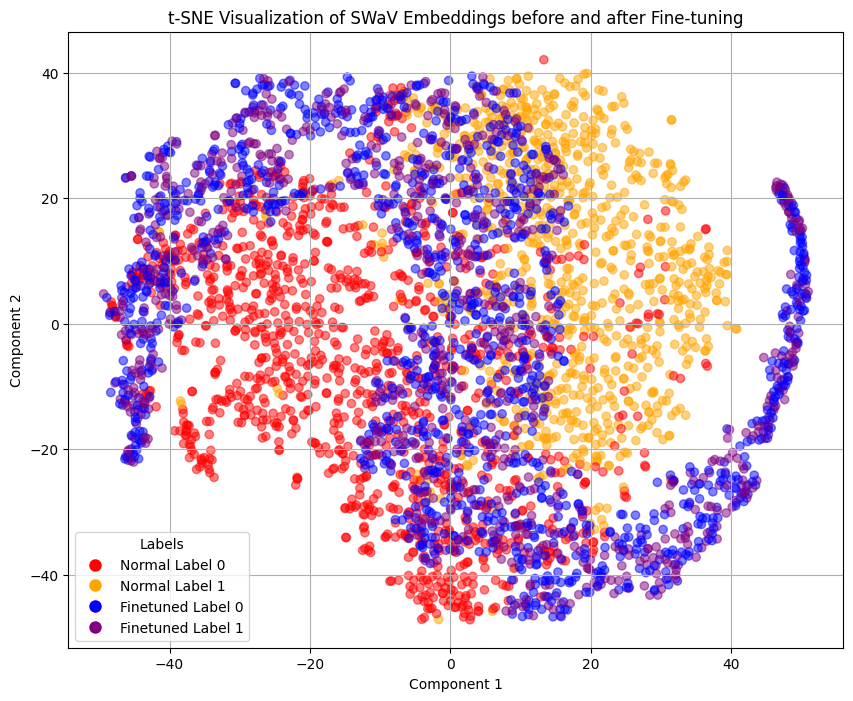

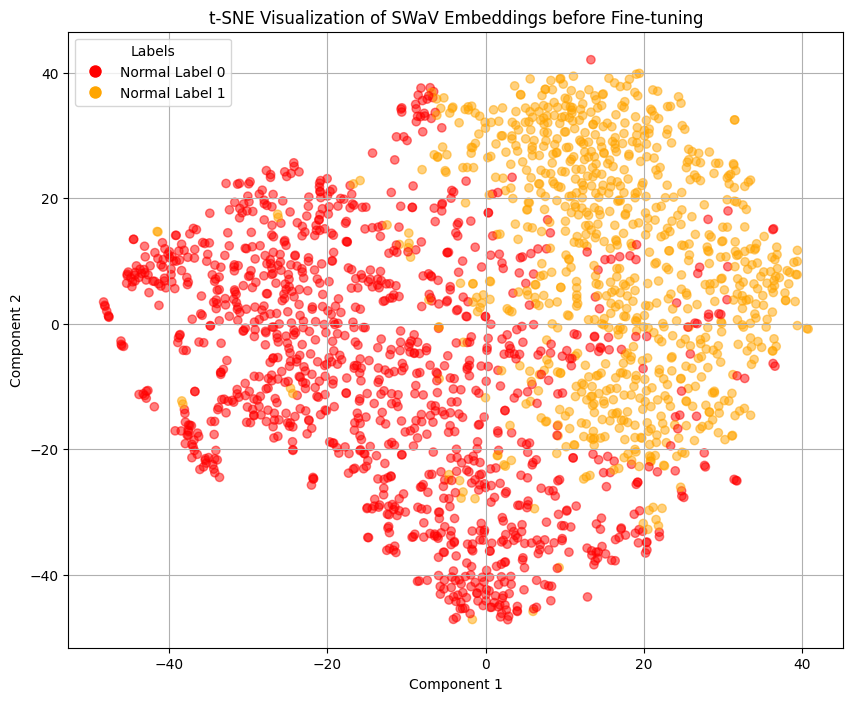

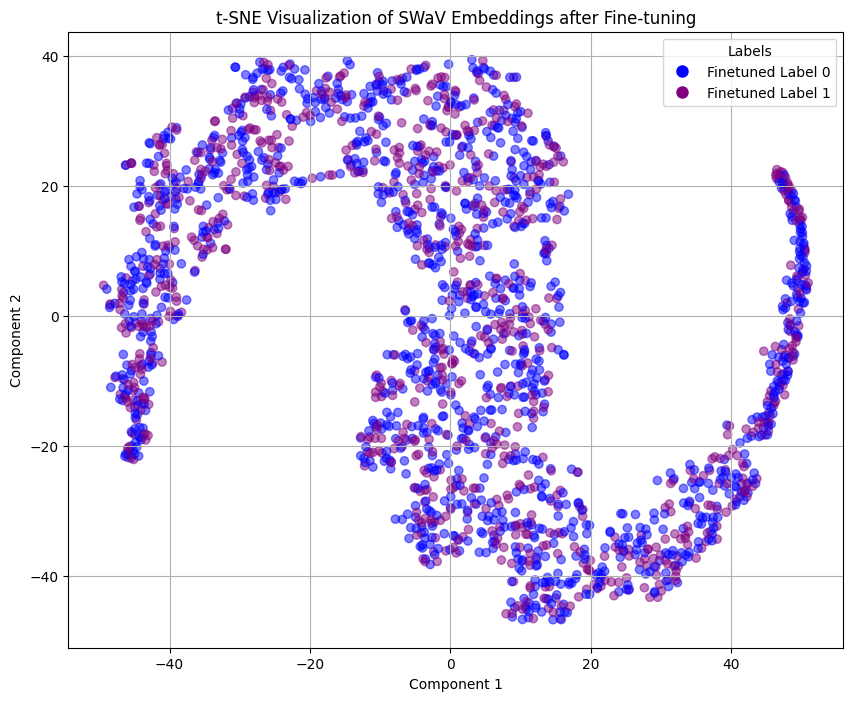

In [70]:
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt

temp_dataloader = torch.utils.data.DataLoader(
    valid_dataset,
    batch_size=512,
    shuffle=True,
    drop_last=False,
    num_workers=0,
)

def extract_features(model, dataloader):
    model.eval()
    features_list = []
    labels_list = []
    total = 0
    limit = 2000

    with torch.no_grad():
        for batch in dataloader:
            print(f"Total {total}/{limit}")  # Check the shape of the images tensor
            images = batch[0]  # Extract images from the batch
            
            if total >= limit:
                break

            total += len(images)
            
            # Check if images are in a list (multi-crop)
            if isinstance(images, list):
                # Concatenate along batch dimension after ensuring each image has correct dimensions
                images = torch.cat([img.unsqueeze(0) for img in images], dim=0)  # This assumes each img is already (C,H,W)

            # Move images to device
            images = images.to(device)

            labels = batch[1].numpy()  # Get labels (for plotting)

            features = model(images)  # Get embeddings from the model

            features_list.append(features.cpu().numpy())
            labels_list.append(labels)

    return np.concatenate(features_list), np.concatenate(labels_list)


finetuned_swav_resnet = loaded_swav_model.backbone

# Use the pretrained SwAV ResNet model as the backbone
swav_resnet = torch.hub.load('facebookresearch/swav:main', 'resnet50').to(device)
swav_resnet = nn.Sequential(*list(swav_resnet.children())[:-1])  # Remove last layer like in model

print(f"Extracting features from finetuned pretrained model")
finetuned_features, labels = extract_features(finetuned_swav_resnet, temp_dataloader)
print(f"Extracting features from normal pretrained model")
normal_features, labels = extract_features(swav_resnet, temp_dataloader)

normal_features = np.squeeze(normal_features, axis=(2, 3))
finetuned_features = np.squeeze(finetuned_features, axis=(2, 3))

# Check if labels are extracted correctly
print("Unique Labels:", np.unique(labels))  # Should show unique class labels


# Step 7: Apply t-SNE for Dimensionality Reduction to 2D
tsne = TSNE(n_components=2)
normal_features_tsne = tsne.fit_transform(normal_features)

tsne = TSNE(n_components=2)
finetuned_features_tsne = tsne.fit_transform(finetuned_features)

# Step 9: Plotting function for t-SNE results
def plot_embeddings(normal_embeddings, finetuned_embeddings, title):
    plt.figure(figsize=(10, 8))
    
    handles = []
    if normal_embeddings is not None:
        colors = {0: 'red', 1: 'orange'}
        color_list = [colors[label] for label in labels]
        handles += [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=f'Normal Label {label}')
                for label, color in colors.items()]
        plt.scatter(normal_embeddings[:, 0], normal_embeddings[:, 1], c=color_list, alpha=0.5)
    
    if finetuned_embeddings is not None:
        colors = {0: 'blue', 1: 'purple'}
        color_list = [colors[label] for label in labels]
        handles += [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=f'Finetuned Label {label}')
                for label, color in colors.items()]
        plt.scatter(finetuned_embeddings[:, 0], finetuned_embeddings[:, 1], c=color_list, alpha=0.5)
    
    # Create a legend
    plt.legend(handles=handles, title='Labels')
    
    plt.title(title)
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.grid(True)
    plt.show()

# Plot t-SNE results
plot_embeddings(normal_features_tsne, finetuned_features_tsne, 't-SNE Visualization of SWaV Embeddings before and after Fine-tuning')
plot_embeddings(normal_features_tsne, None, 't-SNE Visualization of SWaV Embeddings before Fine-tuning')
plot_embeddings(None, finetuned_features_tsne, 't-SNE Visualization of SWaV Embeddings after Fine-tuning')

We can see that the fine tuned version of the model actually worsened the representations given by SWaV. Perhaps with the checkpoint with lowest val_loss the results are better.

In [71]:
# Define the path to the checkpoint file
checkpoint_path = 'finetuning/tensorboard_logs/swav_finetuning_92.5_p_samples/version_7/checkpoints/epoch=02-step=9787-val_loss=5.5572991371154785.ckpt'

# Load the model from the checkpoint
loaded_swav_model = SwaVQueue.load_from_checkpoint(checkpoint_path)

# Set the model to evaluation mode
loaded_swav_model.eval()

# Test the loaded model with a sample image
display(loaded_swav_model.forward(train_dataset[0][0].unsqueeze(0).to(device='cuda')).shape)

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


torch.Size([1, 512])

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main


Extracting features from finetuned pretrained model
Total 0/2000
Total 512/2000
Total 1024/2000
Total 1536/2000
Total 2048/2000
Extracting features from normal pretrained model
Total 0/2000
Total 512/2000
Total 1024/2000
Total 1536/2000
Total 2048/2000
Unique Labels: [0 1]


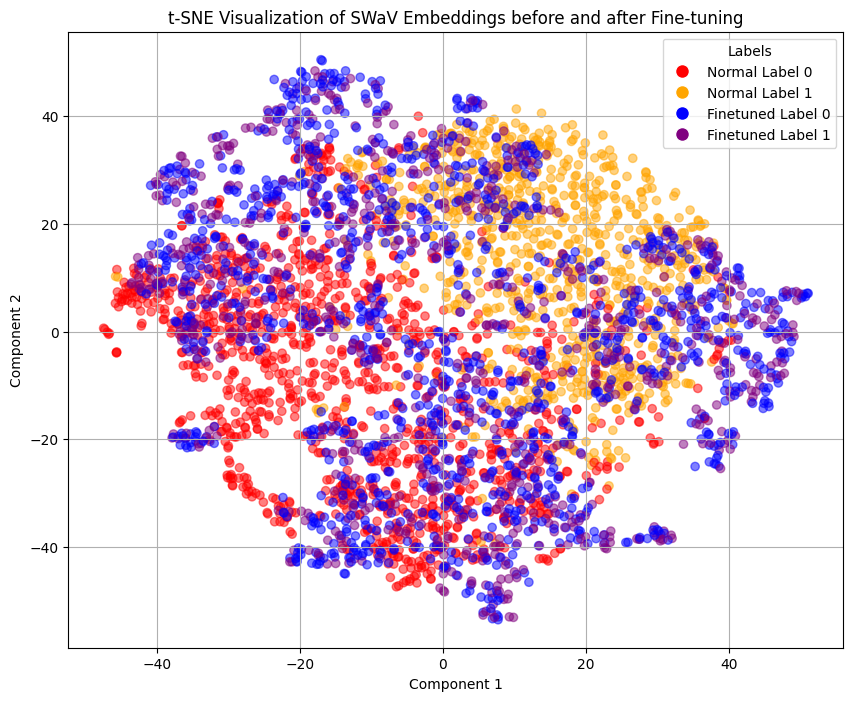

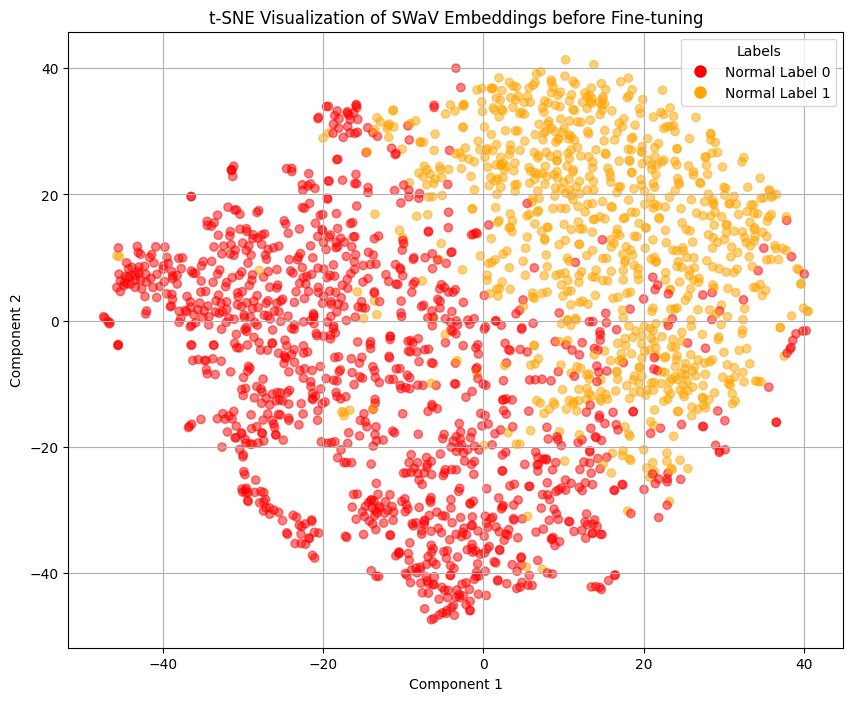

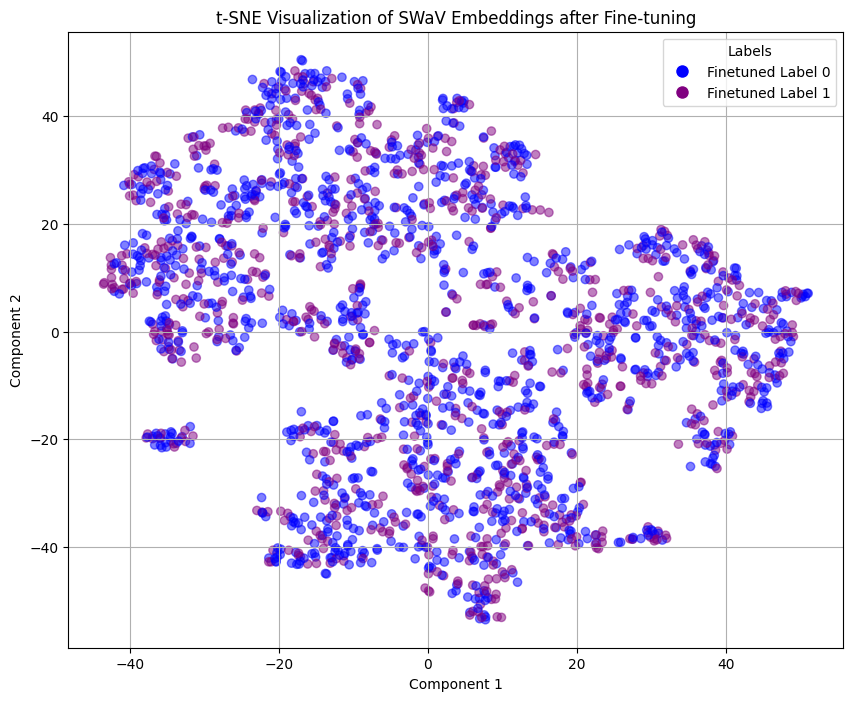

In [72]:
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt

temp_dataloader = torch.utils.data.DataLoader(
    valid_dataset,
    batch_size=512,
    shuffle=True,
    drop_last=False,
    num_workers=0,
)

def extract_features(model, dataloader):
    model.eval()
    features_list = []
    labels_list = []
    total = 0
    limit = 2000

    with torch.no_grad():
        for batch in dataloader:
            print(f"Total {total}/{limit}")  # Check the shape of the images tensor
            images = batch[0]  # Extract images from the batch
            
            if total >= limit:
                break

            total += len(images)
            
            # Check if images are in a list (multi-crop)
            if isinstance(images, list):
                # Concatenate along batch dimension after ensuring each image has correct dimensions
                images = torch.cat([img.unsqueeze(0) for img in images], dim=0)  # This assumes each img is already (C,H,W)

            # Move images to device
            images = images.to(device)

            labels = batch[1].numpy()  # Get labels (for plotting)

            features = model(images)  # Get embeddings from the model

            features_list.append(features.cpu().numpy())
            labels_list.append(labels)

    return np.concatenate(features_list), np.concatenate(labels_list)


finetuned_swav_resnet = loaded_swav_model.backbone

# Use the pretrained SwAV ResNet model as the backbone
swav_resnet = torch.hub.load('facebookresearch/swav:main', 'resnet50').to(device)
swav_resnet = nn.Sequential(*list(swav_resnet.children())[:-1])  # Remove last layer like in model

print(f"Extracting features from finetuned pretrained model")
finetuned_features, labels = extract_features(finetuned_swav_resnet, temp_dataloader)
print(f"Extracting features from normal pretrained model")
normal_features, labels = extract_features(swav_resnet, temp_dataloader)

normal_features = np.squeeze(normal_features, axis=(2, 3))
finetuned_features = np.squeeze(finetuned_features, axis=(2, 3))

# Check if labels are extracted correctly
print("Unique Labels:", np.unique(labels))  # Should show unique class labels


# Step 7: Apply t-SNE for Dimensionality Reduction to 2D
tsne = TSNE(n_components=2)
normal_features_tsne = tsne.fit_transform(normal_features)

tsne = TSNE(n_components=2)
finetuned_features_tsne = tsne.fit_transform(finetuned_features)

# Step 9: Plotting function for t-SNE results
def plot_embeddings(normal_embeddings, finetuned_embeddings, title):
    plt.figure(figsize=(10, 8))
    
    handles = []
    if normal_embeddings is not None:
        colors = {0: 'red', 1: 'orange'}
        color_list = [colors[label] for label in labels]
        handles += [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=f'Normal Label {label}')
                for label, color in colors.items()]
        plt.scatter(normal_embeddings[:, 0], normal_embeddings[:, 1], c=color_list, alpha=0.5)
    
    if finetuned_embeddings is not None:
        colors = {0: 'blue', 1: 'purple'}
        color_list = [colors[label] for label in labels]
        handles += [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=f'Finetuned Label {label}')
                for label, color in colors.items()]
        plt.scatter(finetuned_embeddings[:, 0], finetuned_embeddings[:, 1], c=color_list, alpha=0.5)
    
    # Create a legend
    plt.legend(handles=handles, title='Labels')
    
    plt.title(title)
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.grid(True)
    plt.show()

# Plot t-SNE results
plot_embeddings(normal_features_tsne, finetuned_features_tsne, 't-SNE Visualization of SWaV Embeddings before and after Fine-tuning')
plot_embeddings(normal_features_tsne, None, 't-SNE Visualization of SWaV Embeddings before Fine-tuning')
plot_embeddings(None, finetuned_features_tsne, 't-SNE Visualization of SWaV Embeddings after Fine-tuning')

Even with a checkpoint close to the beginning of the training (at the start of the epoch 2), we can already see that the mixing between representation of different labels happened. Let's try again with different hyperparameters.

#### Training (finetuning) with less prototypes

Let's try halving the number of prototypes.

In [ ]:
accelerator = "gpu" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0


SwaVmodel = SwaVQueue(nmb_prototypes=256, lr=0.0001)
# SwaVmodel = torch.compile(SwaVmodel)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_finetuning_92.5_p_samples_256_prototypes")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=100,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every quarter epoch
        # every_n_train_steps=(len(dataset) // 512) // 8,
        # every_n_epochs=1,
        # Save checkpoints every 20 minutes
        train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss}",
      ),
      # EarlyStopping(monitor="val_loss", mode="min", patience=7),
    ],
    # TODO: Test training with full half precision
    # precision="bf16-true"
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
    # Since the epochs are very long (dataset of +300k samples)
    # check the validation loss more frequently
    val_check_interval=0.5,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  train_dataloader = torch.utils.data.DataLoader(
    fine_tuning_train_dataset,
    batch_size=70,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

  valid_dataloader = torch.utils.data.DataLoader(
    fine_tuning_valid_dataset,
    batch_size=70,
    shuffle=False,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

  trainer.fit(
    model=SwaVmodel,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_samples_256_prototypes/version_3/checkpoints/last.ckpt"
  )

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Restoring states from the checkpoint path at finetuning/tensorboard_logs/swav_finetuning_92.5_p_samples_256_prototypes/version_3/checkpoints/last.ckpt


Training the model...


d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\call.py:273: Be aware that when using `ckpt_path`, callbacks used to create the checkpoint need to be provided during `Trainer` instantiation. Please add the following callbacks: ["ModelCheckpoint{'monitor': 'val_loss', 'mode': 'min', 'every_n_train_steps': 0, 'every_n_epochs': 0, 'train_time_interval': datetime.timedelta(seconds=1200)}"].
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type               | Params | Mode 
---------------------------------------------------------------
0 | backbone        | Sequential         | 23.5 M | eval 
1 | projection_head | SwaVProjectionHead | 1.1 M  | train
2 | prototypes      | SwaVPrototypes     | 33.0 K | train
3 | queues          | ModuleList         | 0      | train
4 | criterion       | SwaVLoss           | 0      | train
---------------------------------------------------------------
24.7 M    Trainable params
0         Non-trainable 

Epoch 0:   0%|          | 0/4473 [00:00<?, ?it/s] 

d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\loops\training_epoch_loop.py:161: You're resuming from a checkpoint that ended before the epoch ended and your dataloader is not resumable. This can cause unreliable results if further training is done. Consider using an end-of-epoch checkpoint or make your dataloader resumable by implementing the `state_dict` / `load_state_dict` interface.


Epoch 2:  47%|████▋     | 2111/4473 [50:47<56:50,  0.69it/s, v_num=4, train_loss=4.700, val_loss=4.800]    


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

In [ ]:
# Define the path to the checkpoint file
checkpoint_path = 'finetuning/tensorboard_logs/swav_finetuning_92.5_p_samples_256_prototypes/version_4/checkpoints/last.ckpt'

# Load the model from the checkpoint
loaded_swav_model = SwaVQueue.load_from_checkpoint(checkpoint_path, nmb_prototypes=256, lr=0.0001)

# Set the model to evaluation mode
loaded_swav_model.eval()

# Test the loaded model with a sample image
display(loaded_swav_model.forward(train_dataset[0][0].unsqueeze(0).to(device=device)).shape)

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


torch.Size([1, 256])

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main


Extracting features from finetuned pretrained model
Total 0/2000
Total 512/2000
Total 1024/2000
Total 1536/2000
Total 2048/2000
Extracting features from normal pretrained model
Total 0/2000
Total 512/2000
Total 1024/2000
Total 1536/2000
Total 2048/2000
Unique Labels: [0 1]


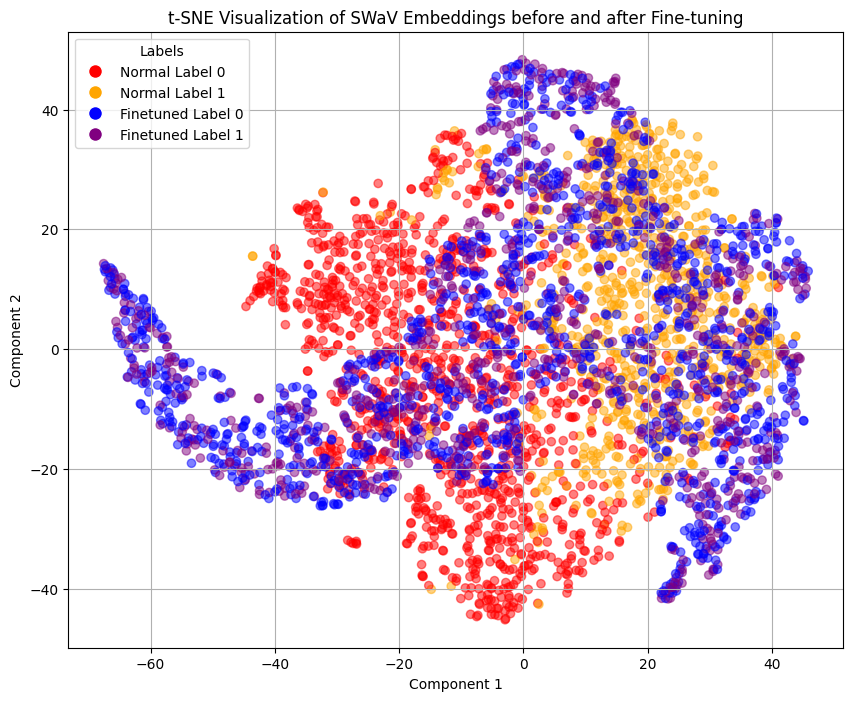

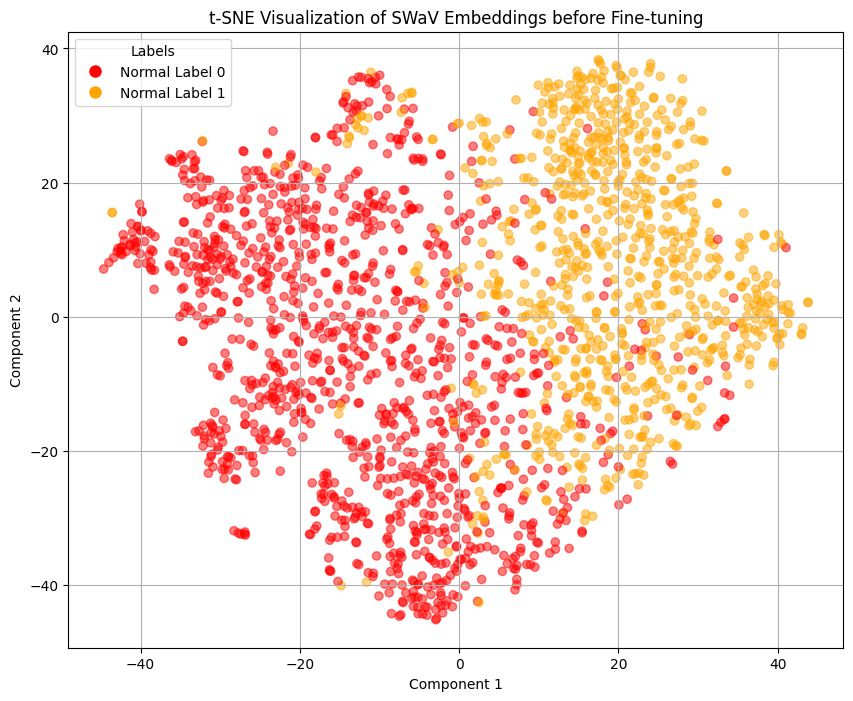

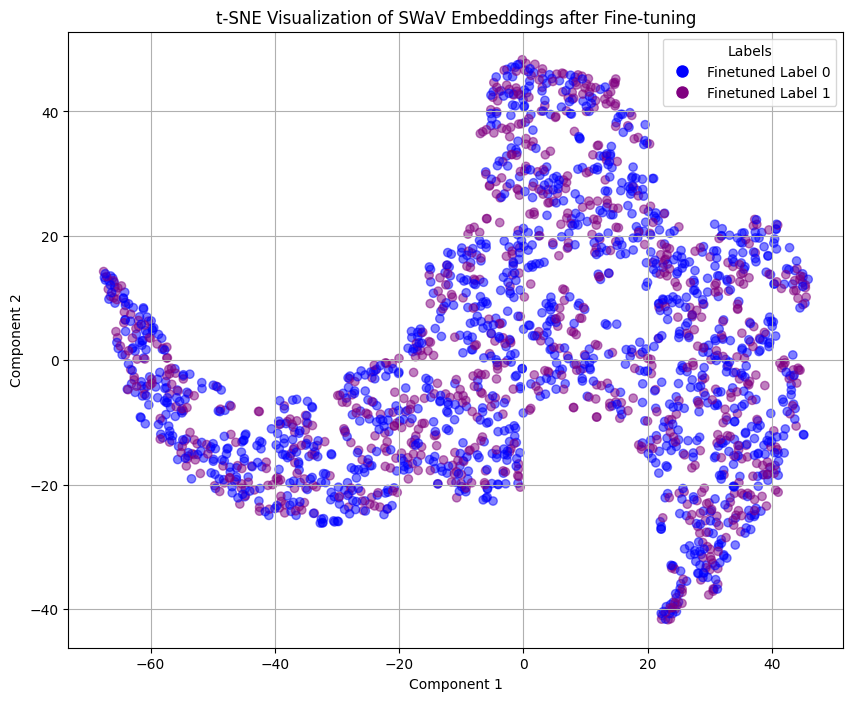

In [16]:
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt

temp_dataloader = torch.utils.data.DataLoader(
    valid_dataset,
    batch_size=512,
    shuffle=True,
    drop_last=False,
    num_workers=0,
)

def extract_features(model, dataloader):
    model.eval()
    features_list = []
    labels_list = []
    total = 0
    limit = 2000

    with torch.no_grad():
        for batch in dataloader:
            print(f"Total {total}/{limit}")  # Check the shape of the images tensor
            images = batch[0]  # Extract images from the batch
            
            if total >= limit:
                break

            total += len(images)
            
            # Check if images are in a list (multi-crop)
            if isinstance(images, list):
                # Concatenate along batch dimension after ensuring each image has correct dimensions
                images = torch.cat([img.unsqueeze(0) for img in images], dim=0)  # This assumes each img is already (C,H,W)

            # Move images to device
            images = images.to(device)

            labels = batch[1].numpy()  # Get labels (for plotting)

            features = model(images)  # Get embeddings from the model

            features_list.append(features.cpu().numpy())
            labels_list.append(labels)

    return np.concatenate(features_list), np.concatenate(labels_list)


finetuned_swav_resnet = loaded_swav_model.backbone

# Use the pretrained SwAV ResNet model as the backbone
swav_resnet = torch.hub.load('facebookresearch/swav:main', 'resnet50').to(device)
swav_resnet = nn.Sequential(*list(swav_resnet.children())[:-1])  # Remove last layer like in model

print(f"Extracting features from finetuned pretrained model")
finetuned_features, labels = extract_features(finetuned_swav_resnet, temp_dataloader)
print(f"Extracting features from normal pretrained model")
normal_features, labels = extract_features(swav_resnet, temp_dataloader)

normal_features = np.squeeze(normal_features, axis=(2, 3))
finetuned_features = np.squeeze(finetuned_features, axis=(2, 3))

# Check if labels are extracted correctly
print("Unique Labels:", np.unique(labels))  # Should show unique class labels


# Step 7: Apply t-SNE for Dimensionality Reduction to 2D
tsne = TSNE(n_components=2)
normal_features_tsne = tsne.fit_transform(normal_features)

tsne = TSNE(n_components=2)
finetuned_features_tsne = tsne.fit_transform(finetuned_features)

# Step 9: Plotting function for t-SNE results
def plot_embeddings(normal_embeddings, finetuned_embeddings, title):
    plt.figure(figsize=(10, 8))
    
    handles = []
    if normal_embeddings is not None:
        colors = {0: 'red', 1: 'orange'}
        color_list = [colors[label] for label in labels]
        handles += [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=f'Normal Label {label}')
                for label, color in colors.items()]
        plt.scatter(normal_embeddings[:, 0], normal_embeddings[:, 1], c=color_list, alpha=0.5)
    
    if finetuned_embeddings is not None:
        colors = {0: 'blue', 1: 'purple'}
        color_list = [colors[label] for label in labels]
        handles += [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=f'Finetuned Label {label}')
                for label, color in colors.items()]
        plt.scatter(finetuned_embeddings[:, 0], finetuned_embeddings[:, 1], c=color_list, alpha=0.5)
    
    # Create a legend
    plt.legend(handles=handles, title='Labels')
    
    plt.title(title)
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.grid(True)
    plt.show()

# Plot t-SNE results
plot_embeddings(normal_features_tsne, finetuned_features_tsne, 't-SNE Visualization of SWaV Embeddings before and after Fine-tuning')
plot_embeddings(normal_features_tsne, None, 't-SNE Visualization of SWaV Embeddings before Fine-tuning')
plot_embeddings(None, finetuned_features_tsne, 't-SNE Visualization of SWaV Embeddings after Fine-tuning')

Same problem as before.

#### Training using SGD, LRCosineAnnealing and lower Sinkhorn Epsilon

[The Github repository of SWaV](https://github.com/facebookresearch/swav) talks about the problem of the loss not deacresing and stoping at ln(nmb_prototypes) (which happened on the previous experiment, the first section of the notebook). It recommends doing some things to remedy this, such as reducing the sinkhorn epsilon value and freezing the prototypes during the first iterations.

Let's return to the previous hyperparameters (512 prototypes) and try to make these changes. We'll try to mirror the settings used on the paper. We'll switch the optimizer to SGD, using the same hyperparameters as they used, use a CosineAnnealingLRScheduler to reduce the learning rate throughout epochs, freeze the prototypes for 313 steps (as in the paper) and reduce the sinkhorn epsilon value to 0.03 (as suggested in the Github page).

Let's see if, with these changes, we can achieve a better result.

In [9]:
accelerator = "gpu" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0


num_epochs = 100

train_dataloader = torch.utils.data.DataLoader(
    fine_tuning_train_dataset,
    batch_size=70,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

valid_dataloader = torch.utils.data.DataLoader(
  fine_tuning_valid_dataset,
  batch_size=70,
  shuffle=False,
  drop_last=True,
  num_workers=NUM_WORKERS,
)
  


SwaVmodel = SwaVQueue(
  sinkhorn_epsilon=0.03,
  use_sgd_optim=True,
  lr=4.8,
  final_lr=0,
  nmb_training_steps=len(train_dataloader) * num_epochs,
  n_steps_frozen_prototypes=313
)
# SwaVmodel = torch.compile(SwaVmodel)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_finetuning_92.5_p_mirroring_paper")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=num_epochs,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every quarter epoch
        # every_n_train_steps=(len(dataset) // 512) // 8,
        # every_n_epochs=1,
        # Save checkpoints every 20 minutes
        train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss}",
      ),
      # EarlyStopping(monitor="val_loss", mode="min", patience=7),
    ],
    # TODO: Test training with full half precision
    # precision="bf16-true"
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
    # Since the epochs are very long (dataset of +300k samples)
    # check the validation loss more frequently
    val_check_interval=0.5,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  

  trainer.fit(
    model=SwaVmodel,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    # ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_samples_256_prototypes/version_3/checkpoints/last.ckpt"
  )

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                     | Params | Mode 
---------------------------------------------------------------------
0 | backbone        | Sequential               | 23.5 M | eval 
1 | projection_head | CustomSwaVProjectionHead | 1.1 M  | train
2 | prototypes      | SwaVPrototypes           | 66.0 K | train
3 | queues          | ModuleList               | 0      | train
4 | criterion       | SwaVLoss                 | 0      | train
---------------------------------------------------------------------
24.7 M    Trainable params
0         Non-trainable params
24.7 M    Total params
98.757    Total estimated model params size (MB)
30        Modules in train mode
133       Modules in eval mo

Training the model...
Epoch 0:   0%|          | 18/4473 [00:05<23:01,  3.22it/s, v_num=6, train_loss=nan.0]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

The train and val loss became nan, what usually happens with vanishing/exploding gradients. We'll try again with a lower training rate and slightly lower Sinkhorn epsilon.

In [22]:
accelerator = "gpu" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0


num_epochs = 20

train_dataloader = torch.utils.data.DataLoader(
    fine_tuning_train_dataset,
    batch_size=70,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

valid_dataloader = torch.utils.data.DataLoader(
  fine_tuning_valid_dataset,
  batch_size=70,
  shuffle=False,
  drop_last=True,
  num_workers=NUM_WORKERS,
)
  


SwaVmodel = SwaVQueue(
  sinkhorn_epsilon=0.02,
  use_sgd_optim=True,
  lr=3,
  final_lr=0,
  nmb_training_steps=len(train_dataloader) * num_epochs,
  n_steps_frozen_prototypes=313,
  use_queue_after_n_epoch=2
)
# SwaVmodel = torch.compile(SwaVmodel)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_finetuning_92.5_p_mirroring_paper")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=num_epochs,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every quarter epoch
        # every_n_train_steps=(len(dataset) // 512) // 8,
        # every_n_epochs=1,
        # Save checkpoints every 20 minutes
        train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss}",
      ),
      # EarlyStopping(monitor="val_loss", mode="min", patience=7),
    ],
    # TODO: Test training with full half precision
    # precision="bf16-true"
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
    # Since the epochs are very long (dataset of +300k samples)
    # check the validation loss more frequently
    val_check_interval=0.5,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  

  trainer.fit(
    model=SwaVmodel,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    # ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_samples_256_prototypes/version_3/checkpoints/last.ckpt"
  )

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
Using bfloat16 Automatic Mixed Precision (AMP)


Training the model...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type               | Params | Mode 
---------------------------------------------------------------
0 | backbone        | Sequential         | 23.5 M | eval 
1 | projection_head | SwaVProjectionHead | 1.1 M  | train
2 | prototypes      | SwaVPrototypes     | 66.0 K | train
3 | queues          | ModuleList         | 0      | train
4 | criterion       | SwaVLoss           | 0      | train
---------------------------------------------------------------
24.7 M    Trainable params
0         Non-trainable params
24.7 M    Total params
98.757    Total estimated model params size (MB)
30        Modules in train mode
133       Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Epoch 2:  56%|█████▌    | 2495/4473 [1:22:37<1:05:30,  0.50it/s, v_num=1, train_loss=nan.0, val_loss=nan.0]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

#### Train with gradient clipping

Use gradient clipping, increase the number of prototypes and the number of steps with prototypes frozen.

In [26]:
accelerator = "gpu" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0


num_epochs = 20

train_dataloader = torch.utils.data.DataLoader(
    fine_tuning_train_dataset,
    batch_size=70,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

valid_dataloader = torch.utils.data.DataLoader(
  fine_tuning_valid_dataset,
  batch_size=70,
  shuffle=False,
  drop_last=True,
  num_workers=NUM_WORKERS,
)
  


SwaVmodel = SwaVQueue(
  sinkhorn_epsilon=0.02,
  use_sgd_optim=True,
  lr=4.2,
  final_lr=0,
  nmb_training_steps=len(train_dataloader) * num_epochs,
  n_steps_frozen_prototypes=1024,
  use_queue_after_n_epoch=2,
  nmb_prototypes=1024
)
# SwaVmodel = torch.compile(SwaVmodel)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_finetuning_92.5_p_mirroring_paper")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=num_epochs,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every quarter epoch
        # every_n_train_steps=(len(dataset) // 512) // 8,
        # every_n_epochs=1,
        # Save checkpoints every 20 minutes
        train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss}",
      ),
      # EarlyStopping(monitor="val_loss", mode="min", patience=7),
    ],
    # TODO: Test training with full half precision
    # precision="bf16-true"
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
    # Since the epochs are very long (dataset of +300k samples)
    # check the validation loss more frequently
    val_check_interval=0.5,
    gradient_clip_val=0.5,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  

  trainer.fit(
    model=SwaVmodel,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_2/checkpoints/last.ckpt"
  )

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Restoring states from the checkpoint path at finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_2/checkpoints/last.ckpt
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:362: The dirpath has changed from 'finetuning/tensorboard_logs\\swav_finetuning_92.5_p_mirroring_paper\\version_2\\checkpoints' to 'finetuning/tensorboard_logs\\swav_finetuning_92.5_p_mirroring_paper\\version_4\\checkpoints', therefore `best_model_score`, `kth_best_model_path`, `kth_value`, `last_model_path` and `best_k_models` won't be reloaded. Only `best_model_path` will be reloaded.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training the model...



  | Name            | Type               | Params | Mode 
---------------------------------------------------------------
0 | backbone        | Sequential         | 23.5 M | eval 
1 | projection_head | SwaVProjectionHead | 1.1 M  | train
2 | prototypes      | SwaVPrototypes     | 132 K  | train
3 | queues          | ModuleList         | 0      | train
4 | criterion       | SwaVLoss           | 0      | train
---------------------------------------------------------------
24.8 M    Trainable params
0         Non-trainable params
24.8 M    Total params
99.022    Total estimated model params size (MB)
30        Modules in train mode
133       Modules in eval mode
Restored all states from the checkpoint at finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_2/checkpoints/last.ckpt


Epoch 1: 100%|█████████▉| 4472/4473 [2:16:03<00:01,  0.55it/s, v_num=4, val_loss=nan.0, train_loss=nan.0]  


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

#### Train with lower learning rate, less crops and higher nmb_prototypes

Also disable gradient clipping.

In [31]:
accelerator = "gpu" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta


# Define the transformation using SwaVTransform

import torchvision.transforms as transforms
from lightly.transforms.swav_transform import SwaVTransform

# Reduce the number of crops
transform = SwaVTransform(crop_counts=(2,3))

def target_transform(t):
  return 0

fine_tuning_train_dataset = AirbusDataset(
    finetuning_train_background_filenames,
    finetuning_train_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

fine_tuning_valid_dataset = AirbusDataset(
    finetuning_valid_background_filenames,
    finetuning_valid_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0


num_epochs = 30

train_dataloader = torch.utils.data.DataLoader(
    fine_tuning_train_dataset,
    batch_size=72,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

valid_dataloader = torch.utils.data.DataLoader(
  fine_tuning_valid_dataset,
  batch_size=72,
  shuffle=False,
  drop_last=True,
  num_workers=NUM_WORKERS,
)
  


SwaVmodel = SwaVQueue(
  sinkhorn_epsilon=0.02,
  use_sgd_optim=True,
  lr=3,
  final_lr=0,
  nmb_training_steps=len(train_dataloader) * num_epochs,
  n_steps_frozen_prototypes=1024,
  use_queue_after_n_epoch=2,
  nmb_prototypes=3000,
)
# SwaVmodel = torch.compile(SwaVmodel)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_finetuning_92.5_p_higher_prototypes")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=num_epochs,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every quarter epoch
        # every_n_train_steps=(len(dataset) // 512) // 8,
        # every_n_epochs=1,
        # Save checkpoints every 20 minutes
        train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss}",
      ),
      # EarlyStopping(monitor="val_loss", mode="min", patience=7),
    ],
    # TODO: Test training with full half precision
    # precision="bf16-true"
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
    # Since the epochs are very long (dataset of +300k samples)
    # check the validation loss more frequently
    val_check_interval=0.5,
    # Disable gradient clipping
    # gradient_clip_val=0.5,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  

  trainer.fit(
    model=SwaVmodel,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    # ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_2/checkpoints/last.ckpt"
  )

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type               | Params | Mode 
---------------------------------------------------------------
0 | backbone        | Sequential         | 23.5 M | eval 
1 | projection_head | SwaVProjectionHead | 1.1 M  | train
2 | prototypes      | SwaVPrototypes     | 387 K  | train
3 | queues          | ModuleList         | 0      | train
4 | criterion       | SwaVLoss           | 0      | train
---------------------------------------------------------------
25.0 M    Trainable params
0         Non-trainable params
25.0 M    Total params
100.041   Total estimated model params size (MB)
30        Modules in train mode
133       Modules in eval mode


Training the model...
Epoch 1:   0%|          | 2/4349 [00:02<1:41:29,  0.71it/s, v_num=3, train_loss=nan.0, val_loss=nan.0]   


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Let's remove the batch normalization layer from the projection head as suggested in Github.

In [33]:
accelerator = "gpu" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta


# Define the transformation using SwaVTransform

import torchvision.transforms as transforms
from lightly.transforms.swav_transform import SwaVTransform

# Reduce the number of crops
transform = SwaVTransform(crop_counts=(2,3))

def target_transform(t):
  return 0

fine_tuning_train_dataset = AirbusDataset(
    finetuning_train_background_filenames,
    finetuning_train_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

fine_tuning_valid_dataset = AirbusDataset(
    finetuning_valid_background_filenames,
    finetuning_valid_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0


num_epochs = 30

train_dataloader = torch.utils.data.DataLoader(
    fine_tuning_train_dataset,
    batch_size=72,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

valid_dataloader = torch.utils.data.DataLoader(
  fine_tuning_valid_dataset,
  batch_size=72,
  shuffle=False,
  drop_last=True,
  num_workers=NUM_WORKERS,
)
  


SwaVmodel = SwaVQueue(
  sinkhorn_epsilon=0.02,
  use_sgd_optim=True,
  lr=3,
  final_lr=0,
  nmb_training_steps=len(train_dataloader) * num_epochs,
  n_steps_frozen_prototypes=3000,
  use_queue_after_n_epoch=2,
  nmb_prototypes=3000,
  use_bn_on_projection_head=False,
)
# SwaVmodel = torch.compile(SwaVmodel)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_finetuning_92.5_p_higher_prototypes")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=num_epochs,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every quarter epoch
        # every_n_train_steps=(len(dataset) // 512) // 8,
        # every_n_epochs=1,
        # Save checkpoints every 20 minutes
        train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss}",
      ),
      # EarlyStopping(monitor="val_loss", mode="min", patience=7),
    ],
    # TODO: Test training with full half precision
    # precision="bf16-true"
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
    # Since the epochs are very long (dataset of +300k samples)
    # check the validation loss more frequently
    val_check_interval=0.5,
    # Disable gradient clipping
    # gradient_clip_val=0.5,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  

  trainer.fit(
    model=SwaVmodel,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    # ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_2/checkpoints/last.ckpt"
  )

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training the model...



  | Name            | Type                     | Params | Mode 
---------------------------------------------------------------------
0 | backbone        | Sequential               | 23.5 M | eval 
1 | projection_head | CustomSwaVProjectionHead | 1.1 M  | train
2 | prototypes      | SwaVPrototypes           | 387 K  | train
3 | queues          | ModuleList               | 0      | train
4 | criterion       | SwaVLoss                 | 0      | train
---------------------------------------------------------------------
25.0 M    Trainable params
0         Non-trainable params
25.0 M    Total params
100.039   Total estimated model params size (MB)
29        Modules in train mode
133       Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Epoch 0:  10%|▉         | 428/4349 [08:35<1:18:41,  0.83it/s, v_num=4, train_loss=8.340]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

The train_loss plateau'ed right at the start of training. By looking at the github repo, the first epochs are the ones where the training loss should drop more quickly, which indicates that our training was very wrong from the start. Let's try applying another recommendation from Github, reducing the data augmentation, while reducing the n_steps_frozen_prototypes to small number, since the training seems to plateau with frozen prototypes.

In [34]:
accelerator = "gpu" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta


# Define the transformation using SwaVTransform

import torchvision.transforms as transforms
from lightly.transforms.swav_transform import SwaVTransform

# Reduce the number of crops
transform = SwaVTransform(
  crop_counts=(2,3),
  cj_prob=0,
  random_gray_scale=0,
  gaussian_blur=0,
)

def target_transform(t):
  return 0

fine_tuning_train_dataset = AirbusDataset(
    finetuning_train_background_filenames,
    finetuning_train_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

fine_tuning_valid_dataset = AirbusDataset(
    finetuning_valid_background_filenames,
    finetuning_valid_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0


num_epochs = 30

train_dataloader = torch.utils.data.DataLoader(
    fine_tuning_train_dataset,
    batch_size=72,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

valid_dataloader = torch.utils.data.DataLoader(
  fine_tuning_valid_dataset,
  batch_size=72,
  shuffle=False,
  drop_last=True,
  num_workers=NUM_WORKERS,
)
  


SwaVmodel = SwaVQueue(
  sinkhorn_epsilon=0.03,
  use_sgd_optim=True,
  lr=4.2,
  final_lr=0,
  nmb_training_steps=len(train_dataloader) * num_epochs,
  n_steps_frozen_prototypes=200,
  use_queue_after_n_epoch=2,
  nmb_prototypes=3000,
  use_bn_on_projection_head=False,
)
# SwaVmodel = torch.compile(SwaVmodel)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_finetuning_92.5_p_higher_prototypes")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=num_epochs,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every quarter epoch
        # every_n_train_steps=(len(dataset) // 512) // 8,
        # every_n_epochs=1,
        # Save checkpoints every 20 minutes
        train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss}",
      ),
      # EarlyStopping(monitor="val_loss", mode="min", patience=7),
    ],
    # TODO: Test training with full half precision
    # precision="bf16-true"
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
    # Since the epochs are very long (dataset of +300k samples)
    # check the validation loss more frequently
    val_check_interval=0.5,
    # Disable gradient clipping
    # gradient_clip_val=0.5,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  

  trainer.fit(
    model=SwaVmodel,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    # ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_2/checkpoints/last.ckpt"
  )

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training the model...



  | Name            | Type                     | Params | Mode 
---------------------------------------------------------------------
0 | backbone        | Sequential               | 23.5 M | eval 
1 | projection_head | CustomSwaVProjectionHead | 1.1 M  | train
2 | prototypes      | SwaVPrototypes           | 387 K  | train
3 | queues          | ModuleList               | 0      | train
4 | criterion       | SwaVLoss                 | 0      | train
---------------------------------------------------------------------
25.0 M    Trainable params
0         Non-trainable params
25.0 M    Total params
100.039   Total estimated model params size (MB)
29        Modules in train mode
133       Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Epoch 0:  18%|█▊        | 785/4349 [07:00<31:50,  1.87it/s, v_num=5, train_loss=8.330]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

In [35]:
# Lower learning rate and normal 0.05 epsilon, high n_steps_frozen_prototypes=5005

accelerator = "gpu" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta


# Define the transformation using SwaVTransform

import torchvision.transforms as transforms
from lightly.transforms.swav_transform import SwaVTransform

# Reduce the number of crops
transform = SwaVTransform(
  crop_counts=(2,3),
  cj_prob=0,
  random_gray_scale=0,
  gaussian_blur=0,
)

def target_transform(t):
  return 0

fine_tuning_train_dataset = AirbusDataset(
    finetuning_train_background_filenames,
    finetuning_train_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

fine_tuning_valid_dataset = AirbusDataset(
    finetuning_valid_background_filenames,
    finetuning_valid_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0


num_epochs = 30

train_dataloader = torch.utils.data.DataLoader(
    fine_tuning_train_dataset,
    batch_size=72,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

valid_dataloader = torch.utils.data.DataLoader(
  fine_tuning_valid_dataset,
  batch_size=72,
  shuffle=False,
  drop_last=True,
  num_workers=NUM_WORKERS,
)
  


SwaVmodel = SwaVQueue(
  sinkhorn_epsilon=0.05,
  use_sgd_optim=True,
  lr=0.6,
  final_lr=0.0006,
  nmb_training_steps=len(train_dataloader) * num_epochs,
  n_steps_frozen_prototypes=5005,
  use_queue_after_n_epoch=2,
  nmb_prototypes=3000,
  use_bn_on_projection_head=False,
)
# SwaVmodel = torch.compile(SwaVmodel)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_finetuning_92.5_p_higher_prototypes")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=num_epochs,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every quarter epoch
        # every_n_train_steps=(len(dataset) // 512) // 8,
        # every_n_epochs=1,
        # Save checkpoints every 20 minutes
        train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss}",
      ),
      # EarlyStopping(monitor="val_loss", mode="min", patience=7),
    ],
    # TODO: Test training with full half precision
    # precision="bf16-true"
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
    # Since the epochs are very long (dataset of +300k samples)
    # check the validation loss more frequently
    val_check_interval=0.5,
    # Disable gradient clipping
    # gradient_clip_val=0.5,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  

  trainer.fit(
    model=SwaVmodel,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    # ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_2/checkpoints/last.ckpt"
  )

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                     | Params | Mode 
---------------------------------------------------------------------
0 | backbone        | Seque

Training the model...
Sanity Checking: |          | 0/? [00:00<?, ?it/s]

d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Epoch 0:   5%|▌         | 229/4349 [02:02<36:50,  1.86it/s, v_num=6, train_loss=8.340]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

In [14]:
# Remove more data augmentations.

accelerator = "gpu" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta


# Define the transformation using SwaVTransform

import torchvision.transforms as transforms
from lightly.transforms.swav_transform import SwaVTransform

# Reduce the number of crops
transform = SwaVTransform(
  crop_counts=(2,4),
  cj_prob=0,
  random_gray_scale=0,
  gaussian_blur=0,
  hf_prob=0,
  vf_prob=0,
)

def target_transform(t):
  return 0

fine_tuning_train_dataset = AirbusDataset(
    finetuning_train_background_filenames,
    finetuning_train_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

fine_tuning_valid_dataset = AirbusDataset(
    finetuning_valid_background_filenames,
    finetuning_valid_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0


num_epochs = 30

train_dataloader = torch.utils.data.DataLoader(
    fine_tuning_train_dataset,
    batch_size=64,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

valid_dataloader = torch.utils.data.DataLoader(
  fine_tuning_valid_dataset,
  batch_size=64,
  shuffle=False,
  drop_last=True,
  num_workers=NUM_WORKERS,
)
  


SwaVmodel = SwaVQueue(
  sinkhorn_epsilon=0.04,
  use_sgd_optim=True,
  lr=0.01,
  final_lr=0.0006,
  nmb_training_steps=len(train_dataloader) * num_epochs,
  n_steps_frozen_prototypes=5005,
  use_queue_after_n_epoch=2,
  nmb_prototypes=3000,
  use_bn_on_projection_head=False,
)
# SwaVmodel = torch.compile(SwaVmodel)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_finetuning_92.5_p_higher_prototypes")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=num_epochs,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every quarter epoch
        # every_n_train_steps=(len(dataset) // 512) // 8,
        # every_n_epochs=1,
        # Save checkpoints every 20 minutes
        train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss}",
      ),
      # EarlyStopping(monitor="val_loss", mode="min", patience=7),
    ],
    # TODO: Test training with full half precision
    # precision="bf16-true"
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
    # Since the epochs are very long (dataset of +300k samples)
    # check the validation loss more frequently
    val_check_interval=0.5,
    # Disable gradient clipping
    # gradient_clip_val=0.5,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  

  trainer.fit(
    model=SwaVmodel,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    # ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_2/checkpoints/last.ckpt"
  )

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                     | Params | Mode 
---------------------------------------------------------------------
0 | backbone        | Sequential               | 23.5 M | eval 
1 | projection_head | CustomSwaVProjectionHead | 1.1 M  | train
2 | prototypes      | SwaVPrototypes           | 387 K  | train
3 | queues          | ModuleList               | 0      | train
4 | criterion       | SwaVLoss                 | 0      | train
---------------------------------------------------------------------
25.0 M    Trainable params
0         Non-trainable params
25.0 M    Total params
100.039   Total estimated model params size (MB)
29        Modules in train mode
133       Modules in eval mo

Training the model...
Epoch 0:   0%|          | 7/4893 [00:03<42:23,  1.92it/s, v_num=30, train_loss=8.230]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

In [ ]:
# Remove more data augmentations.

accelerator = "gpu" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta


# Define the transformation using SwaVTransform

import torchvision.transforms as transforms
from lightly.transforms.swav_transform import SwaVTransform

# Reduce the number of crops
transform = SwaVTransform(
  crop_counts=(1,3),
  cj_prob=0,
  random_gray_scale=0,
  gaussian_blur=0,
  hf_prob=0,
  vf_prob=0,
)

def target_transform(t):
  return 0

fine_tuning_train_dataset = AirbusDataset(
    finetuning_train_background_filenames,
    finetuning_train_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

fine_tuning_valid_dataset = AirbusDataset(
    finetuning_valid_background_filenames,
    finetuning_valid_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0


num_epochs = 30

train_dataloader = torch.utils.data.DataLoader(
    fine_tuning_train_dataset,
    batch_size=128,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

valid_dataloader = torch.utils.data.DataLoader(
  fine_tuning_valid_dataset,
  batch_size=128,
  shuffle=False,
  drop_last=True,
  num_workers=NUM_WORKERS,
)
  


SwaVmodel = SwaVQueue(
  sinkhorn_epsilon=0.04,
  use_sgd_optim=True,
  lr=0.01,
  final_lr=0.0006,
  nmb_training_steps=len(train_dataloader) * num_epochs,
  n_steps_frozen_prototypes=5005,
  use_queue_after_n_epoch=2,
  nmb_prototypes=3000,
  use_bn_on_projection_head=False,
)
# SwaVmodel = torch.compile(SwaVmodel)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_finetuning_92.5_p_higher_prototypes")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=num_epochs,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every quarter epoch
        # every_n_train_steps=(len(dataset) // 512) // 8,
        # every_n_epochs=1,
        # Save checkpoints every 20 minutes
        train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss}",
      ),
      # EarlyStopping(monitor="val_loss", mode="min", patience=7),
    ],
    # TODO: Test training with full half precision
    # precision="bf16-true"
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
    # Since the epochs are very long (dataset of +300k samples)
    # check the validation loss more frequently
    # val_check_interval=0.5,
    # Disable gradient clipping
    # gradient_clip_val=0.5,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  

  trainer.fit(
    model=SwaVmodel,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    # ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_2/checkpoints/last.ckpt"
  )

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                     | Params | Mode 
---------------------------------------------------------------------
0 | backbone        | Sequential               | 23.5 M | eval 
1 | projection_head | CustomSwaVProjectionHead | 1.1 M  | train
2 | prototypes      | SwaVPrototypes           | 387 K  | train
3 | queues          | ModuleList               | 0      | train
4 | criterion       | SwaVLoss                 | 0      | train
---------------------------------------------------------------------
25.0 M    Trainable params
0         Non-trainable params
25.0 M    Total params
100.039   Total estimated model params size (MB)
29        Modules in train mode
133       Modules in eval mo

Training the model...
Epoch 0:   2%|▏         | 42/2446 [00:25<24:25,  1.64it/s, v_num=37, train_loss=7.570]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

In [ ]:
# Increase the number of prototypes, increase batch size, reduce number of crops
# I believe that I can increase the learning rate slightly on the next iteration
# Another thing to try is to increase the number of finetuned layers

accelerator = "gpu" if torch.cuda.is_available() else "cpu"
device = "cuda" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta

# Define the transformation using SwaVTransform

import torchvision.transforms as transforms
from lightly.transforms.swav_transform import SwaVTransform

# Reduce the number of crops
transform = SwaVTransform(
  crop_counts=(1,2),
  cj_prob=0,
  random_gray_scale=0,
  gaussian_blur=0,
  hf_prob=0,
  vf_prob=0,
)

def target_transform(t):
  return 0

fine_tuning_train_dataset = AirbusDataset(
    finetuning_train_background_filenames,
    finetuning_train_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

fine_tuning_valid_dataset = AirbusDataset(
    finetuning_valid_background_filenames,
    finetuning_valid_target_filenames,
    transform=transform,
    target_transform=target_transform,
  )

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0


num_epochs = 30

train_dataloader = torch.utils.data.DataLoader(
    fine_tuning_train_dataset,
    batch_size=128,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

valid_dataloader = torch.utils.data.DataLoader(
  fine_tuning_valid_dataset,
  batch_size=128,
  shuffle=False,
  drop_last=True,
  num_workers=NUM_WORKERS,
)
  


SwaVmodel = SwaVQueue(
  sinkhorn_epsilon=0.04,
  use_sgd_optim=True,
  lr=0.01,
  final_lr=0.0006,
  nmb_training_steps=len(train_dataloader) * num_epochs,
  n_steps_frozen_prototypes=5005,
  use_queue_after_n_epoch=2,
  nmb_prototypes=6000,
  use_bn_on_projection_head=False,
)
# SwaVmodel = torch.compile(SwaVmodel)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_finetuning_92.5_p_higher_prototypes")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=num_epochs,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every quarter epoch
        # every_n_train_steps=(len(dataset) // 512) // 8,
        # every_n_epochs=1,
        # Save checkpoints every 20 minutes
        train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss:.4f}-{train_loss:.4f}",
      ),
      # EarlyStopping(monitor="val_loss", mode="min", patience=7),
    ],
    # TODO: Test training with full half precision
    # precision="bf16-true"
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
    # Since the epochs are very long (dataset of +300k samples)
    # Disable gradient clipping
    # gradient_clip_val=0.5,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  

  trainer.fit(
    model=SwaVmodel,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    # ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_2/checkpoints/last.ckpt"
  )

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1)` was configured so validation will run after every batch.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                     | Params | Mode 
---------------------------------------------------------------------
0 | backbone        | Sequential               | 23.5 M | eval 
1 | projection_head | CustomSwaVProjectionHead | 1.1 M  | train
2 | prototypes      | SwaVPrototypes           | 774 K  | train
3 | queues          | ModuleList               | 0      | train
4 | criterion       | SwaVLoss                 | 0      | train
---------------------------------------------------------------------
25.4 M    Trainable params
0         Non-trainable params
25.4 M    Total params
101.587   Total esti

Training the model...
Epoch 0:   0%|          | 1/4893 [00:00<28:29,  2.86it/s, v_num=32, train_loss=9.100]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main


Extracting features from finetuned pretrained model
Total 0/2000
Total 512/2000
Total 1024/2000
Total 1536/2000
Total 2048/2000
Extracting features from normal pretrained model
Total 0/2000
Total 512/2000
Total 1024/2000
Total 1536/2000
Total 2048/2000
Unique Labels: [0 1]


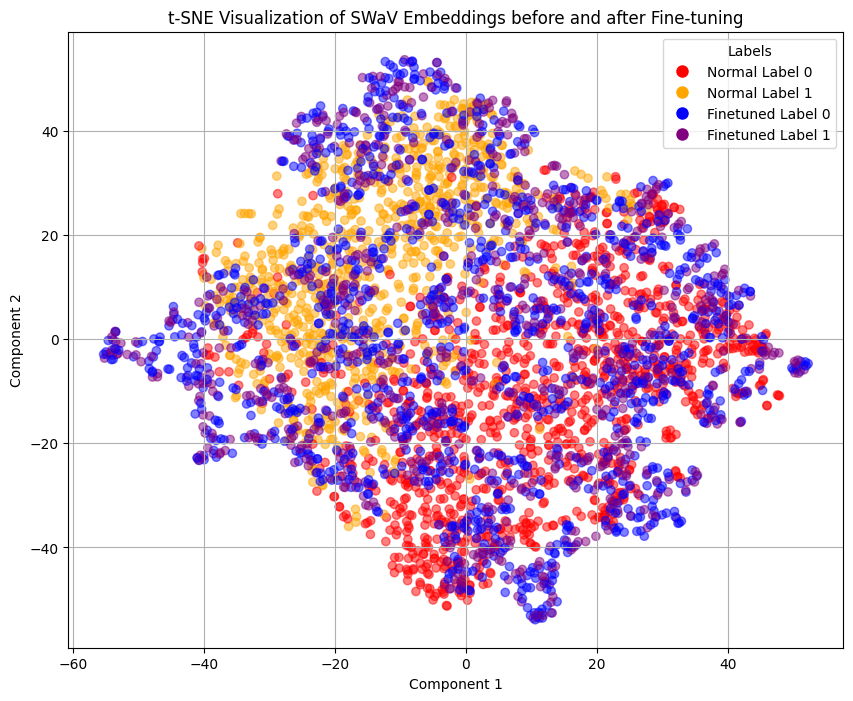

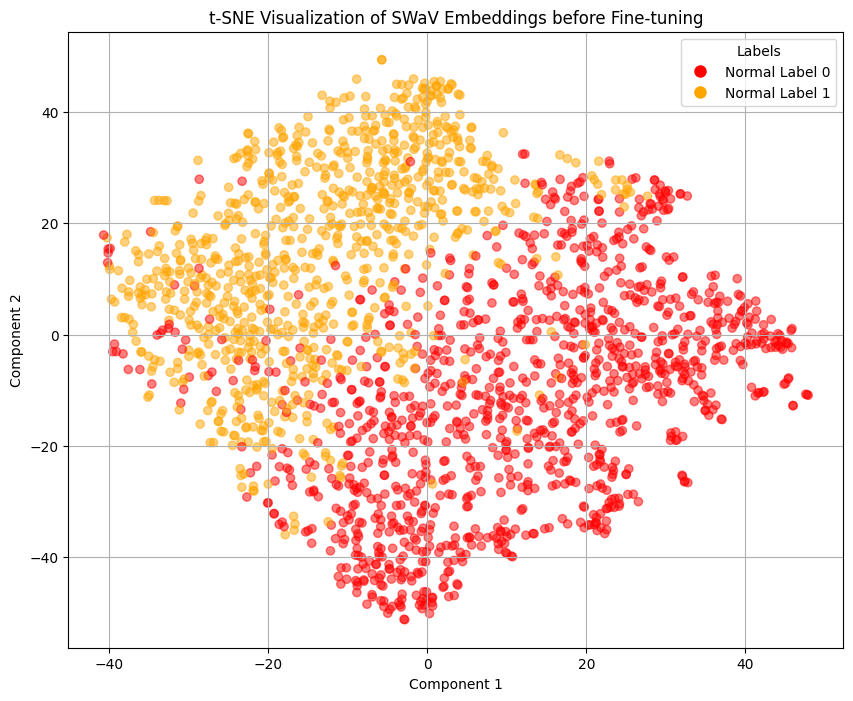

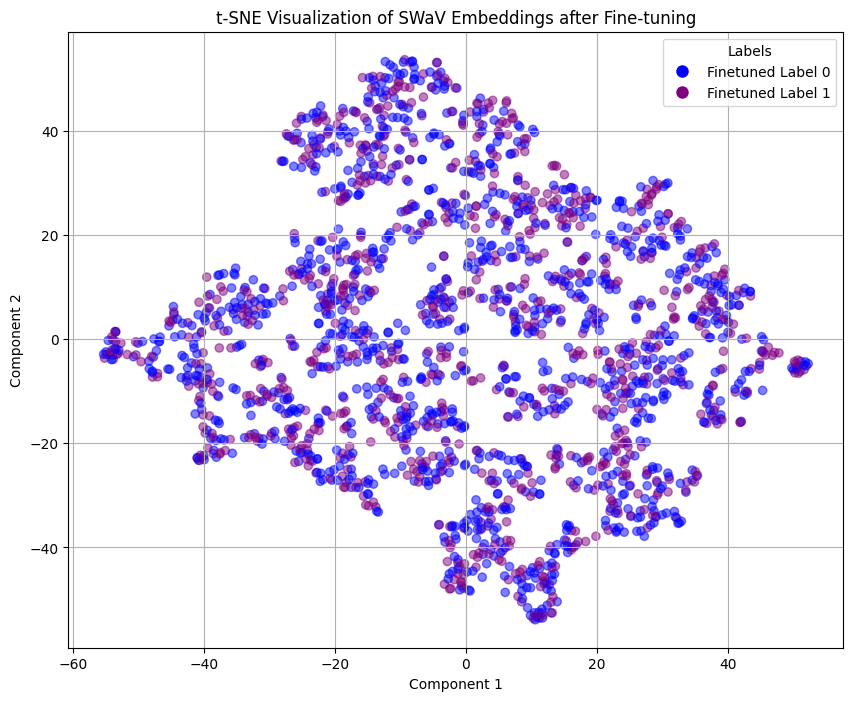

In [12]:
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"

temp_dataloader = torch.utils.data.DataLoader(
    valid_dataset,
    batch_size=512,
    shuffle=True,
    drop_last=False,
    num_workers=0,
)

def extract_features(model, dataloader):
    model.eval()
    features_list = []
    labels_list = []
    total = 0
    limit = 2000

    with torch.no_grad():
        for batch in dataloader:
            print(f"Total {total}/{limit}")  # Check the shape of the images tensor
            images = batch[0]  # Extract images from the batch
            
            if total >= limit:
                break

            total += len(images)
            
            # Check if images are in a list (multi-crop)
            if isinstance(images, list):
                # Concatenate along batch dimension after ensuring each image has correct dimensions
                images = torch.cat([img.unsqueeze(0) for img in images], dim=0)  # This assumes each img is already (C,H,W)

            # Move images to device
            images = images.to(device)

            labels = batch[1].numpy()  # Get labels (for plotting)

            features = model(images)  # Get embeddings from the model

            features_list.append(features.cpu().numpy())
            labels_list.append(labels)

    return np.concatenate(features_list), np.concatenate(labels_list)


finetuned_swav_resnet = SwaVmodel.backbone.to(device)

# Use the pretrained SwAV ResNet model as the backbone
swav_resnet = torch.hub.load('facebookresearch/swav:main', 'resnet50').to(device)
swav_resnet = nn.Sequential(*list(swav_resnet.children())[:-1])  # Remove last layer like in model

print(f"Extracting features from finetuned pretrained model")
finetuned_features, labels = extract_features(finetuned_swav_resnet, temp_dataloader)
print(f"Extracting features from normal pretrained model")
normal_features, labels = extract_features(swav_resnet, temp_dataloader)

normal_features = np.squeeze(normal_features, axis=(2, 3))
finetuned_features = np.squeeze(finetuned_features, axis=(2, 3))

# Check if labels are extracted correctly
print("Unique Labels:", np.unique(labels))  # Should show unique class labels


# Step 7: Apply t-SNE for Dimensionality Reduction to 2D
tsne = TSNE(n_components=2)
normal_features_tsne = tsne.fit_transform(normal_features)

tsne = TSNE(n_components=2)
finetuned_features_tsne = tsne.fit_transform(finetuned_features)

# Step 9: Plotting function for t-SNE results
def plot_embeddings(normal_embeddings, finetuned_embeddings, title):
    plt.figure(figsize=(10, 8))
    
    handles = []
    if normal_embeddings is not None:
        colors = {0: 'red', 1: 'orange'}
        color_list = [colors[label] for label in labels]
        handles += [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=f'Normal Label {label}')
                for label, color in colors.items()]
        plt.scatter(normal_embeddings[:, 0], normal_embeddings[:, 1], c=color_list, alpha=0.5)
    
    if finetuned_embeddings is not None:
        colors = {0: 'blue', 1: 'purple'}
        color_list = [colors[label] for label in labels]
        handles += [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=f'Finetuned Label {label}')
                for label, color in colors.items()]
        plt.scatter(finetuned_embeddings[:, 0], finetuned_embeddings[:, 1], c=color_list, alpha=0.5)
    
    # Create a legend
    plt.legend(handles=handles, title='Labels')
    
    plt.title(title)
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.grid(True)
    plt.show()

# Plot t-SNE results
plot_embeddings(normal_features_tsne, finetuned_features_tsne, 't-SNE Visualization of SWaV Embeddings before and after Fine-tuning')
plot_embeddings(normal_features_tsne, None, 't-SNE Visualization of SWaV Embeddings before Fine-tuning')
plot_embeddings(None, finetuned_features_tsne, 't-SNE Visualization of SWaV Embeddings after Fine-tuning')

In [25]:
# Slighly increase the learning rate, train the entire model.
# Another thing to try is to reduce the number of steps with frozen prototypes

accelerator = "gpu" if torch.cuda.is_available() else "cpu"
device = "cuda" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta

# Define the transformation using SwaVTransform

import torchvision.transforms as transforms
from lightly.transforms.swav_transform import SwaVTransform

# Reduce the number of crops
transform = SwaVTransform(
  crop_counts=(1,2),
  cj_prob=0,
  random_gray_scale=0,
  gaussian_blur=0,
  hf_prob=0,
  vf_prob=0,
)

def target_transform(t):
  return 0

fine_tuning_train_dataset = AirbusDataset(
    finetuning_train_background_filenames,
    finetuning_train_target_filenames,
    transform=SwaVTransform(),
    target_transform=target_transform,
  )

fine_tuning_valid_dataset = AirbusDataset(
    finetuning_valid_background_filenames,
    finetuning_valid_target_filenames,
    transform=SwaVTransform(),
    target_transform=target_transform,
  )

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0


num_epochs = 30

train_dataloader = torch.utils.data.DataLoader(
    fine_tuning_train_dataset,
    batch_size=64,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

valid_dataloader = torch.utils.data.DataLoader(
  fine_tuning_valid_dataset,
  batch_size=64,
  shuffle=False,
  drop_last=True,
  num_workers=NUM_WORKERS,
)
  


SwaVmodel = SwaVQueue(
  sinkhorn_epsilon=0.04,
  use_sgd_optim=True,
  lr=0.02,
  final_lr=0.0006,
  nmb_training_steps=len(train_dataloader) * num_epochs,
  n_steps_frozen_prototypes=313,
  use_queue_after_n_epoch=2,
  nmb_prototypes=6000,
  use_bn_on_projection_head=False,
).to(device)
SwaVmodel.train()

# SwaVmodel = torch.compile(SwaVmodel)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_finetuning_92.5_p_higher_prototypes")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=num_epochs,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every quarter epoch
        # every_n_train_steps=(len(dataset) // 512) // 8,
        # every_n_epochs=1,
        # Save checkpoints every 20 minutes
        train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss:.4f}-{train_loss:.4f}",
      ),
      # EarlyStopping(monitor="val_loss", mode="min", patience=7),
    ],
    # TODO: Test training with full half precision
    # precision="bf16-true"
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
    # Since the epochs are very long (dataset of +300k samples)
    # check the validation loss more frequently
    # val_check_interval=1,
    # Disable gradient clipping
    # gradient_clip_val=0.5,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  

  trainer.fit(
    model=SwaVmodel,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    # ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_2/checkpoints/last.ckpt"
  )

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Training the model...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                     | Params | Mode 
---------------------------------------------------------------------
0 | backbone        | Sequential               | 23.5 M | train
1 | projection_head | CustomSwaVProjectionHead | 1.1 M  | train
2 | prototypes      | SwaVPrototypes           | 774 K  | train
3 | queues          | ModuleList               | 0      | train
4 | criterion       | SwaVLoss                 | 0      | train
---------------------------------------------------------------------
25.4 M    Trainable params
0         Non-trainable params
25.4 M    Total params
101.587   Total estimated model params size (MB)
162       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Epoch 0:  33%|███▎      | 1604/4893 [36:15<1:14:21,  0.74it/s, v_num=40, train_loss=8.300]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

In [ ]:
# Slighly increase the learning rate, train the entire model.
# Another thing to try is to reduce the number of steps with frozen prototypes

accelerator = "gpu" if torch.cuda.is_available() else "cpu"
device = "cuda" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta

# Define the transformation using SwaVTransform

import torchvision.transforms as transforms
from lightly.transforms.swav_transform import SwaVTransform

# Reduce the number of crops
transform = SwaVTransform(
  crop_counts=(1,2),
  cj_prob=0,
  random_gray_scale=0,
  gaussian_blur=0,
  hf_prob=0,
  vf_prob=0,
)

def target_transform(t):
  return 0

fine_tuning_train_dataset = AirbusDataset(
    finetuning_train_background_filenames,
    finetuning_train_target_filenames,
    transform=SwaVTransform(),
    target_transform=target_transform,
  )

fine_tuning_valid_dataset = AirbusDataset(
    finetuning_valid_background_filenames,
    finetuning_valid_target_filenames,
    transform=SwaVTransform(),
    target_transform=target_transform,
  )

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0


num_epochs = 30

train_dataloader = torch.utils.data.DataLoader(
    fine_tuning_train_dataset,
    batch_size=64,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

valid_dataloader = torch.utils.data.DataLoader(
  fine_tuning_valid_dataset,
  batch_size=64,
  shuffle=False,
  drop_last=True,
  num_workers=NUM_WORKERS,
)
  


SwaVmodel = SwaVQueue(
  sinkhorn_epsilon=0.02,
  use_sgd_optim=True,
  lr=0.02,
  final_lr=0.0006,
  nmb_training_steps=len(train_dataloader) * num_epochs,
  n_steps_frozen_prototypes=313,
  use_queue_after_n_epoch=2,
  nmb_prototypes=3000,
  use_bn_on_projection_head=False,
  pretrained=False,
).to(device)
SwaVmodel.train()

# SwaVmodel = torch.compile(SwaVmodel)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_not_pretrained")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=num_epochs,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every quarter epoch
        # every_n_train_steps=(len(dataset) // 512) // 8,
        # every_n_epochs=1,
        # Save checkpoints every 20 minutes
        train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss:.4f}-{train_loss:.4f}",
      ),
      # EarlyStopping(monitor="val_loss", mode="min", patience=7),
    ],
    # TODO: Test training with full half precision
    # precision="bf16-true"
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
    # Since the epochs are very long (dataset of +300k samples)
    # check the validation loss more frequently
    # val_check_interval=1,
    # Disable gradient clipping
    # gradient_clip_val=0.5,
    accumulate_grad_batches=8,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  

  trainer.fit(
    model=SwaVmodel,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    # ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_2/checkpoints/last.ckpt"
  )

Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                     | Params | Mode 
---------------------------------------------------------------------
0 | backbone        | Sequential               | 23.5 M | train
1 | projection_head | CustomSwaVProjectionHead | 1.1 M  | train
2 | prototypes      | SwaVPrototypes           | 387 K  | train
3 | queues          | ModuleList               | 0      | train
4 | criterion       | SwaVLoss                 | 0      | train
---------------------------------------------------------------------
25.0 M    Trainable params
0         Non-trainable params
25.0 M    Total params
100.039   Total estimated model params size (MB)
162       Modules in train mode
0         Modules in eval mode


Training the model...
Epoch 2:  35%|███▌      | 1716/4893 [39:11<1:12:34,  0.73it/s, v_num=0, train_loss=7.990, val_loss=7.880]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

In [ ]:
# Set sinkhorn epsilon to 0.01 . A hail marry to see if the model can actually converge.

accelerator = "gpu" if torch.cuda.is_available() else "cpu"
device = "cuda" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta

# Define the transformation using SwaVTransform

import torchvision.transforms as transforms
from lightly.transforms.swav_transform import SwaVTransform

# Reduce the number of crops
transform = SwaVTransform(
  crop_counts=(1,2),
  cj_prob=0,
  random_gray_scale=0,
  gaussian_blur=0,
  hf_prob=0,
  vf_prob=0,
)

def target_transform(t):
  return 0

fine_tuning_train_dataset = AirbusDataset(
    finetuning_train_background_filenames,
    finetuning_train_target_filenames,
    transform=SwaVTransform(),
    target_transform=target_transform,
  )

fine_tuning_valid_dataset = AirbusDataset(
    finetuning_valid_background_filenames,
    finetuning_valid_target_filenames,
    transform=SwaVTransform(),
    target_transform=target_transform,
  )

# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0


num_epochs = 30

train_dataloader = torch.utils.data.DataLoader(
    fine_tuning_train_dataset,
    batch_size=64,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

valid_dataloader = torch.utils.data.DataLoader(
  fine_tuning_valid_dataset,
  batch_size=64,
  shuffle=False,
  drop_last=True,
  num_workers=NUM_WORKERS,
)
  


SwaVmodel = SwaVQueue(
  sinkhorn_epsilon=0.01,
  use_sgd_optim=True,
  lr=0.03,
  final_lr=0.0006,
  nmb_training_steps=len(train_dataloader) * num_epochs,
  n_steps_frozen_prototypes=313,
  use_queue_after_n_epoch=1,
  nmb_prototypes=3000,
  use_bn_on_projection_head=False,
  pretrained=False,
).to(device)
SwaVmodel.train()

# SwaVmodel = torch.compile(SwaVmodel)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('finetuning/tensorboard_logs', name=f"swav_not_pretrained")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=num_epochs,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every quarter epoch
        # every_n_train_steps=(len(dataset) // 512) // 8,
        # every_n_epochs=1,
        # Save checkpoints every 20 minutes
        train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss:.4f}-{train_loss:.4f}",
      ),
      # EarlyStopping(monitor="val_loss", mode="min", patience=7),
    ],
    # TODO: Test training with full half precision
    # precision="bf16-true"
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
    # Since the epochs are very long (dataset of +300k samples)
    # check the validation loss more frequently
    # val_check_interval=1,
    # Disable gradient clipping
    # gradient_clip_val=0.5,
    accumulate_grad_batches=8,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0

  

  trainer.fit(
    model=SwaVmodel,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    # ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_2/checkpoints/last.ckpt"
  )

Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3080 Ti') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


Training the model...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                     | Params | Mode 
---------------------------------------------------------------------
0 | backbone        | Sequential               | 23.5 M | train
1 | projection_head | CustomSwaVProjectionHead | 1.1 M  | train
2 | prototypes      | SwaVPrototypes           | 387 K  | train
3 | queues          | ModuleList               | 0      | train
4 | criterion       | SwaVLoss                 | 0      | train
---------------------------------------------------------------------
25.0 M    Trainable params
0         Non-trainable params
25.0 M    Total params
100.039   Total estimated model params size (MB)
162       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Epoch 0:  26%|██▌       | 1282/4893 [30:00<1:24:31,  0.71it/s, v_num=2, train_loss=8.150]

d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:384: `ModelCheckpoint(monitor='val_loss')` could not find the monitored key in the returned metrics: ['train_loss', 'epoch', 'step']. HINT: Did you call `log('val_loss', value)` in the `LightningModule`?


Epoch 0:  64%|██████▍   | 3122/4893 [1:12:52<41:20,  0.71it/s, v_num=2, train_loss=8.170]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

### Finetuning training summary and conclusion

Throughout these attempts we tried varying many aspects of the training process. Some of them are:
- The batch size
- The sinkhorn epsilon value
- Using or not using gradient clipping
- Training only the last layers (finetuning) or training the whole network (with and without pretrained weights)
- Reducing the data augmentation in the SWaVTransform
- Switching the optimizer from Adam to SGD
- The learning rate
- The number of prototypes

However, all attempts resulted in the model yielding a NaN train_loss or plateauing in ln(nmb_prototypes). This is explained in the [Github page](https://github.com/facebookresearch/swav?tab=readme-ov-file#common-issues) as the model mapping all images to the same representation, and some tips are given to avoid this from happening that we tried to implement, however, we weren't successful.

We think this might be happening because the examples of this dataset are too similar to each other and thus the model is not mapping the images with turbines to a different representation from the images without turbines. Perhaps a more diverse dataset - like Imagenet, the dataset used in the SWaV paper - is needed for the training to yield good results and to avoid this "system collapse at the beggining" problem.

Given this situation, we'll build our classifier using the pretrained model directly since it's the one that better separates the examples with and without wind turbines.

#### Comparison of representations of pretrained models and "finetuned" models

Here we'll show the t-SNE visualization of the representations of some of the models that we tried to train/finetune.

In [28]:
# Define the path to the checkpoint file
models_to_load = [
  {
    "hyperparameters": { 
        "sinkhorn_epsilon": 0.01,
        "use_sgd_optim": True,
        "lr": 0.03,
        "final_lr": 0.0006,
        "nmb_training_steps": len(train_dataloader) * num_epochs,
        "n_steps_frozen_prototypes": 313,
        "use_queue_after_n_epoch": 1,
        "nmb_prototypes": 3000,
        "use_bn_on_projection_head": False,
        "pretrained": False,
    },
    "checkpoint_path": "finetuning/tensorboard_logs/swav_not_pretrained/version_0/checkpoints/last.ckpt",
  },
  {
    "hyperparameters": {},
    "checkpoint_path": 'finetuning/tensorboard_logs/swav_finetuning_92.5_p_samples/version_7/checkpoints/last.ckpt',
  },
  {
    "hyperparameters": {
        "sinkhorn_epsilon": 0.02,
        "use_sgd_optim": True,
        "lr": 4.2,
        "final_lr": 0,
        "nmb_training_steps": len(train_dataloader) * num_epochs,
        "n_steps_frozen_prototypes": 1024,
        "use_queue_after_n_epoch": 2,
        "nmb_prototypes": 1024,
    },
    "checkpoint_path": "finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_3/checkpoints/last.ckpt",
  },
]

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Extracting features from normal pretrained model
Total 0/2000
Total 512/2000
Total 1024/2000
Total 1536/2000
Total 2048/2000
Unique Labels: [0 1]


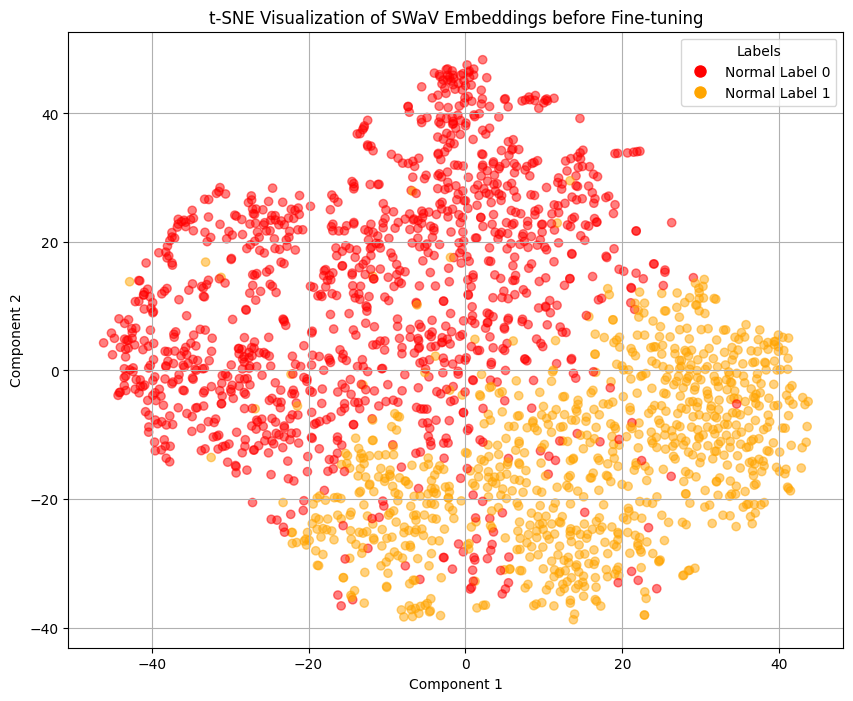

torch.Size([1, 3000])

Total 0/2000
Total 512/2000
Total 1024/2000
Total 1536/2000
Total 2048/2000


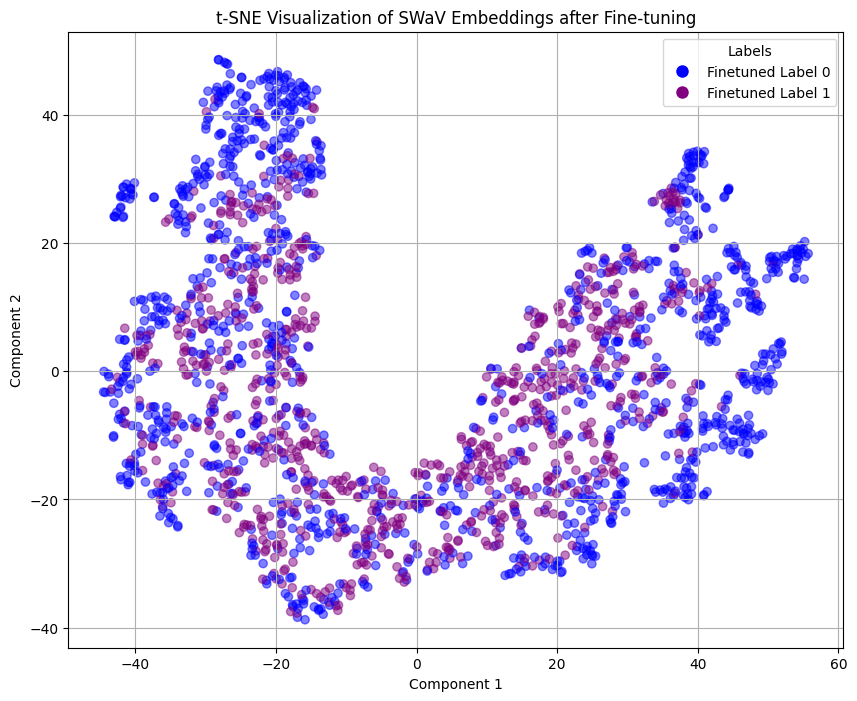

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main


torch.Size([1, 512])

Total 0/2000
Total 512/2000
Total 1024/2000
Total 1536/2000
Total 2048/2000


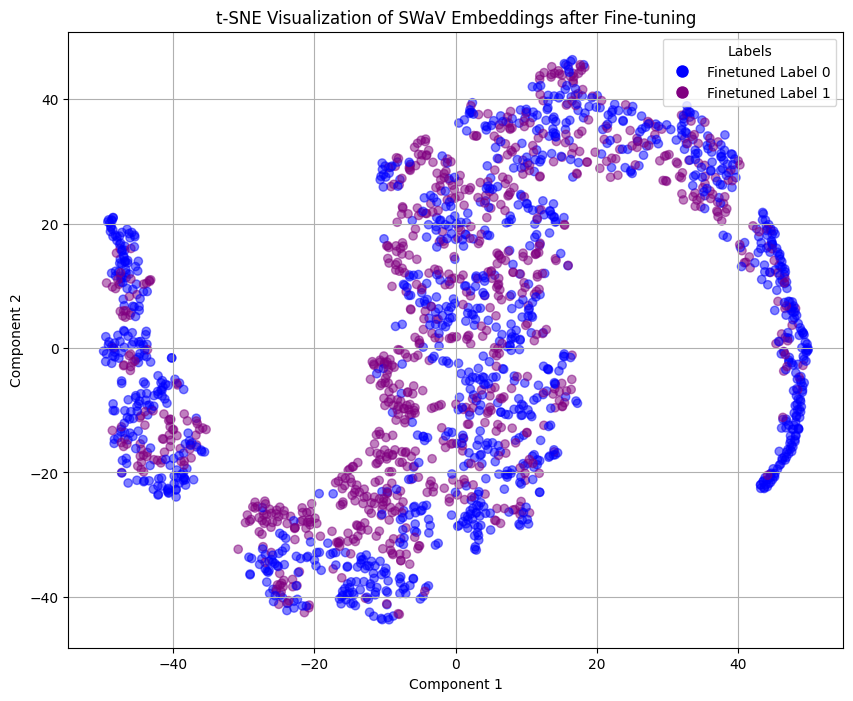

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main


torch.Size([1, 1024])

Total 0/2000
Total 512/2000
Total 1024/2000
Total 1536/2000
Total 2048/2000


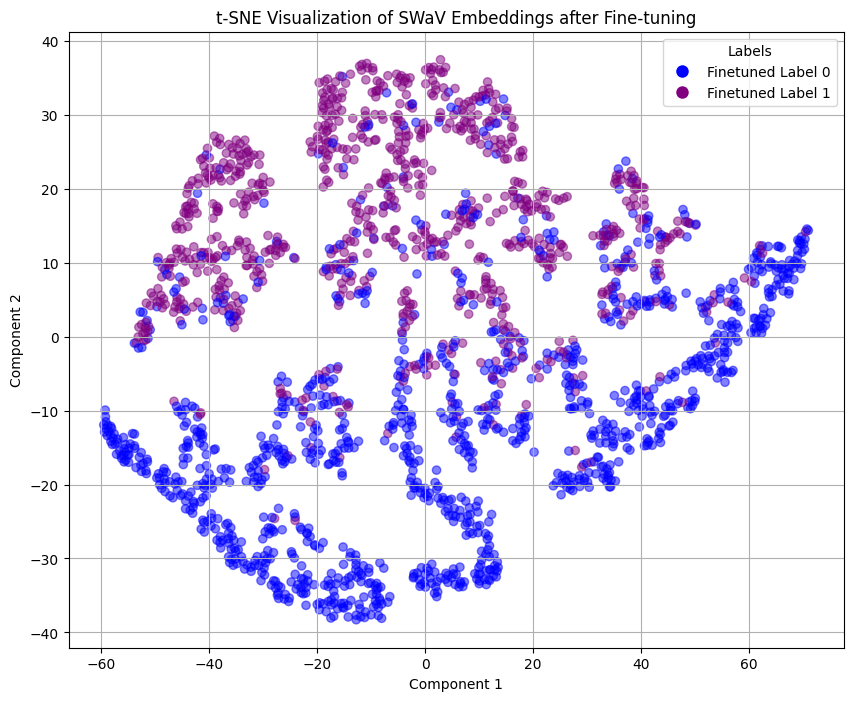

In [ ]:
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt


temp_dataloader = torch.utils.data.DataLoader(
    valid_dataset,
    batch_size=512,
    shuffle=True,
    drop_last=False,
    num_workers=0,
)


def extract_features(model, dataloader):
    model.eval()
    features_list = []
    labels_list = []
    total = 0
    limit = 2000

    with torch.no_grad():
        for batch in dataloader:
            print(f"Total {total}/{limit}")  # Check the shape of the images tensor
            images = batch[0]  # Extract images from the batch
            
            if total >= limit:
                break

            total += len(images)
            
            # Check if images are in a list (multi-crop)
            if isinstance(images, list):
                # Concatenate along batch dimension after ensuring each image has correct dimensions
                images = torch.cat([img.unsqueeze(0) for img in images], dim=0)  # This assumes each img is already (C,H,W)

            # Move images to device
            images = images.to(device)

            labels = batch[1].numpy()  # Get labels (for plotting)

            features = model(images)  # Get embeddings from the model

            features_list.append(features.cpu().numpy())
            labels_list.append(labels)

    return np.concatenate(features_list), np.concatenate(labels_list)

def plot_embeddings(normal_embeddings, finetuned_embeddings, title):
    plt.figure(figsize=(10, 8))
    
    handles = []
    if normal_embeddings is not None:
        colors = {0: 'red', 1: 'orange'}
        color_list = [colors[label] for label in labels]
        handles += [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=f'Normal Label {label}')
                for label, color in colors.items()]
        plt.scatter(normal_embeddings[:, 0], normal_embeddings[:, 1], c=color_list, alpha=0.5)
    
    if finetuned_embeddings is not None:
        colors = {0: 'blue', 1: 'purple'}
        color_list = [colors[label] for label in labels]
        handles += [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=f'Finetuned Label {label}')
                for label, color in colors.items()]
        plt.scatter(finetuned_embeddings[:, 0], finetuned_embeddings[:, 1], c=color_list, alpha=0.5)
    
    # Create a legend
    plt.legend(handles=handles, title='Labels')
    
    plt.title(title)
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.grid(True)
    plt.show()


# Use the pretrained SwAV ResNet model as the backbone
swav_resnet = torch.hub.load('facebookresearch/swav:main', 'resnet50').to(device)
swav_resnet = nn.Sequential(*list(swav_resnet.children())[:-1])  # Remove last layer like in model

print(f"Extracting features from normal pretrained model")
normal_features, labels = extract_features(swav_resnet, temp_dataloader)

normal_features = np.squeeze(normal_features, axis=(2, 3))

# Check if labels are extracted correctly
print("Unique Labels:", np.unique(labels))  # Should show unique class labels


tsne = TSNE(n_components=2)
normal_features_tsne = tsne.fit_transform(normal_features)


# Plot t-SNE results
plot_embeddings(normal_features_tsne, None, 't-SNE Visualization of SWaV Embeddings before Fine-tuning')

for model in models_to_load:
    # Load the model from the checkpoint
    loaded_swav_model = SwaVQueue.load_from_checkpoint(model["checkpoint_path"], **model["hyperparameters"])

    # Set the model to evaluation mode
    loaded_swav_model.eval()

    # Test the loaded model with a sample image
    display(loaded_swav_model.forward(train_dataset[0][0].unsqueeze(0).to(device='cuda')).shape)
    
    finetuned_swav_resnet = loaded_swav_model.backbone.to(device)

    finetuned_features, labels = extract_features(finetuned_swav_resnet, temp_dataloader)
    
    finetuned_features = np.squeeze(finetuned_features, axis=(2, 3))
    
    tsne = TSNE(n_components=2)
    finetuned_features_tsne = tsne.fit_transform(finetuned_features)
    
    plot_embeddings(None, finetuned_features_tsne, 't-SNE Visualization of SWaV Embeddings after Fine-tuning')

Surprisingly, the last model actually seems to have been able to separate the representations with different labels. We'll build a classifier using the normal pretrained model and this finetuned model to check if there are any differences.

## Classification downstream task with fine tuned SWaV model

#### Model definition

In [26]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from torchmetrics.classification import F1Score
from torch import nn

accelerator = "gpu" if torch.cuda.is_available() else "cpu"
device = "cuda" if torch.cuda.is_available() else "cpu"

class ClassificatorWithSwaV(pl.LightningModule):
    def __init__(self, swav_resnet_backbone):
        super().__init__()
        
        swav_resnet_backbone.eval()
        self.network = nn.Sequential(
            swav_resnet_backbone,
            nn.Flatten(start_dim=1, end_dim=-1),
            nn.Linear(in_features=2048, out_features=1024, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=1024, out_features=512, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=512, out_features=256, bias=True),
            nn.ReLU(),
            nn.Linear(in_features=256, out_features=2, bias=True),
        )

        self._initialize_weights()

        # Initialize losses and accuracies list for tracking loss over epochs
        self.train_losses = []
        self.train_accuracies = []
        self.val_losses = []
        self.val_accuracies = []
        self.test_losses = []
        self.test_accuracies = []
        
        # Store predictions and labels for confusion matrix
        self.register_buffer('val_preds', torch.empty(0, device=device))
        self.register_buffer('val_labels', torch.empty(0, device=device))
        self.register_buffer('test_preds', torch.empty(0, device=device))
        self.register_buffer('test_labels', torch.empty(0, device=device))
        
        self.f1 = F1Score('binary').to(device)

    def _initialize_weights(self):
      '''
      Initialize the network weights using the Xavier initialization.
      '''
      for x in self.modules():
        if isinstance(x, nn.Linear):
          torch.nn.init.xavier_uniform_(x.weight.data)
          if (x.bias is not None):
            x.bias.data.zero_()

    def forward(self, x):
        logits = self.network(x).flatten(start_dim=1)
        return logits

    def criterion(self, preds, targets): # , device):
      '''
      Function that calculates the loss and accuracy of a batch predicted by the model.
      '''
      ce            = nn.CrossEntropyLoss() # .to(device) # You don't need to change the loss function (but you can if it makes sense on your analysis)
      loss          = ce(preds, targets.long())
      pred_labels   = torch.max(preds.data, 1)[1] # same as argmax
      acc           = torch.sum(pred_labels == targets.data)
      n             = pred_labels.size(0)
      acc           = acc/n

      return loss, acc

    def training_step(self, batch, batch_idx):
        ims, targets = batch
        self.forward(ims)
        preds = self.network(ims)
        loss, acc = self.criterion(preds, targets) #, accelerator)

        # Store the loss value for plotting later
        self.train_losses.append(loss)
        self.train_accuracies.append(acc)
        self.log("train_loss", loss, prog_bar=True)
        self.log("train_accuracy", acc, prog_bar=True)

        return loss

    def validation_step(self, batch, batch_idx):
        ims, targets = batch
        self.forward(ims)
        preds = self.network(ims)
        pred_labels = preds.argmax(dim=1)
        loss, acc = self.criterion(preds, targets) #, accelerator)

        self.val_preds = torch.cat([self.val_preds, pred_labels], dim=0)
        self.val_labels = torch.cat([self.val_labels, targets], dim=0)
        
        self.val_losses.append(loss)
        self.val_accuracies.append(acc)
        self.log("val_loss", loss, prog_bar=True)
        self.log("val_accuracy", acc, prog_bar=True)
        
    def test_step(self, batch, batch_idx):
        ims, targets = batch
        self.forward(ims)
        preds = self.network(ims)
        pred_labels = preds.argmax(dim=1)
        loss, acc = self.criterion(preds, targets) #, accelerator)

        self.test_preds = torch.cat([self.test_preds, pred_labels], dim=0)
        self.test_labels = torch.cat([self.test_labels, targets], dim=0)
        
        self.test_losses.append(loss)
        self.test_accuracies.append(acc)
        self.log("test_loss", loss, prog_bar=True)
        self.log("test_accuracy", acc, prog_bar=True)

    def on_epoch_end(self):
        # Calculate and print average loss at the end of each epoch
        avg_loss = sum(self.losses) / len(self.losses) if self.losses else 0.0
        avg_accuracy = sum(self.accuracies) / len(self.accuracies) if self.accuracies else 0.0
        print(f"Epoch {self.current_epoch + 1}, Average Loss: {avg_loss:.4f}, Average Accuracy: {avg_accuracy:.4f}")

        # Clear losses, acuracies for the next epoch
        self.losses.clear()
        self.accuracies.clear()
        
    def on_validation_epoch_end(self):
        val_preds = self.val_preds
        val_labels = self.val_labels

        # Compute confusion matrix
        cm = confusion_matrix(val_labels.cpu().numpy(), val_preds.cpu().numpy())
        
        # Plot confusion matrix
        self.plot_confusion_matrix(cm)

        # Log the final F1 score for the epoch
        self.log('val_f1_epoch', self.f1(self.val_preds, self.val_labels), prog_bar=True)
        
        # Clear stored predictions and labels for the next epoch
        self.val_preds = torch.empty(0, device=device)
        self.val_labels = torch.empty(0, device=device)
    
    def on_test_epoch_end(self):
        test_preds = self.test_preds
        test_labels = self.test_labels

        # Compute confusion matrix
        cm = confusion_matrix(test_labels.cpu().numpy(), test_preds.cpu().numpy())
        
        # Plot confusion matrix
        self.plot_confusion_matrix(cm)
        
        # Log the final F1 score for the epoch
        self.log('test_f1_epoch', self.f1(self.test_preds, self.test_labels), prog_bar=True)

        # Clear stored predictions and labels for the next epoch
        self.test_preds = torch.empty(0, device=device)
        self.test_labels = torch.empty(0, device=device)

    def plot_confusion_matrix(self, cm, test=False):
        fig, ax = plt.subplots(figsize=(5, 4))

        sns.heatmap(cm/np.sum(cm), annot=True, fmt='.2%', cmap='Blues', ax=ax)
        ax.set_xlabel("Predicted labels")
        ax.set_ylabel("True labels")
        ax.set_title("Confusion Matrix")

        # Log confusion matrix to TensorBoard
        self.logger.experiment.add_figure(f"{"Test" if test else "Validation"} Confusion Matrix", fig, self.current_epoch)
        plt.close(fig)

    def configure_optimizers(self):
        optim = torch.optim.Adam(self.parameters(), lr=0.0001)
        return optim

# Test
swav_resnet = torch.hub.load('facebookresearch/swav:main', 'resnet50')
swav_resnet = nn.Sequential(*list(swav_resnet.children())[:-1])

classificator_with_swav_model = ClassificatorWithSwaV(swav_resnet).to(device)
classificator_with_swav_model.forward(train_dataset[0][0].unsqueeze(0).to(device))

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


tensor([[-0.1764, -0.0623]], device='cuda:0', grad_fn=<AddmmBackward0>)

### Using original pretrained SWaV model

In [7]:
accelerator = "gpu" if torch.cuda.is_available() else "cpu"
device = "cuda" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta


# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0

num_epochs = 30

train_dataloader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=len(train_dataset),
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

valid_dataloader = torch.utils.data.DataLoader(
  valid_dataset,
  batch_size=512,
  shuffle=False,
  drop_last=True,
  num_workers=NUM_WORKERS,
)
  
swav_resnet = torch.hub.load('facebookresearch/swav:main', 'resnet50')
swav_resnet = nn.Sequential(*list(swav_resnet.children())[:-1])
classificator_with_swav_model = ClassificatorWithSwaV(swav_resnet).to(device)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('classificator_with_swav/tensorboard_logs', name=f"2nd_exp_classificator_with_pretrained_swav")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=num_epochs,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every 20 minutes
        # train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss:.4f}-{val_f1_epoch:.4f}",
      ),
    ],
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
  
    log_every_n_steps=1,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0
  

  trainer.fit(
    model=classificator_with_swav_model,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    # ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_2/checkpoints/last.ckpt"
  )

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3080 Ti') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


Training the model...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type          | Params | Mode 
--------------------------------------------------
0 | network | Sequential    | 26.3 M | train
1 | f1      | BinaryF1Score | 0      | train
--------------------------------------------------
26.3 M    Trainable params
0         Non-trainable params
26.3 M    Total params
105.051   Total estimated model params size (MB)
10        Modules in train mode
150       Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Epoch 15: 100%|██████████| 1/1 [00:00<00:00,  3.43it/s, v_num=7, train_loss=2.86e-6, train_accuracy=1.000, val_loss=0.482, val_accuracy=0.925, val_f1_epoch=0.917] 


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

![2nd_exp_classificator_with_pretrained_swav_val_f1_rpoch.png](notebook_images/2nd_exp_classificator_with_pretrained_swav_val_f1_rpoch.png)

![2nd_exp_classificator_with_pretrained_swav_val_loss.png](notebook_images/2nd_exp_classificator_with_pretrained_swav_val_loss.png)

![2nd_exp_classificator_with_pretrained_swav_train_loss.png](notebook_images/2nd_exp_classificator_with_pretrained_swav_train_loss.png)

We'll choose the checkpoint that maximizes the validation F1 score.

In [25]:
# Define the path to the checkpoint file
checkpoint_path = 'classificator_with_swav/tensorboard_logs/2nd_exp_classificator_with_pretrained_swav/version_7/checkpoints/epoch=09-step=10-val_loss=0.2197-val_f1_epoch=0.9219.ckpt'

# Load the model from the checkpoint
swav_resnet = torch.hub.load('facebookresearch/swav:main', 'resnet50')
swav_resnet = nn.Sequential(*list(swav_resnet.children())[:-1])
classificator_with_swav_model = ClassificatorWithSwaV.load_from_checkpoint(checkpoint_path, swav_resnet_backbone=swav_resnet)

# Set the model to evaluation mode
classificator_with_swav_model.eval()

valid_dataloader = torch.utils.data.DataLoader(
    valid_dataset,
    batch_size=512,
    shuffle=False,
    drop_last=False,
    num_workers=NUM_WORKERS,
)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=512,
    shuffle=False,
    drop_last=False,
    num_workers=NUM_WORKERS,
)

trainer.test(classificator_with_swav_model, test_dataloader)
trainer.validate(classificator_with_swav_model, valid_dataloader)

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Testing: |          | 32/? [00:18<00:00,  1.75it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.



────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.9277389049530029
      test_f1_epoch         0.9196835160255432
        test_loss           0.22032730281352997
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Validation DataLoader 0: 100%|██████████| 31/31 [00:16<00:00,  1.83it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric           DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      val_accuracy          0.9298135042190552
      val_f1_epoch          0.92186844348907

[{'val_loss': 0.21974387764930725,
  'val_accuracy': 0.9298135042190552,
  'val_f1_epoch': 0.9218684434890747}]

### Using our 'finetuned' SWaV model

In [31]:
accelerator = "gpu" if torch.cuda.is_available() else "cpu"
device = "cuda" if torch.cuda.is_available() else "cpu"

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from datetime import timedelta


# On my local env, when num_workers > 0 the execution hangs
NUM_WORKERS = 0

num_epochs = 30

train_dataloader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=len(train_dataset),
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
  )

valid_dataloader = torch.utils.data.DataLoader(
  valid_dataset,
  batch_size=512,
  shuffle=False,
  drop_last=True,
  num_workers=NUM_WORKERS,
)

# Load last model from the ones that we plotted the representations
model_metadata = models_to_load[-1]
loaded_swav_model = SwaVQueue.load_from_checkpoint(model_metadata["checkpoint_path"], **model_metadata["hyperparameters"])
loaded_swav_model.eval()
    
finetuned_swav_resnet = loaded_swav_model.backbone.to(device)
classificator_with_swav_model = ClassificatorWithSwaV(finetuned_swav_resnet).to(device)


SHOULD_TRAIN = True


if not SHOULD_TRAIN:
  print("Skipping training, loading model from checkpoint")
else:
  print("Training the model...")

  logger = TensorBoardLogger('classificator_with_swav/tensorboard_logs', name=f"2nd_exp_classificator_with_finetuned_swav")

  trainer = pl.Trainer(
    logger=logger,
    max_epochs=num_epochs,
    devices=1,
    accelerator=accelerator,
    callbacks=[
      ModelCheckpoint(
        # Save all checkpoints
        save_top_k=99999,
        save_last=True,
        monitor="val_loss",
        mode="min",
        # # Save checkpoints every 20 minutes
        # train_time_interval=timedelta(minutes=30),
        filename="{epoch:02d}-{step:02d}-{val_loss:.4f}-{val_f1_epoch:.4f}",
      ),
    ],
    # Enable mixed precision to speed up training
    precision="bf16-mixed",
  
    log_every_n_steps=1,
  )
  
  # On my local env, when num_workers > 0 the execution hangs
  NUM_WORKERS = 0
  

  trainer.fit(
    model=classificator_with_swav_model,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
    # ckpt_path="finetuning/tensorboard_logs/swav_finetuning_92.5_p_mirroring_paper/version_2/checkpoints/last.ckpt"
  )

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type          | Params | Mode 
--------------------------------------------------
0 | network | Sequential    | 26.3 M | train
1 | f1      | BinaryF1Score | 0      | train
--------------------------------------------------
26.3 M    Trainable params
0         Non-trainable params
26.3 M    Total params
105.051   Total estimated model params size (MB)
10        Modules in train mode
150       Modules in eval mode


Training the model...
Sanity Checking: |          | 0/? [00:00<?, ?it/s]

d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\sklearn\metrics\_classification.py:409: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Epoch 29: 100%|██████████| 1/1 [00:17<00:00,  0.06it/s, v_num=0, train_loss=4.21e+10, train_accuracy=0.720, val_loss=4.41e+10, val_accuracy=0.801, val_f1_epoch=0.714]

`Trainer.fit` stopped: `max_epochs=30` reached.


Epoch 29: 100%|██████████| 1/1 [00:20<00:00,  0.05it/s, v_num=0, train_loss=4.21e+10, train_accuracy=0.720, val_loss=4.41e+10, val_accuracy=0.801, val_f1_epoch=0.714]


![2nd_exp_classificator_with_finetuned_swav_val_f1_epoch.png](notebook_images/2nd_exp_classificator_with_finetuned_swav_val_f1_epoch.png)

![2nd_exp_classificator_with_finetuned_swav_val_loss.png](notebook_images/2nd_exp_classificator_with_finetuned_swav_val_loss.png)

![2nd_exp_classificator_with_finetuned_swav_train_loss.png](notebook_images/2nd_exp_classificator_with_finetuned_swav_train_loss.png)

We'll choose the checkpoint that maximizes the validation F1 score.

In [32]:
# Define the path to the checkpoint file
checkpoint_path = 'classificator_with_swav/tensorboard_logs/2nd_exp_classificator_with_finetuned_swav/version_0/checkpoints/epoch=15-step=16-val_loss=151990910976.0000-val_f1_epoch=0.8406.ckpt'

# Load the model from the checkpoint
model_metadata = models_to_load[-1]
loaded_swav_model = SwaVQueue.load_from_checkpoint(model_metadata["checkpoint_path"], **model_metadata["hyperparameters"])
loaded_swav_model.eval()
    
finetuned_swav_resnet = loaded_swav_model.backbone.to(device)
classificator_with_swav_model = ClassificatorWithSwaV.load_from_checkpoint(checkpoint_path, swav_resnet_backbone=finetuned_swav_resnet).to(device)

# Set the model to evaluation mode
classificator_with_swav_model.eval()

valid_dataloader = torch.utils.data.DataLoader(
    valid_dataset,
    batch_size=512,
    shuffle=False,
    drop_last=False,
    num_workers=NUM_WORKERS,
)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=512,
    shuffle=False,
    drop_last=False,
    num_workers=NUM_WORKERS,
)

trainer.test(classificator_with_swav_model, test_dataloader)
trainer.validate(classificator_with_swav_model, valid_dataloader)

Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Using cache found in C:\Users\diego/.cache\torch\hub\facebookresearch_swav_main
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_worke

Testing DataLoader 0: 100%|██████████| 32/32 [00:17<00:00,  1.79it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
d:\Projects\MC959-Final-Project\pytorch_env\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.



────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.8547218441963196
      test_f1_epoch         0.8438727259635925
        test_loss             145920376832.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Validation DataLoader 0: 100%|██████████| 31/31 [00:17<00:00,  1.73it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric           DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      val_accuracy          0.8514364957809448
      val_f1_epoch          0.8405895233154297


[{'val_loss': 151990910976.0,
  'val_accuracy': 0.8514364957809448,
  'val_f1_epoch': 0.8405895233154297}]

### Summary

We can see that the original pretrained model was the one that led to the better performance (91.9% F1 score on the test set), while our 'finetuned' model reached only 84.4% F1 score on the test set.

## Summary of experiment with less samples for supervised training

When using few samples for the supervised samples, like the 50 samples chosen here (50% background and 50% target), the gains in performance by using SSRL did appear as expected.

Our supervised model reached 72.5% F1 score on the test set while the model using the pretrained SWaV reached 91.9% F1 score on the test set. This is a significant gain in performance basically "for free", since in this case we weren't even able to do the finetuning (despite trying various combinations of hyperparameters) and just used the pretrained model directly. If this were a real scenario where we just had 50 pictures to train with, just adding the pretrained SSRL model (in this case SWaV) would lead to a big increase in performance. We can conclude that in situations where only few labeled training samples are available, even if there isn't more unlabeled data available, the researcher/enginner should always experiment using pretrained SSRL models, since that's a performance gain that can be obtained basically "for free".

On another topic, we found that the SWaV model is a hard model to train. Not only does it demand a lot of computation power to train (which can be reduced by reducing the number of crops during training), but finding the right combination of hyperparameters does not seem to be trivial, at least for most datasets. Perhaps with a more diverse dataset the model converges more easily, but with our dataset we weren't able to avoid the "system collapsing and all images being mapped to the same representation" problem, despite following the tips given in the SWaV repository. This may be a problem specific to the SWaV model and the more traditional contrastive instance discrimination model / framework SimCLR might be easier to train in this regard.

### Possible follow ups

One interesting area that could be explored further is the hypothesis that we couldn't train SWaV because of our dataset. It would be interesting to test if, when using other datasets, the "system collapsing" problem also happens and with what frequency. If we found out that we just were making some mistake in the training process not specific to our dataset, we could then return and fine tune SWaV with this dataset, otherwise, it would become clearer what are the most effective datasets to train SWaV on.